# Some ideas for DoE Tests

In [1]:
import math

import luxpy as lx
import numpy as np
from matplotlib import pyplot
import seaborn as sns
import pandas as pd

# temp import only
from empir19nrm02.tools.help import strd, label_font_size, plot_cmf2, save_fig, get_target, label_management, \
    quantil, display_responsivity, get_fig_file_name

%run -i jhelp

%matplotlib inline

from empir19nrm02.tools.help import plotCorrelation
from empir19nrm02.spectral import MCSpectrumSamples, generate_FourierMC0
from empir19nrm02.tools import plotHistScales, plotHistScalesWl, plotHistScalesValue, \
    array2analyse, analyse_stat, seaborn_plot_basedata, seaborn_plot_result, sumMC, sumMCV, plotCorrMatrixSmall
from empir19nrm02.f1prime import py_f1PrimeG,  py_f1PrimeGlx

from empir19nrm02 import _SPD, _RES

from numpy.linalg import norm, inv
from scipy.stats import chi2

print('Version of luxpy:', lx.__version__)
out_dir = 'DoE'


Version of luxpy: v1.10.0


# Parameter for the simulation
#### Let's modify some standard data first and calculate some integrated values like $f_{1}^{'}$ and Yxy tristimulus values

In [2]:
strWeighting = 'A'
strObserver = '1931_2'
# let's use the V(Lambda) Function (0 ... X, 1...Y, 2...Z)
iObserverOffset = 1
wlResolution = 1
wlStart = 380
wlStop = 780
trials = 2000

bIdeal = False
bSimDetector = False    # True use RES for Simulation, False use SPD for simulation
selected_detector = 73
selected_SPD = 2 # 1=NLA, 2=L41

# MC Simulation
Define some data to work with (let's start with the $V(\lambda)$ function or a white PT-LED example)

In [3]:
lxCmf = lx._CMF['1931_2']
lxCmfInterpolate = lx.cie_interp(lxCmf['bar'], wl_new = np.arange(wlStart,wlStop+1,wlResolution), kind = 'S')
res = len(lxCmfInterpolate[0])

# Data storage
Take a nominal wavelength scale and the ideal detector/SPD and sore all together into a class instance SPD from luxpy

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


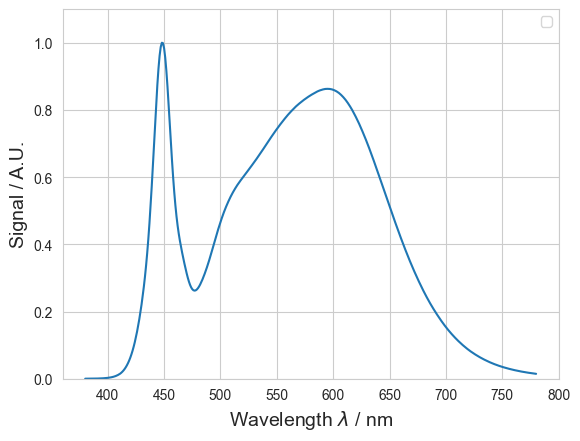

In [4]:
# Using a detector responsivity for the simulation
if bSimDetector:
    if bIdeal:
        # using an ideal detector
        wl=lxCmfInterpolate[0].reshape(1,res)
        value=lxCmfInterpolate[2].reshape(1,res)
        spd_init = np.r_[wl, value]
    else:
        # using an detector from the data base
        from empir19nrm02 import _RES
        wl= _RES['VLDetectors']['S']['data'][0].copy()
        value= _RES['VLDetectors']['S']['data'][selected_detector].copy()
        res_tmp = wl.shape[0]
        wl=wl.reshape(1,res_tmp)
        value=value.reshape(1,res_tmp)
        spd_org = np.r_[wl, value]
        spd_init = lx.cie_interp(spd_org, \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
# Using a SD for the simulation
else:
    if bIdeal:
        # using an ideal SD (e.g. illumiant L)
        lxSpdInterpolate = lx.cie_interp(lx._CIE_ILLUMINANTS['LED_L41'], \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S')
        wl=lxSpdInterpolate[0].reshape(1,res)
        value=lxSpdInterpolate[1].reshape(1,res)
        spd_init = np.r_[wl, value]
    else:
        # using a ideal SD from the PhotoLED project
        from empir19nrm02 import _SPD
        wl= _SPD['PHOTOLED']['S']['data'][0].copy()
        value= _SPD['PHOTOLED']['S']['data'][selected_SPD].copy()
        res_tmp = wl.shape[0]
        wl=wl.reshape(1,res_tmp)
        value=value.reshape(1,res_tmp)
        spd_org = np.r_[wl, value]
        spd_init = lx.cie_interp(spd_org, \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)

spd_init[1,:]=spd_init[1,:]/np.max(spd_init[1,:])

pyplot.plot( spd_init[0],spd_init[1])
pyplot.legend()
pyplot.xlabel('Wavelength $\lambda$ / nm', fontsize=label_font_size)
pyplot.ylabel('Signal / A.U.', fontsize=label_font_size)
pyplot.ylim([0,1.1])
save_fig(dir=out_dir, filename='L41')



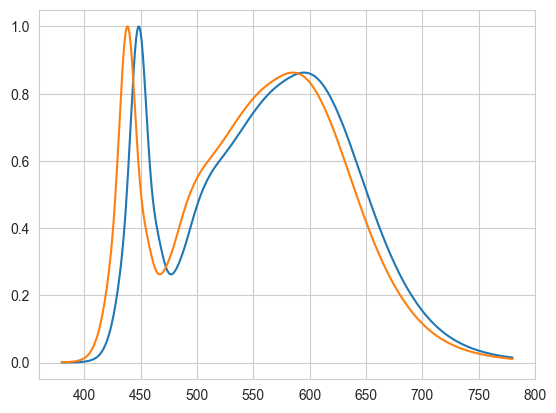

Yxy: [[5.2129e+04 3.7561e-01 3.7229e-01]]
Yxy_shift: [[5.3275e+04 3.6373e-01 3.7601e-01]]
Diff x: 0.011872577382095129, Diff y: -0.003720589447835043


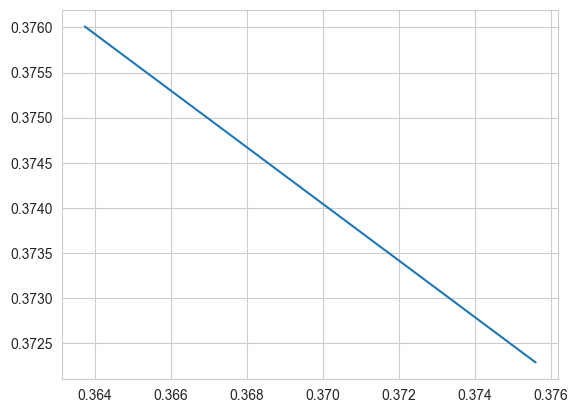

In [5]:
lxspd = lx.spd(spd_init)
XYZ = lx.spd_to_xyz( lxspd, relative=False, cieobs='1931_2')
Yxy = lx.xyz_to_Yxy (XYZ)


shift = 10
spd_wlshift = lx.cie_interp(spd_init, \
            wl_new = shift + np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
spd_wlshift[0] = spd_init[0]

pyplot.plot( spd_init[0],spd_init[1])
pyplot.plot( spd_wlshift[0],spd_wlshift[1])
pyplot.show()

XYZ_shift = lx.spd_to_xyz( spd_wlshift, relative=False, cieobs='1931_2')
Yxy_shift = lx.xyz_to_Yxy (XYZ_shift)

print('Yxy:', Yxy)
print('Yxy_shift:', Yxy_shift)
print(f'Diff x: {Yxy[0][1]-Yxy_shift[0][1]}, Diff y: {Yxy[0][2]-Yxy_shift[0][2]}')

pyplot.plot( [Yxy[0][1],Yxy_shift[0][1]],[Yxy[0][2],Yxy_shift[0][2]])


# Scale to reference?
* True:    all graphs will be shown as difference to the reference
* False:   all graphs will be shown as they are (without referencing the data)

In [6]:
scale_to_reference = True

# MC Steps?
All MC simulation include several steps (one step for every parameter in the model). The usage of these steps can be
selected here.

At the end, all selected parameters needs to be switched on together for the combined uncertainty.

The last version 'cov' means, that the simulation will be done based on the covaricane matrix and not based on the model
parameter variation.

In [7]:
mc_enable = { 'nothing': True,
              'wl_noise_nc': True,          # non correlated wavelength noise
              'wl_noise_c': True,           # correlated wavelength noise
              'wl_fourier_noise':True,      # fourier correlated wavelength noise
              'value_noise_nc': True,       # non correlated value noise
              'value_noise_c': True,        # correlated value noise
              'value_fourier_noise':True,   # fourier correlated value noise
              'all': True,                  # all components together
              'cov': False,                 # simulation based on the covariance matrix and multivariate gaussian noise only
              'file': False,                # simulation from a former simulation
              }

mc_disable = mc_enable.copy()
for key in mc_disable:
    mc_disable[key]=False

mc_cov = mc_disable.copy()
mc_cov['cov']=True

mc_file = mc_disable.copy()
mc_file['file']=True


In [8]:
# THX: https://stackoverflow.com/questions/7965743/how-can-i-set-the-aspect-ratio-in-matplotlib
def aspectratio_to_one( ax):
    ratio = 1.0
    x_left, x_right = ax.get_xlim()
    y_low, y_high = ax.get_ylim()
    ax.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

def showResults( samples, name):
    print( samples.MCTable)
    samples.MCTable.to_excel(get_fig_file_name(dir=out_dir, filename= name + '.xlsx', table=True))

    v_wl_ref, v_wl, v_wl_diff, v_mean, v_mean_diff, v_std, q_min, q_max, cov_image, corr_image, counts = samples.get_result()

    fig, ax1 = pyplot.subplots()
    ax1.plot( v_wl_ref, v_mean, label=name+' mean')
    ax1.plot( v_wl_ref, v_std, label=name+' std')
    ax1.fill_between( v_wl_ref, q_min, q_max)
    ax1.set_xlabel(strd['xlambda'], fontsize=label_font_size)
    ax1.set_ylabel( 'mean; stddev / A.U.', fontsize=label_font_size)
    ax1.legend()
    save_fig(dir=out_dir, filename=name)

    fig, ax1 = pyplot.subplots()
    ax1.plot( v_wl_ref, v_mean_diff, label=name+' mean diff')
    ax1.plot( v_wl_ref, v_std, label=name+' stddev')
    ax1.fill_between( v_wl_ref, q_min-v_mean, q_max-v_mean)
    ax1.set_xlabel(strd['xlambda'], fontsize=label_font_size)
    ax1.set_ylabel( 'mean dif; stddev / A.U.', fontsize=label_font_size)
    ax1.legend()
    save_fig(dir=out_dir, filename=name+'Diff')

    plotCorrelation( cov_image, v_wl_ref, name + 'Covariance')
    save_fig(dir=out_dir, filename=name+'cov')

    plotCorrelation( corr_image, v_wl_ref, name + 'Correlation')
    save_fig(dir=out_dir, filename=name+'corr')

    return cov_image

In [9]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# THX: https://matplotlib.org/devdocs/gallery/statistics/confidence_ellipse.html
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, fill=False, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# Running the MC simulation

# Generate a first MC Simulation
* take the initial spectral data (SD or responsivity)
* generate some noise on the value scale only
* run the MC simulation
* calculate statistical results
* save the data as csv and binary (okl) file
* show some results

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e-04   
0        value_noise_c    0   0.01  0       normal  0.375598  6.535312e-04   
0  value_fourier_noise    0   0.01  4            F  0.375600  9.519944e-04   
0                  all                              0.37564

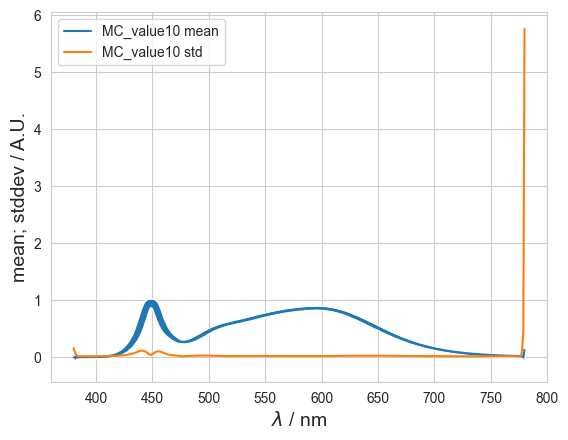

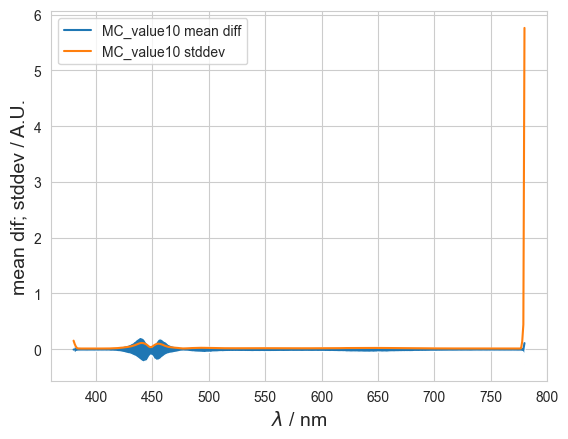

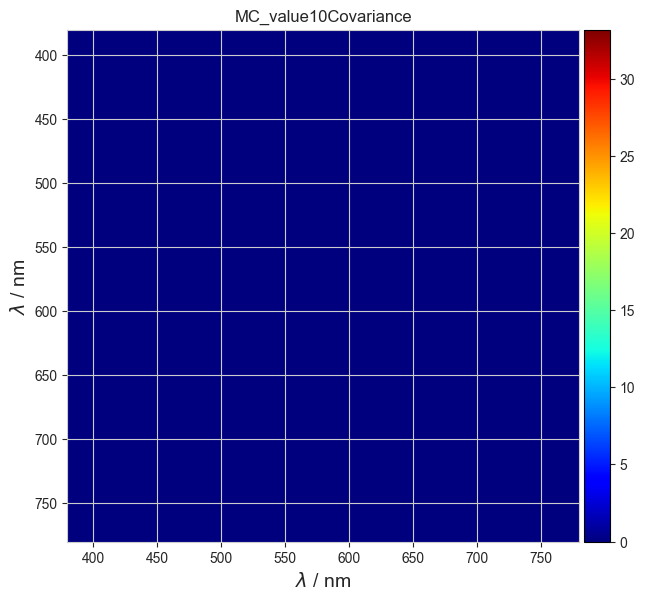

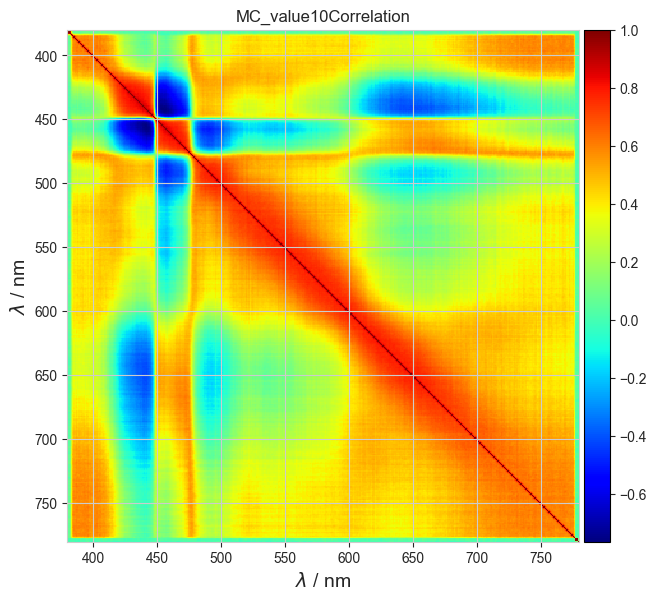

In [10]:
whished_results = ['x', 'y']
whished_results_str = [ 'x', 'y']

mcSpectrumSamples = MCSpectrumSamples(spd=spd_init, trials=trials)
mc_value = mc_enable.copy()
mcSpectrumSamples.run_MC(mc_value, whished_results)
mcSpectrumSamples.calc_summary(wavelength_stat=False)
mcSpectrumSamples.save_to_csv()
mcSpectrumSamples.save()

cov_image = showResults(mcSpectrumSamples, 'MC_value'+str(shift))

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e-04   
0        value_noise_c    0   0.01  0       normal  0.375598  6.535312e-04   
0  value_fourier_noise    0   0.01  4            F  0.375600  9.519944e-04   
0                  all                              0.37564

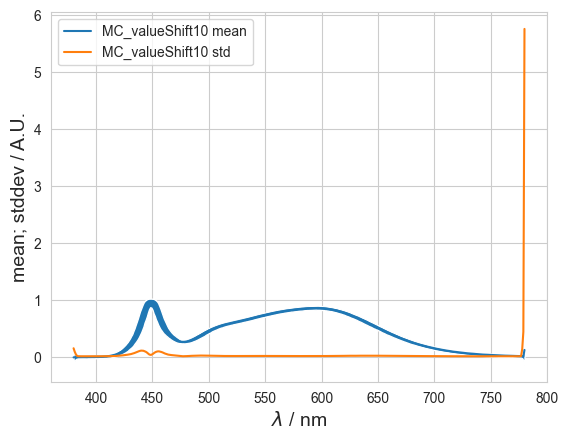

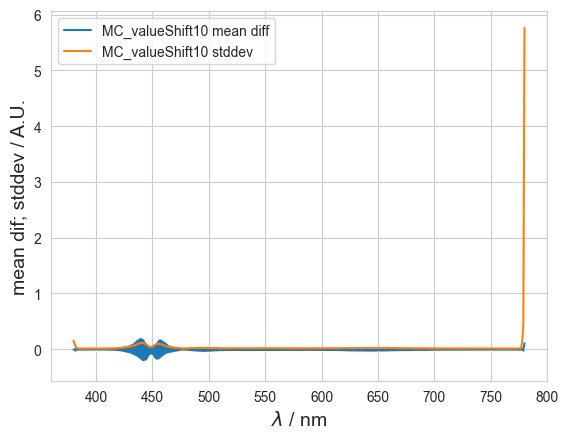

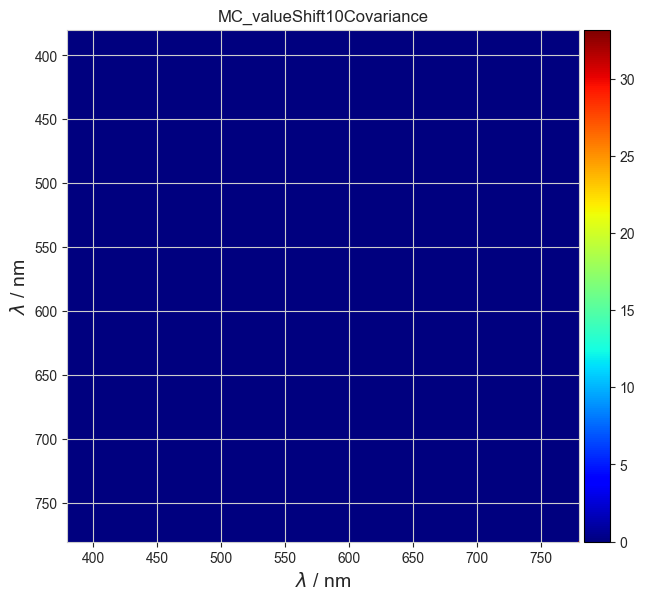

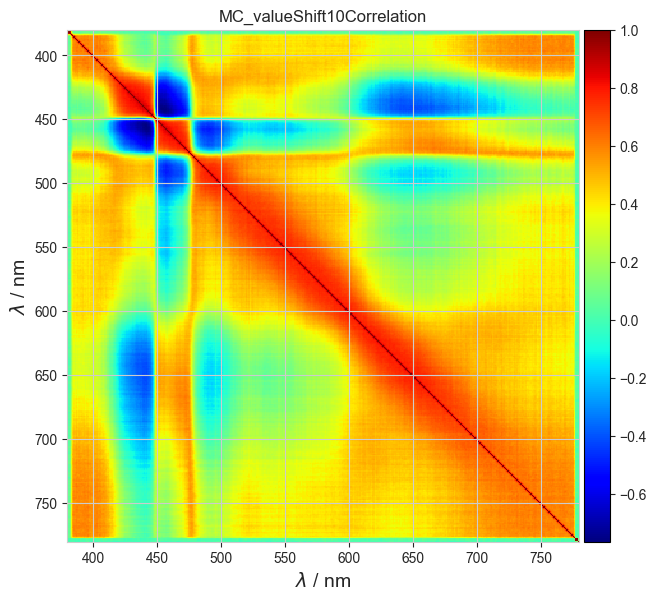

In [11]:
def make2ndMC( shift_loc, spd_shift):
    mcSpectrumSamples2 = MCSpectrumSamples(spd=spd_shift, trials=trials)
    mc_value = mc_enable.copy()
    mcSpectrumSamples2.run_MC(mc_value, whished_results)
    mcSpectrumSamples2.calc_summary(wavelength_stat=False)
    mcSpectrumSamples2.save_to_csv()
    mcSpectrumSamples2.save()
    return mcSpectrumSamples2

mcSpectrumSamples2 = make2ndMC(shift, spd_wlshift)
cov_image2 = showResults(mcSpectrumSamples, 'MC_valueShift'+str(shift))

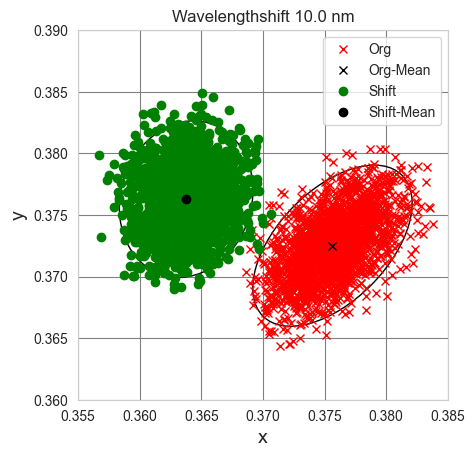

In [12]:
def plotxySingle(fig, ax1, shift_loc, mcSpectrumSamples2_loc, legend=True):
    ax1.plot(mcSpectrumSamples.spectrumResults.result['x']['data'],mcSpectrumSamples.spectrumResults.result['y']['data'], 'rx' , label = 'Org')
    ax1.plot(mcSpectrumSamples.spectrumResults.result['x']['Mean'],mcSpectrumSamples.spectrumResults.result['y']['Mean'], 'kx' , label = 'Org-Mean')
    ax1.plot(mcSpectrumSamples2_loc.spectrumResults.result['x']['data'],mcSpectrumSamples2_loc.spectrumResults.result['y']['data'] , 'go', label = 'Shift')
    ax1.plot(mcSpectrumSamples2_loc.spectrumResults.result['x']['Mean'],mcSpectrumSamples2_loc.spectrumResults.result['y']['Mean'], 'ko' , label = 'Shift-Mean')
    confidence_ellipse(mcSpectrumSamples.spectrumResults.result['x']['data'],mcSpectrumSamples.spectrumResults.result['y']['data'], ax1, n_std=2.45, edgecolor='k')
    confidence_ellipse(mcSpectrumSamples2_loc.spectrumResults.result['x']['data'],mcSpectrumSamples2_loc.spectrumResults.result['y']['data'], ax1, n_std=2.45, edgecolor='k')
    if legend:
        ax1.legend()
    ax1.grid(color='grey')
    ax1.set_xlabel('x', fontsize=label_font_size)
    ax1.set_ylabel('y', fontsize=label_font_size)
    ax1.grid(color='grey')
    ax1.set_xlim([0.355,0.385])
    ax1.set_ylim([0.360,0.390])
    if legend:
        ax1.set_title(f"Wavelengthshift {shift:.1f} nm")
    aspectratio_to_one(ax1)

    #save_fig(dir=out_dir, filename='xyBoth'+str(shift_loc))

fig, ax1 = pyplot.subplots()
plotxySingle(fig, ax1, shift, mcSpectrumSamples2)

In [13]:
def calcMeanCov(mcSpectrumSamples_loc):
    x1 = np.array((mcSpectrumSamples_loc.spectrumResults.result['x']['Mean'],mcSpectrumSamples_loc.spectrumResults.result['y']['Mean']))
    data_x1 = np.array((mcSpectrumSamples_loc.spectrumResults.result['x']['data'],mcSpectrumSamples_loc.spectrumResults.result['y']['data']))
    cov1 = mcSpectrumSamples_loc.spectrumResults.get_table_covariane(['x', 'y'])
    return x1, cov1

x1, cov1 = calcMeanCov(mcSpectrumSamples)
x2, cov2 = calcMeanCov(mcSpectrumSamples2)

print( x1, cov1)
print( x2, cov2)

[3.7564e-01 3.7250e-01] [[6.9687e-06 3.7031e-06]
 [3.7031e-06 7.1247e-06]]
[3.6377e-01 3.7629e-01] [[4.8977e-06 6.3402e-07]
 [6.3402e-07 6.7146e-06]]


Evaluation according to Zeier
https://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.513.2806

* multi variate degree of equivalence $\boldsymbol{d}_{i}$ is a vector of dimension $m$
* assuming an $m$-variate normal distribution
* $mxm$ covariance matrix
* confidence region around $\boldsymbol{d}_{i}$
* for $\chi_{m,\alpha}^{2}$ usually the inverse of the culmulative pdf of the $\chi^{2}$ distribution with $m$degrees of freedom for the confidence level $alpha=0.95$ is used. (Example  $\chi_{2,0.95}^{2}=6$) 

* $(\boldsymbol{x}-\boldsymbol{d}_{i})^{\mathrm{T}}{\boldsymbol{V}_{\boldsymbol{d}_{i}}}^{-1}(\boldsymbol{x}-\boldsymbol{d}_{i})=\chi_{m,\alpha}^{2}$

In [14]:
def calc_multiDim_DoE( x1_, cov1_, x2_, cov2_, data_=None):
    d = x1_-x2_
    V=cov1_+cov2_
    if data_ is None:
        data_ = np.random.default_rng().multivariate_normal(d, V, 1000)
        data_ = data_.T
    # We need to use the inverse of the cumulative distribution
    df=cov1_.shape[0]
    chisquare = chi2.ppf(0.95, df=df)

    d_norm = norm(d)
    print('chisquare:', chisquare)
    print('Difference Vecotr:', d, d_norm)
    print('Resulting Covariance Matrix:',V)
    d_y = math.sqrt(1./(d.T @ inv(V) @ d)*chisquare)
    print('dy:', d_y*d_norm)
    print('DoE:', 1/d_y)
    return d, d_y, V, data_

chisquare: 5.991464547107979
Difference Vecotr: [1.1878e-02 -3.7846e-03] 0.012465956816967664
Resulting Covariance Matrix: [[1.1866e-05 4.3371e-06]
 [4.3371e-06 1.3839e-05]]
dy: 0.007341019722211785
DoE: 1.6981233246451188


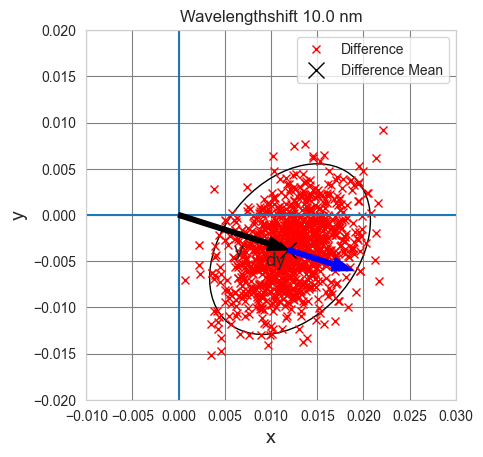

In [15]:
d, dy, V, data = calc_multiDim_DoE(x1, cov1, x2, cov2)

def plot_multi_DoE( fig, ax1, shift_loc, d_, dy_, V_, data_, legend=True):
    ax1.plot(data_[0], data_[1], 'rx' , label = 'Difference')
    ax1.plot(d_[0], d_[1], 'kx' , label = 'Difference Mean', markersize=12)
    confidence_ellipse(data_[0],data_[1], ax1, n_std=2.45, edgecolor='k')
    ax1.axvline(0)
    ax1.axhline(0)
    ax1.set_xlim([-0.01, 0.03])
    ax1.set_ylim([-0.02, 0.02])
    ax1.grid(color='grey')
    if legend:
        ax1.legend()
    ax1.arrow(0,0, d_[0], d_[1], width=.0005, color='black', length_includes_head=True, zorder=100)
    ax1.arrow(d_[0],d_[1], dy_*d_[0], dy_*d_[1], width=.0005, color='blue', length_includes_head=True, zorder=100)

    ax1.text(d_[0]/2, d_[1]/2-0.0025, "y",fontsize=label_font_size)
    ax1.text((dy_*d_[0]+d_[0])/2, (dy_*d_[1]+d_[1])/2-0.0025, "dy",fontsize=label_font_size)

    ax1.set_xlabel('x', fontsize=label_font_size)
    ax1.set_ylabel('y', fontsize=label_font_size)
    if legend:
        ax1.set_title(f"Wavelengthshift {shift:.1f} nm")

    aspectratio_to_one(ax1)


    #save_fig(dir=out_dir, filename='2dDoE'+str(shift_loc))

fig, ax1 = pyplot.subplots()
plot_multi_DoE( fig, ax1, shift, d, dy, V, data)

In [16]:
sd1 = mcSpectrumSamples.v_mean
sd2 = mcSpectrumSamples2.v_mean
d1, dy1, V1, data1 = calc_multiDim_DoE(sd1, cov_image, sd2, cov_image2)


chisquare: 448.690621241841
Difference Vecotr: [-5.9697e-03 -3.1146e-03 -1.3083e-03 -1.4533e-03 -9.1273e-04 -7.3116e-04
 -1.3174e-03 -1.0914e-03 -1.2737e-03 -1.9691e-03 -1.8443e-03 -2.8761e-03
 -3.0332e-03 -3.1530e-03 -4.1326e-03 -5.0880e-03 -5.7371e-03 -6.8037e-03
 -7.6726e-03 -9.4837e-03 -1.1044e-02 -1.2951e-02 -1.5618e-02 -1.8201e-02
 -2.1048e-02 -2.4217e-02 -2.8440e-02 -3.3053e-02 -3.8629e-02 -4.4376e-02
 -5.1070e-02 -5.8938e-02 -6.7415e-02 -7.5851e-02 -8.5570e-02 -9.6075e-02
 -1.0692e-01 -1.1946e-01 -1.3199e-01 -1.4537e-01 -1.5989e-01 -1.7587e-01
 -1.9302e-01 -2.1181e-01 -2.3301e-01 -2.5519e-01 -2.8023e-01 -3.1093e-01
 -3.4287e-01 -3.7611e-01 -4.0891e-01 -4.4031e-01 -4.7382e-01 -4.9713e-01
 -5.1214e-01 -5.1816e-01 -5.1059e-01 -4.8816e-01 -4.4834e-01 -3.9051e-01
 -3.2115e-01 -2.3561e-01 -1.4290e-01 -4.6977e-02 4.9679e-02 1.4606e-01
 2.3177e-01 3.0702e-01 3.6283e-01 4.0594e-01 4.3167e-01 4.4070e-01
 4.3413e-01 4.1792e-01 3.9256e-01 3.6017e-01 3.2848e-01 2.9477e-01
 2.6391e-01 2.3555

# Summarizing all the calculations while changing shift

In [17]:
def plot_SD(fig, ax, ref_sd, new_sd, shift):
    ax.plot( ref_sd[0], ref_sd[1], 'r-', label='Reference')
    ax.plot( new_sd[0], new_sd[1], 'g-', label=f'Shift {shift:.1f} nm')
    ax.legend()
    ax.set_xlabel('Wavelength $\lambda$ / nm', fontsize=label_font_size)
    ax.set_ylabel('Signal / A.U.', fontsize=label_font_size)
    ax.set_title(f"Wavelengthshift {shift:.1f} nm")
    ax.set_ylim([0,1.1])

def plot_DoE(fig, ax, shift_field, DoE_xy, DoE_md):
    ax.plot( shift_field, DoE_xy, 'rx', label='$E_n (x,y)$')
    ax.plot( shift_field, DoE_md, 'go', label='$E_n spectral$')
    ax.set_xlim([0,10])
    ax.set_xlabel('$\Delta \lambda / \mathrm{nm}$', fontsize=label_font_size)
    ax.set_ylabel('$E_n$-Score', fontsize=label_font_size)
    ax.set_xlim([0,10])
    ax.set_ylim([0,2])
    ax.hlines(1, xmin=0, xmax=10)
    ax.legend()
    #save_fig(dir=out_dir, filename='DoeSum')

In [18]:
import cv2

frame_rate = 5
aspect_ratio_video = 16/9
aspect_ratio_diag1 = 1
vertical_res = 768
frame_size_v = (int(vertical_res*aspect_ratio_video), int(vertical_res))
frame_size_1 = (int(vertical_res*aspect_ratio_diag1), int(vertical_res))

def init_video(video_name, frame_size):
    if not 'MP4' in video_name:
        video_name = video_name + '.MP4'
    # generate video writer
    fourcc = cv2.VideoWriter_fourcc(*'X264')
    #fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    video_writer = cv2.VideoWriter(video_name, fourcc, frame_rate, frame_size)

    return video_writer

def add_frame( video_writer, frame_size):
    # save the current frame
    pyplot.savefig('temp_frame.png')
    # load the current frame and save to the video
    frame = cv2.imread('temp_frame.png')
    frame = cv2.resize(frame, frame_size)
    video_writer.write(frame)


In [19]:

video_writer_L41 = init_video( 'L41Shift', frame_size_v)
video_writer_single = init_video( 'L41Single', frame_size_1)
video_writer_diff = init_video( 'L41SDiff', frame_size_1)
video_writer_DoE = init_video( 'L41DoE', frame_size_v)
video_writer_xy = init_video( 'L41xy', frame_size_v)
video_writer_ges = init_video( 'L41Ges', frame_size_v)

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [-1.2733e-04 -1.1781e-05] 0.00012787599196558753
Resulting Covariance Matrix: [[1.3987e-05 7.2455e-06]
 [7.2455e-06 1.3817e-05]]
dy: 0.008217750088175171
DoE: 0.015560949237138896
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.2

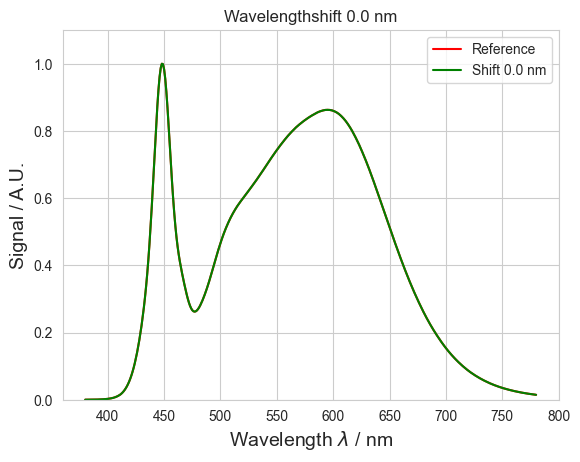

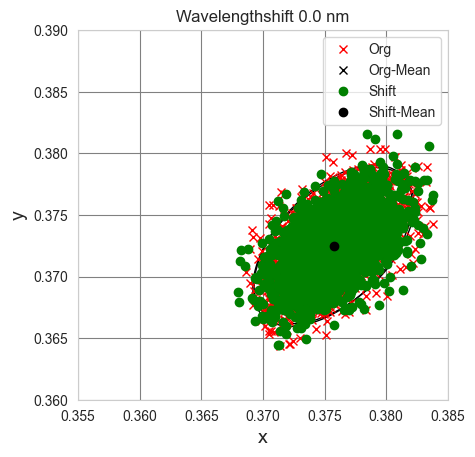

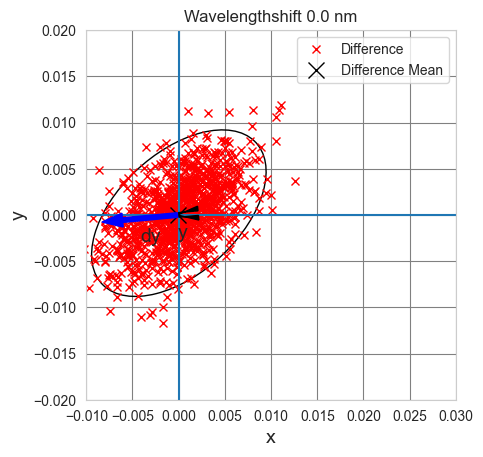

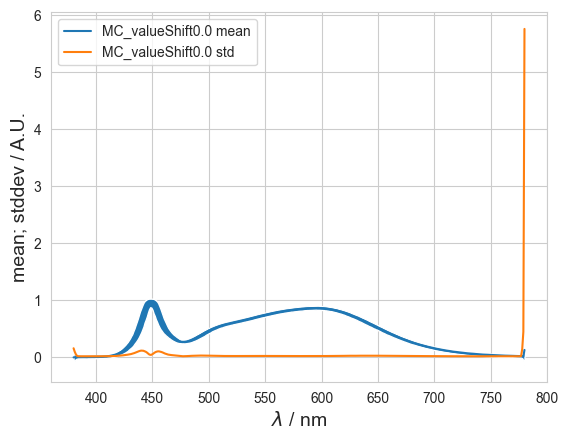

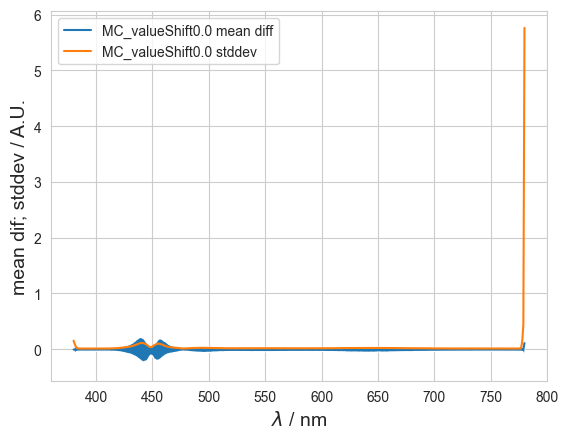

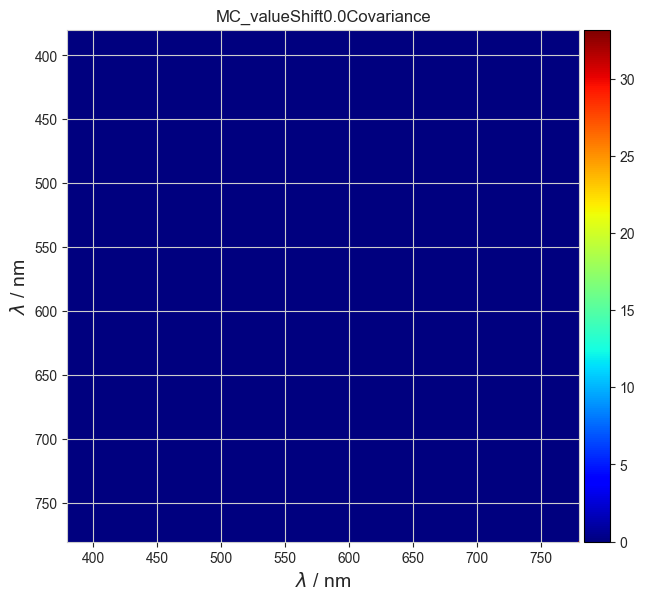

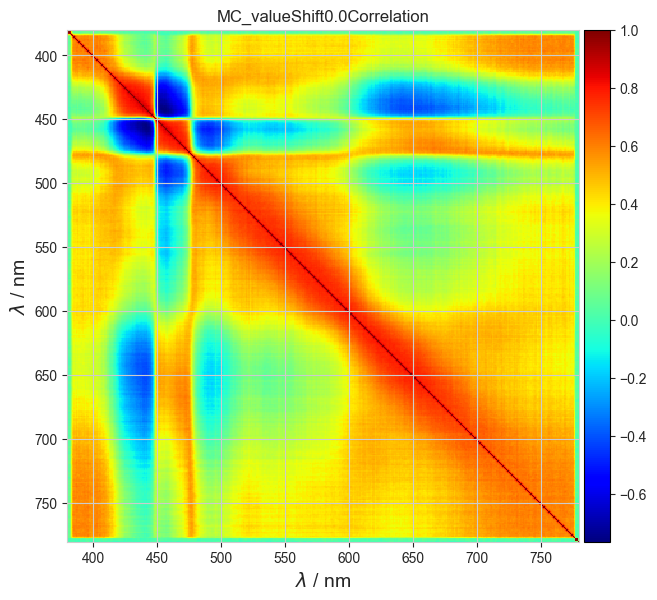

chisquare: 448.690621241841
Difference Vecotr: [1.6779e-03 2.6883e-03 2.1541e-04 -1.4659e-03 -5.6769e-04 -4.5511e-04
 -5.4463e-04 -2.2789e-04 -7.6713e-05 -2.2790e-04 -1.8890e-04 -5.9311e-04
 -3.8803e-04 -1.4495e-04 -4.6894e-04 -6.3877e-05 -1.6216e-04 -5.6952e-04
 -7.1430e-04 -4.9494e-04 -5.4798e-04 -4.7378e-04 -9.1030e-04 -6.1012e-04
 -3.4903e-04 -1.9141e-04 -6.8180e-05 -2.7297e-04 -3.2585e-04 -1.6988e-04
 -6.0429e-05 -4.8234e-04 -4.6407e-04 5.0131e-04 6.0146e-04 4.4869e-04
 1.0441e-03 6.0789e-04 8.9936e-05 7.3897e-04 1.0792e-03 9.4656e-04
 1.3267e-03 1.0781e-03 9.0577e-04 1.2525e-03 2.9737e-03 2.3649e-03
 2.1660e-03 2.6317e-03 3.1469e-03 2.9038e-03 2.4213e-03 3.7040e-03
 6.4387e-03 5.9302e-03 7.5468e-03 5.9142e-03 6.5390e-03 9.5930e-03
 8.9167e-03 8.3200e-03 9.0587e-03 6.7770e-03 4.7169e-03 3.7252e-03
 3.3189e-03 2.2205e-03 -1.3094e-03 -2.8130e-03 -4.1009e-03 -4.5954e-03
 -6.8304e-03 -7.5413e-03 -7.4987e-03 -9.1157e-03 -5.8290e-03 -5.3701e-03
 -5.4324e-03 -3.5609e-03 -3.9009e-03 -3.39

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [6.4338e-04 -1.0737e-05] 0.000643472752590708
Resulting Covariance Matrix: [[1.3952e-05 7.3571e-06]
 [7.3571e-06 1.3868e-05]]
dy: 0.007691546727630114
DoE: 0.0836597339101094
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

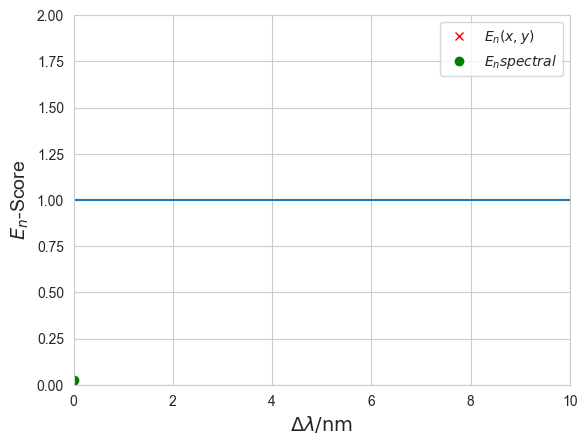

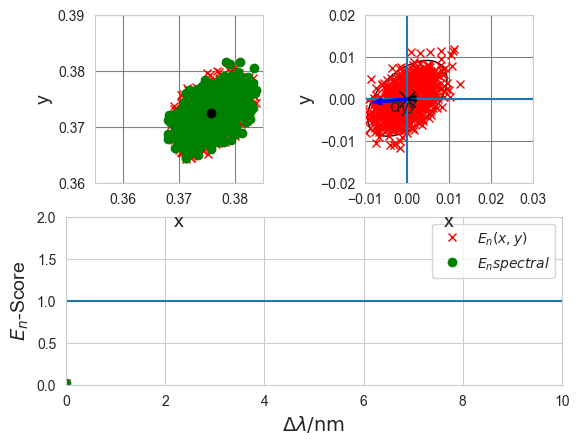

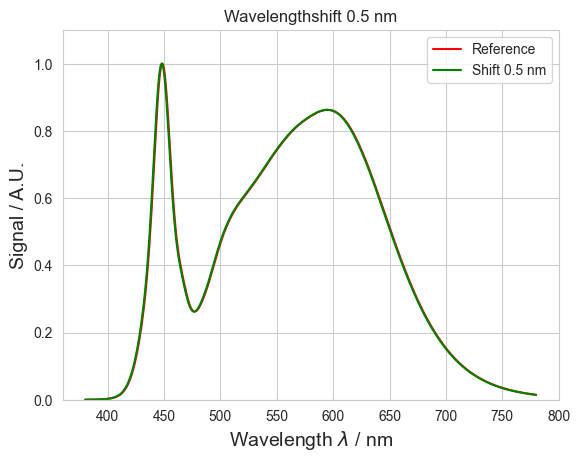

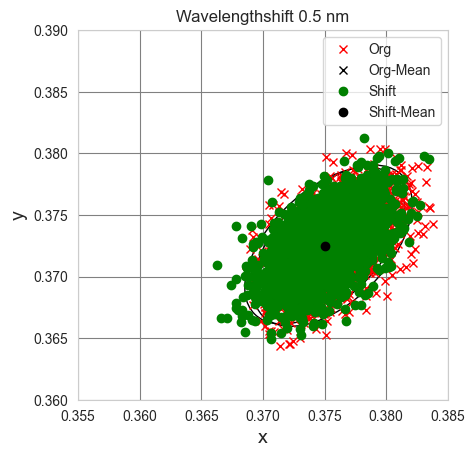

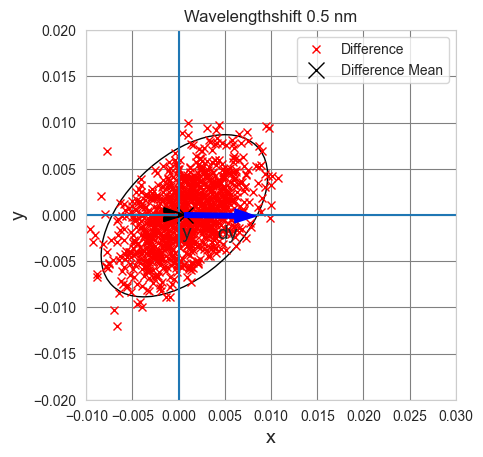

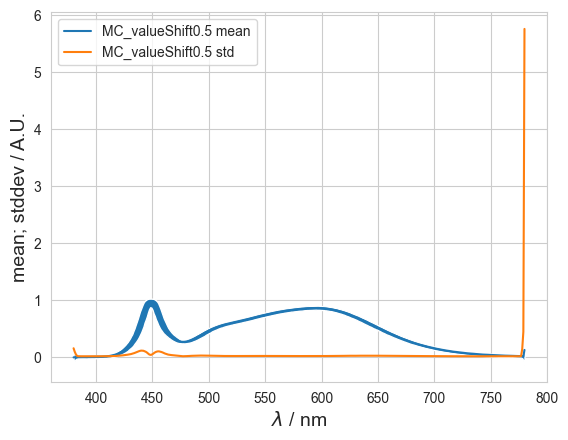

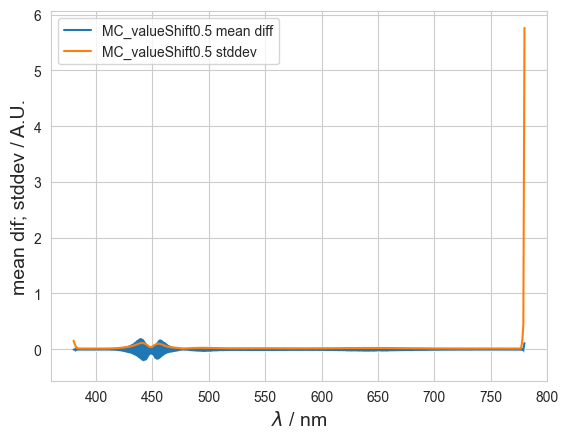

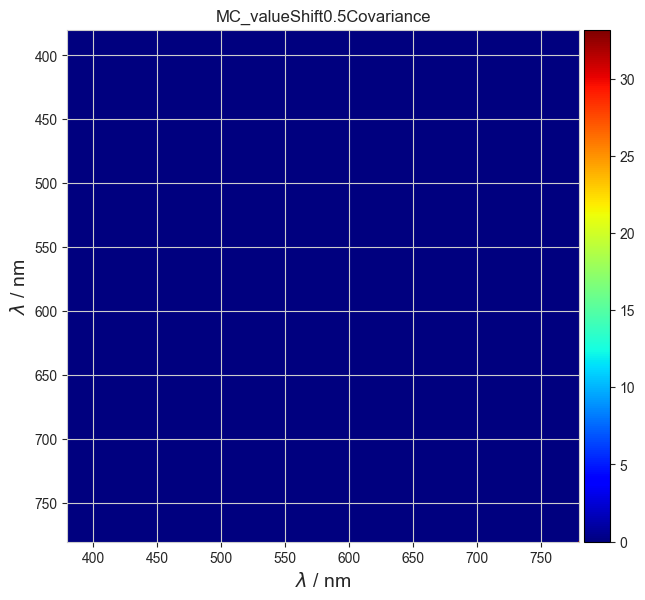

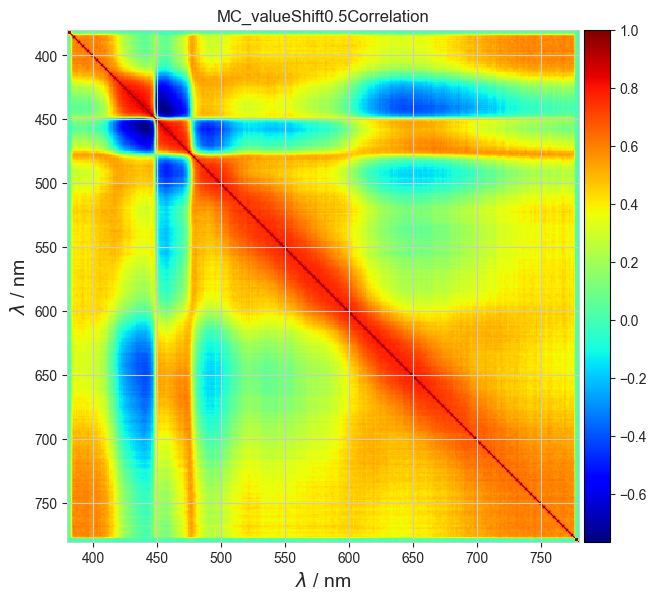

chisquare: 448.690621241841
Difference Vecotr: [-2.6596e-02 -8.5984e-03 -1.3193e-03 -2.2562e-04 -7.4618e-05 5.7250e-05
 -3.6245e-04 -1.5394e-04 -7.2962e-05 -6.1146e-04 -3.6225e-04 -3.2918e-04
 -1.5443e-04 1.1065e-04 2.8896e-05 -2.6792e-04 -5.0563e-04 -5.0594e-04
 -2.8823e-04 -2.0778e-04 -6.7445e-04 -1.0048e-03 -9.4784e-04 -1.0952e-03
 -9.4369e-04 -7.2745e-04 -8.5469e-04 -5.7303e-04 -1.0043e-03 -1.3751e-03
 -1.4543e-03 -1.5723e-03 -2.2226e-03 -2.1068e-03 -2.0621e-03 -2.3264e-03
 -2.3779e-03 -3.0440e-03 -4.2662e-03 -4.4519e-03 -4.8331e-03 -5.9712e-03
 -6.0779e-03 -6.7204e-03 -7.3059e-03 -7.3722e-03 -7.0480e-03 -8.8173e-03
 -9.8409e-03 -1.0713e-02 -1.1633e-02 -1.4297e-02 -1.6069e-02 -1.5899e-02
 -1.6291e-02 -1.8739e-02 -1.9520e-02 -2.3814e-02 -2.6320e-02 -2.6089e-02
 -2.8950e-02 -2.6004e-02 -2.5576e-02 -2.5904e-02 -2.4551e-02 -1.8638e-02
 -1.2946e-02 -7.8523e-03 -2.2764e-03 3.7402e-03 9.4773e-03 1.5537e-02
 1.9433e-02 2.1704e-02 2.4060e-02 2.3621e-02 2.5352e-02 2.4468e-02
 2.3601e-02 2.10

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.3825e-03 5.4518e-05] 0.0013836101107305165
Resulting Covariance Matrix: [[1.3653e-05 7.1250e-06]
 [7.1250e-06 1.3751e-05]]
dy: 0.007888116341747959
DoE: 0.17540437422401367
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

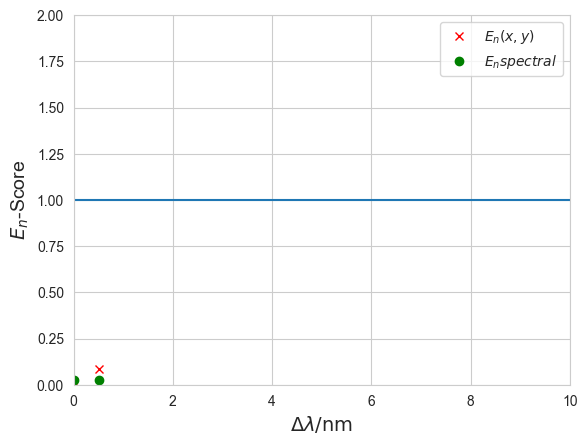

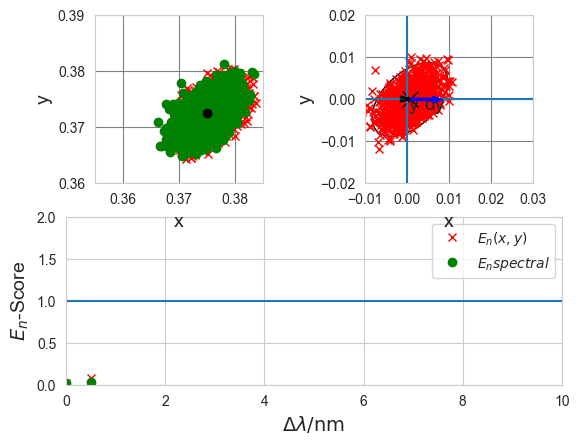

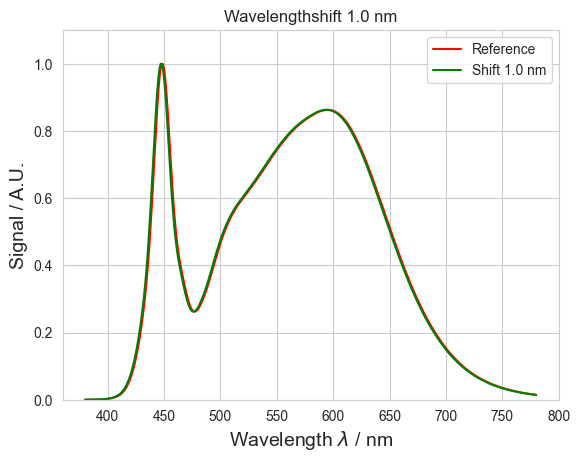

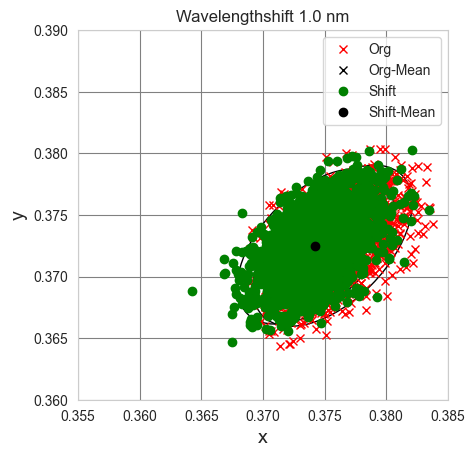

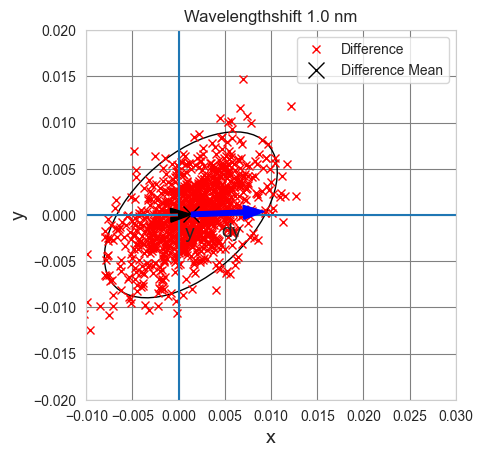

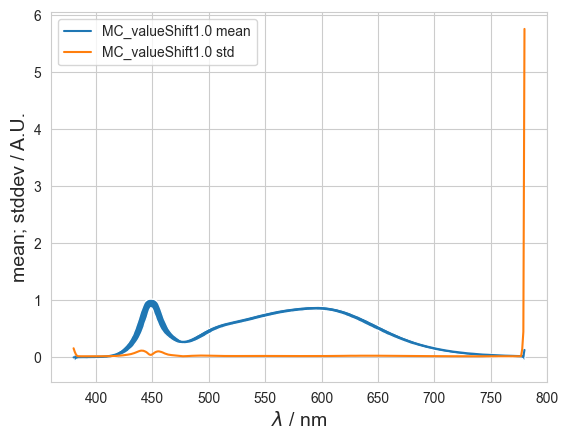

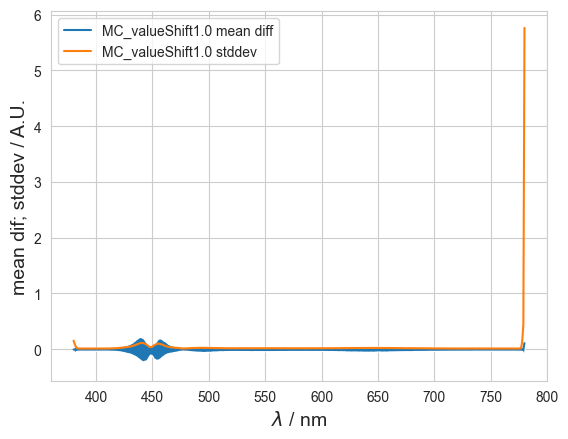

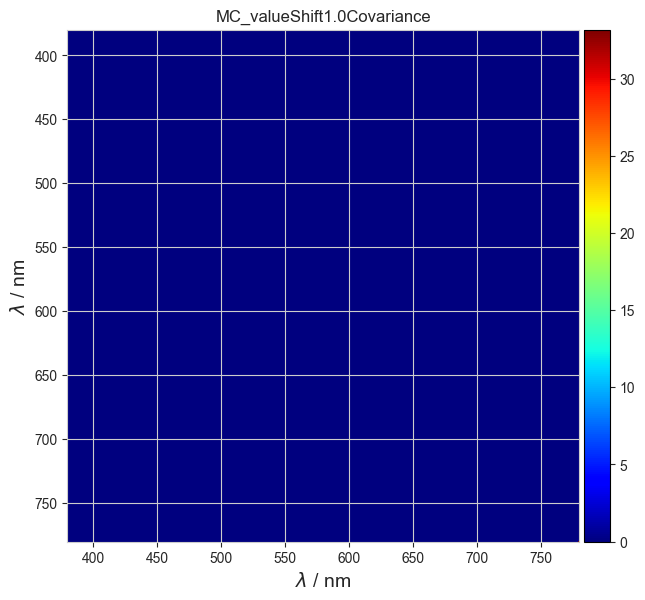

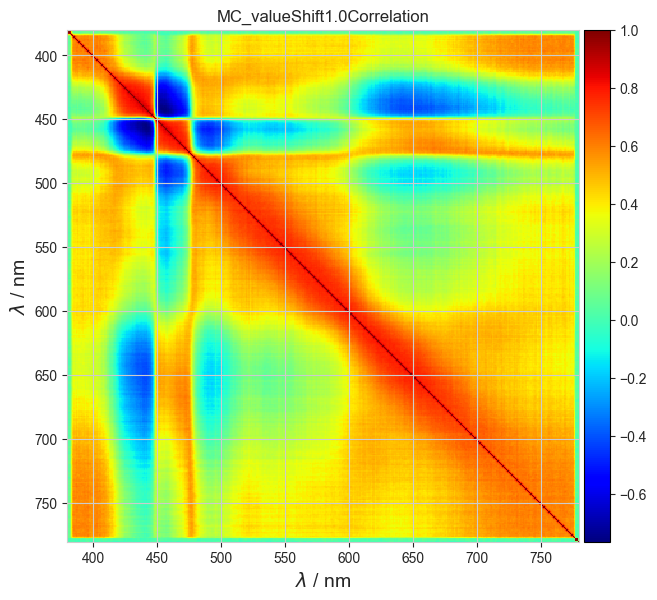

chisquare: 448.690621241841
Difference Vecotr: [-2.6934e-02 -1.0022e-02 -2.6419e-03 -1.1498e-03 -1.6921e-04 6.2906e-05
 -5.7893e-04 -3.1059e-04 1.6609e-04 -1.9511e-04 -5.6591e-05 -6.0007e-04
 -2.7486e-04 -3.7102e-04 -5.1937e-04 -2.5104e-04 -3.7401e-04 -3.8849e-04
 -3.7945e-04 -4.7738e-04 -1.0251e-03 -1.1400e-03 -1.5440e-03 -1.2894e-03
 -1.3776e-03 -1.4894e-03 -1.6214e-03 -1.4021e-03 -1.6038e-03 -1.8521e-03
 -2.4724e-03 -3.2648e-03 -3.9328e-03 -3.6890e-03 -4.7589e-03 -5.1639e-03
 -5.5484e-03 -7.3283e-03 -8.5649e-03 -8.8915e-03 -1.0038e-02 -1.1340e-02
 -1.2801e-02 -1.4067e-02 -1.5915e-02 -1.7123e-02 -1.8062e-02 -2.0683e-02
 -2.2774e-02 -2.4767e-02 -2.6593e-02 -2.8582e-02 -3.2954e-02 -3.5678e-02
 -3.7091e-02 -4.1531e-02 -4.6818e-02 -5.3621e-02 -5.6097e-02 -5.7090e-02
 -6.0031e-02 -5.9787e-02 -5.6574e-02 -5.2386e-02 -4.5649e-02 -3.5635e-02
 -2.4047e-02 -1.1358e-02 -6.1097e-04 1.2573e-02 2.4268e-02 3.3806e-02
 3.9640e-02 4.7569e-02 5.1939e-02 5.1061e-02 5.1697e-02 4.8449e-02
 4.2917e-02 3.9

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.9581e-03 -1.1801e-05] 0.001958135759818188
Resulting Covariance Matrix: [[1.3709e-05 7.1665e-06]
 [7.1665e-06 1.3805e-05]]
dy: 0.007712009178531173
DoE: 0.25390734301370915
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

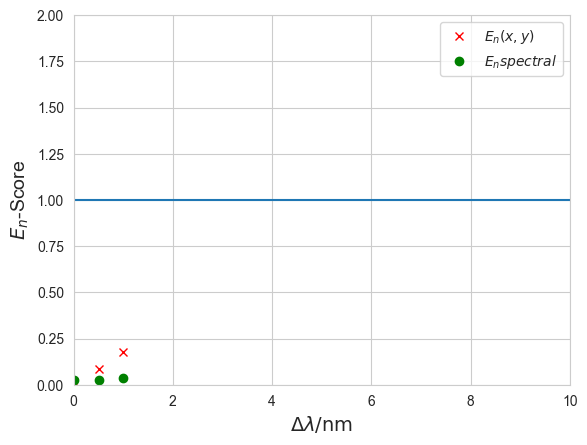

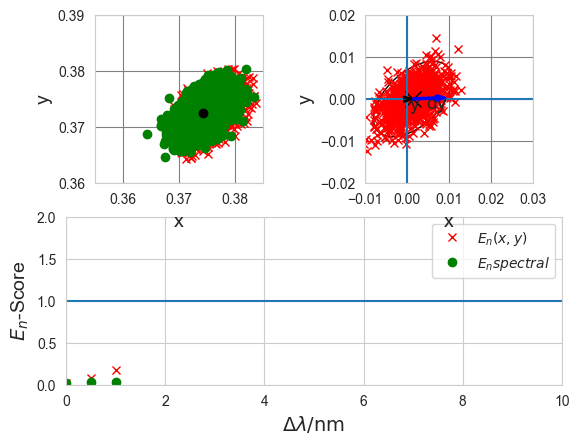

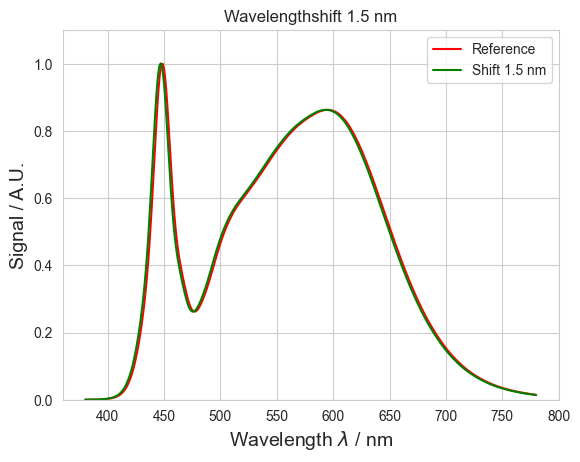

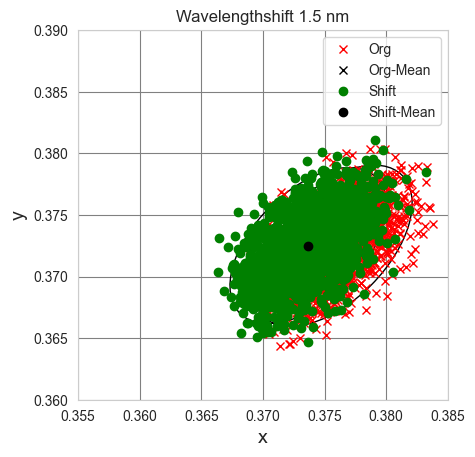

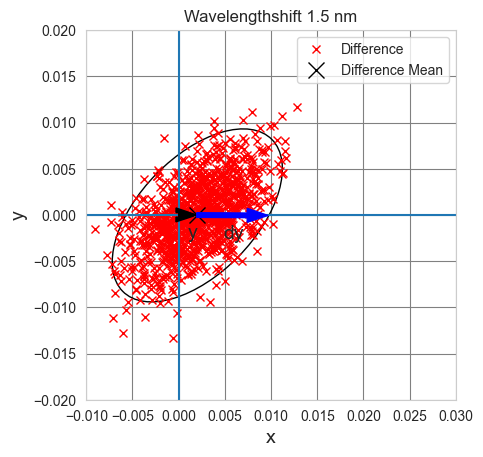

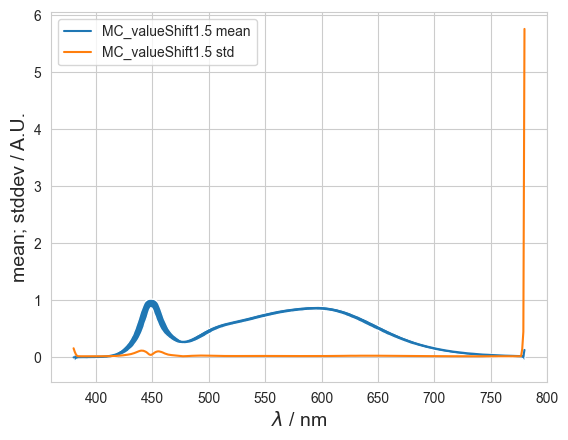

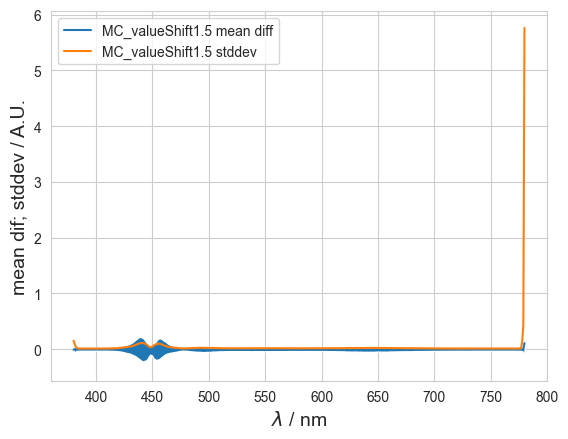

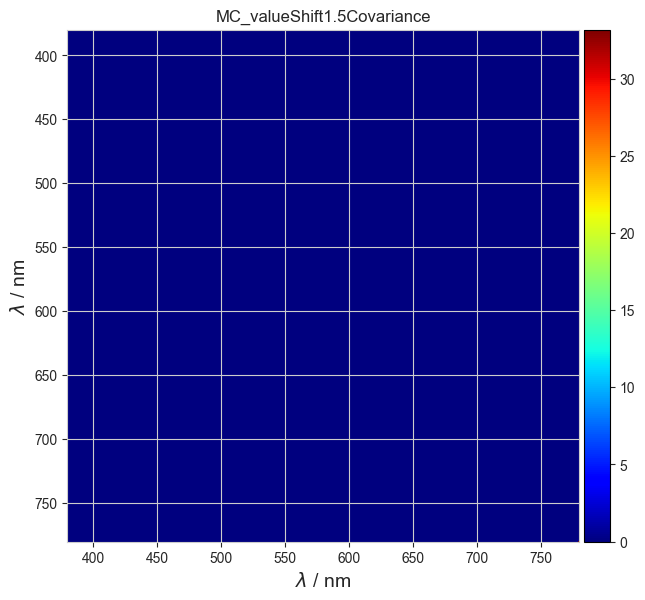

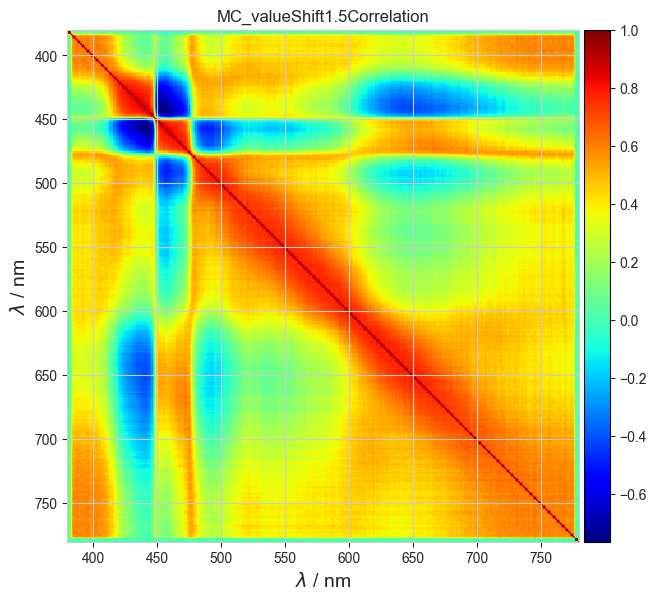

chisquare: 448.690621241841
Difference Vecotr: [5.5963e-02 2.4227e-02 -6.4708e-04 6.3186e-05 3.2149e-04 5.5186e-04
 2.2709e-04 5.4963e-04 7.7998e-04 4.5179e-04 3.6238e-04 2.8831e-04
 2.3932e-04 4.0702e-04 1.7018e-04 -2.8727e-04 -7.7315e-05 -1.3762e-04
 -1.6661e-04 3.7359e-05 -2.8182e-04 -7.3996e-04 -1.3793e-03 -1.3507e-03
 -1.1450e-03 -1.2321e-03 -1.6423e-03 -1.9447e-03 -2.2518e-03 -2.4675e-03
 -3.0676e-03 -4.1078e-03 -5.0574e-03 -5.0979e-03 -6.5220e-03 -7.6144e-03
 -8.2204e-03 -1.0238e-02 -1.1996e-02 -1.2994e-02 -1.4277e-02 -1.6795e-02
 -1.8460e-02 -2.0268e-02 -2.2683e-02 -2.4413e-02 -2.6562e-02 -2.9663e-02
 -3.2897e-02 -3.5476e-02 -3.8913e-02 -4.3037e-02 -4.8750e-02 -5.2868e-02
 -5.7290e-02 -6.2312e-02 -6.9228e-02 -7.7441e-02 -8.1388e-02 -8.3403e-02
 -8.4321e-02 -8.3329e-02 -8.0220e-02 -7.2178e-02 -6.2688e-02 -4.7554e-02
 -2.9998e-02 -1.2162e-02 6.1528e-03 2.3558e-02 3.9844e-02 5.4996e-02
 6.2060e-02 7.0425e-02 7.4996e-02 7.5585e-02 7.4071e-02 6.7644e-02
 6.2755e-02 5.6253e-02 4.8706

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [2.5337e-03 -1.2947e-04] 0.0025369858541243718
Resulting Covariance Matrix: [[1.3262e-05 6.7025e-06]
 [6.7025e-06 1.3752e-05]]
dy: 0.007553765032793444
DoE: 0.33585713125977046
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.2200

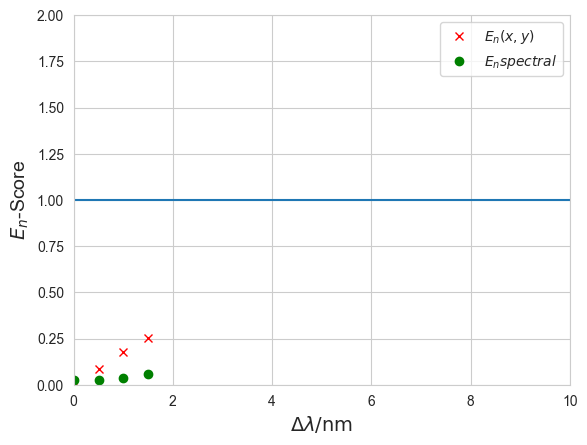

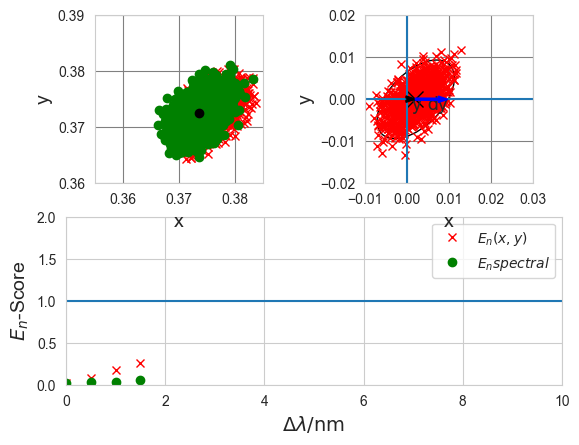

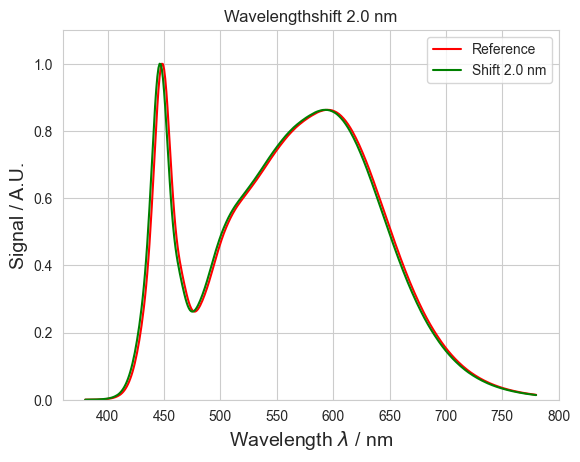

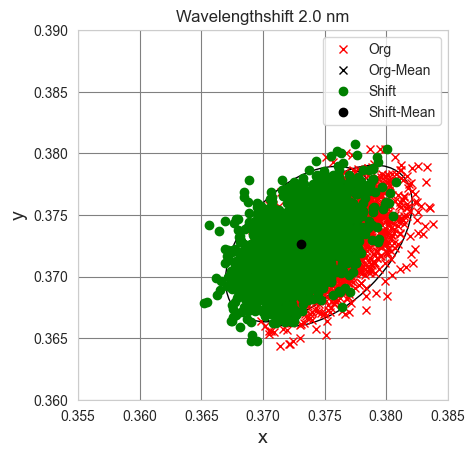

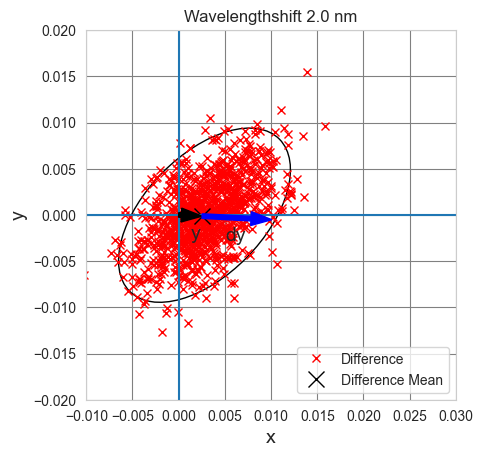

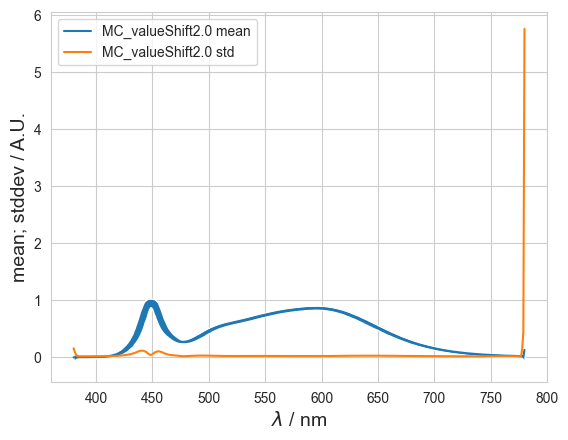

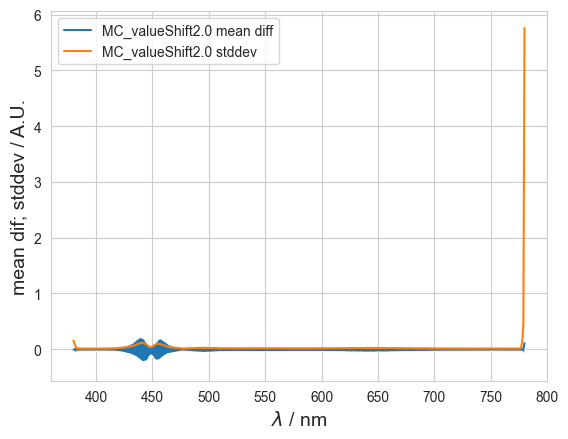

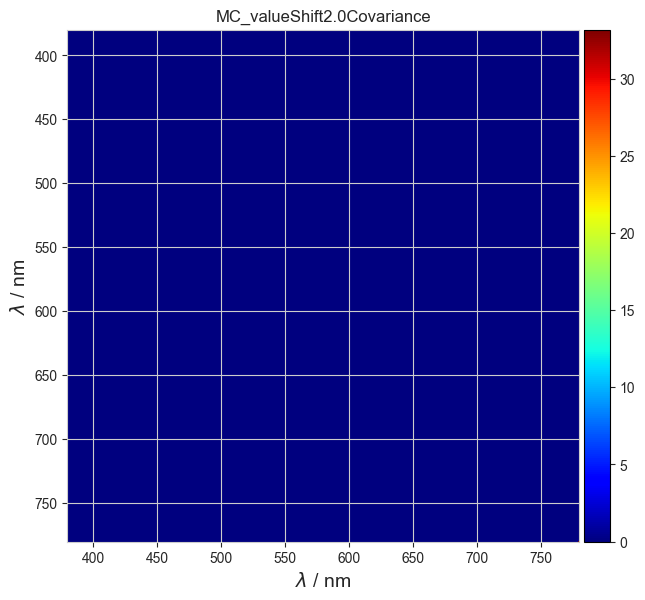

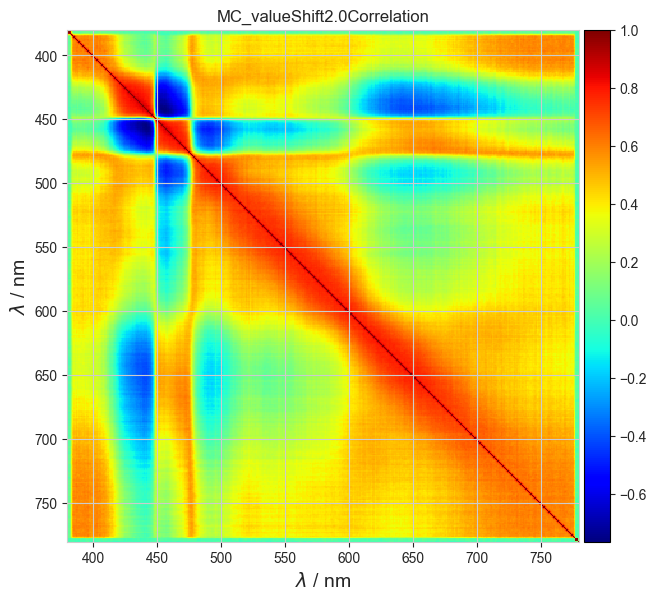

chisquare: 448.690621241841
Difference Vecotr: [-2.5770e-02 -1.9201e-02 -8.4228e-03 -1.7313e-03 -8.8109e-05 8.4739e-05
 -4.7097e-04 -4.2080e-04 -3.6367e-04 -6.5344e-04 -2.7415e-04 -1.0681e-04
 -2.6016e-04 -2.1078e-04 -5.9359e-04 -7.6566e-04 -8.3178e-04 -8.7346e-04
 -5.5002e-04 -1.0421e-03 -1.4422e-03 -1.3123e-03 -1.7767e-03 -2.0032e-03
 -2.2709e-03 -2.1665e-03 -2.5153e-03 -3.1920e-03 -3.4636e-03 -3.9146e-03
 -5.0361e-03 -6.3021e-03 -7.5189e-03 -8.1122e-03 -9.8042e-03 -1.1032e-02
 -1.2261e-02 -1.4085e-02 -1.6367e-02 -1.7753e-02 -2.0525e-02 -2.3414e-02
 -2.6046e-02 -2.8811e-02 -3.1289e-02 -3.3706e-02 -3.7347e-02 -4.0957e-02
 -4.4798e-02 -4.8986e-02 -5.3928e-02 -5.8880e-02 -6.5126e-02 -7.1583e-02
 -7.7937e-02 -8.7877e-02 -9.6026e-02 -1.0389e-01 -1.1014e-01 -1.1276e-01
 -1.1414e-01 -1.1114e-01 -1.0460e-01 -9.3796e-02 -7.7967e-02 -5.7352e-02
 -3.3745e-02 -9.0587e-03 1.4437e-02 3.7652e-02 5.9750e-02 7.7670e-02
 8.8139e-02 9.7188e-02 1.0123e-01 1.0177e-01 9.9149e-02 9.1443e-02
 8.3436e-02 7.3

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [3.3011e-03 -7.1255e-05] 0.003301827247919179
Resulting Covariance Matrix: [[1.3184e-05 6.3547e-06]
 [6.3547e-06 1.3404e-05]]
dy: 0.007728009160681775
DoE: 0.42725457220186414
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

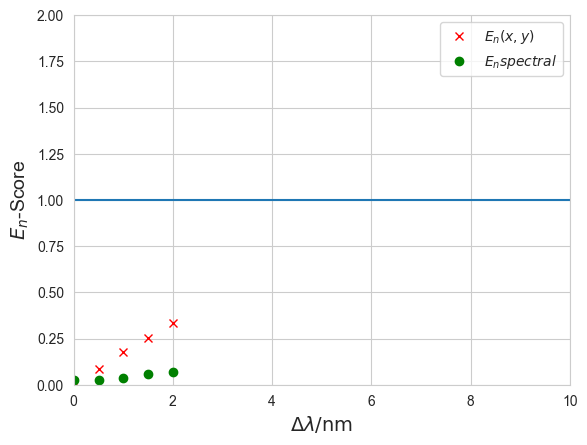

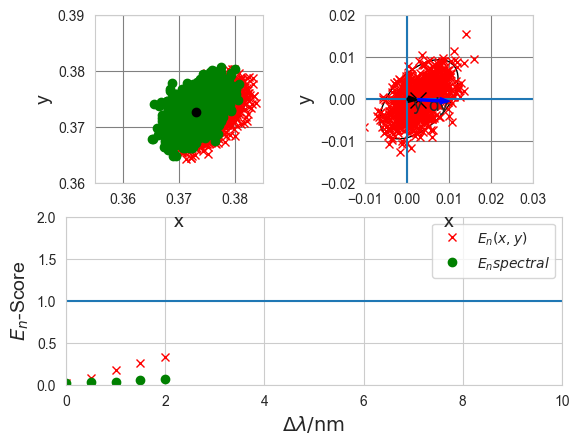

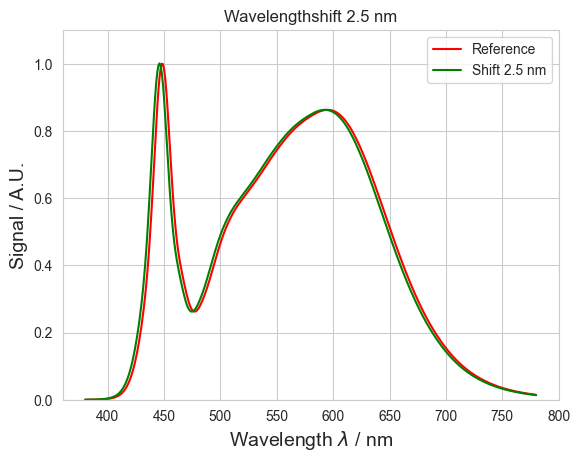

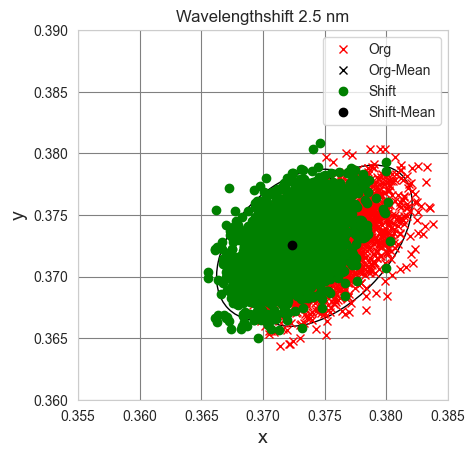

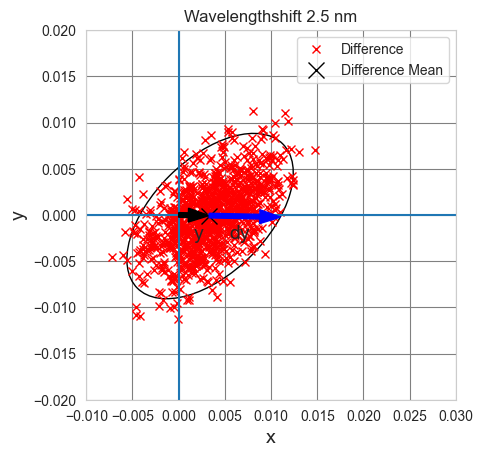

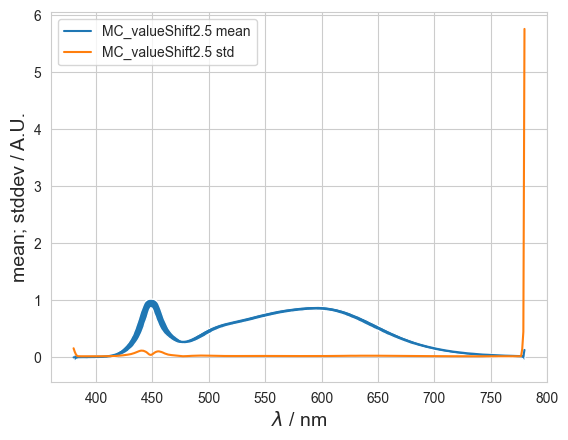

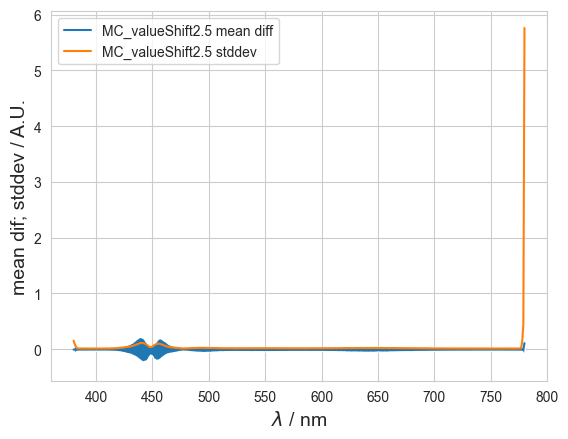

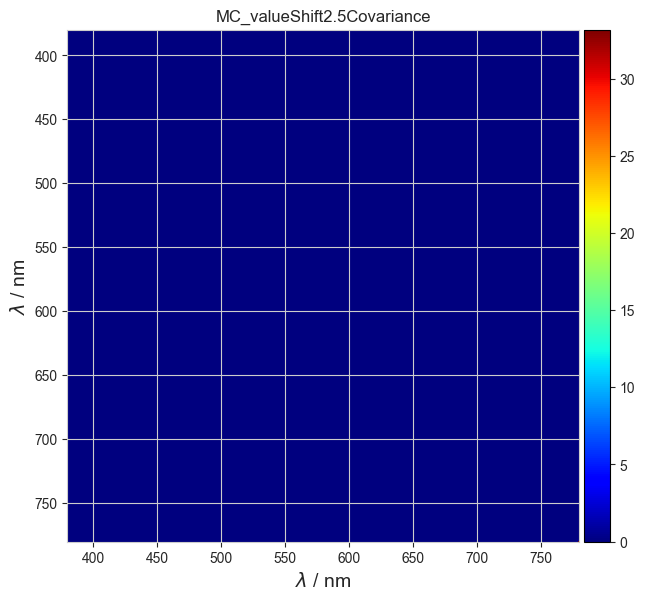

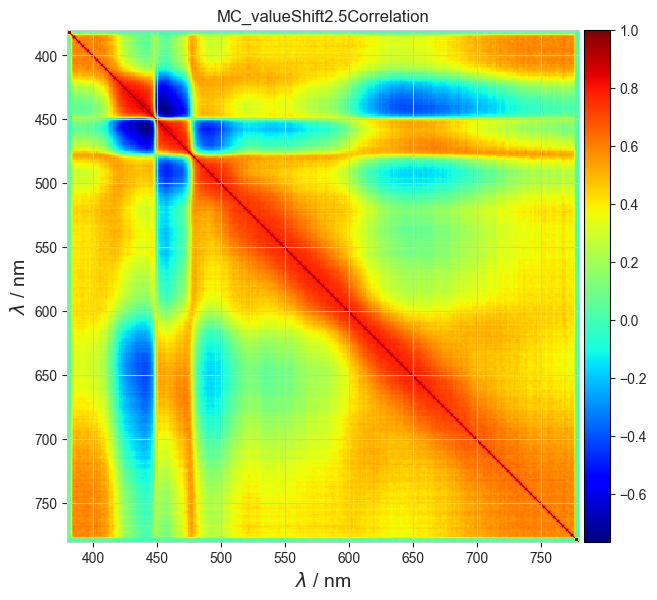

chisquare: 448.690621241841
Difference Vecotr: [-2.4533e-02 -1.3827e-02 -5.4034e-03 -1.0071e-03 -3.1134e-04 1.2366e-04
 -5.3945e-04 -4.6241e-04 -3.6914e-04 -4.0828e-04 -3.6052e-04 -6.9113e-04
 -5.9734e-04 -6.7287e-04 -6.1390e-04 -1.1060e-03 -1.0258e-03 -8.8741e-04
 -7.1872e-04 -1.2596e-03 -2.1110e-03 -2.1093e-03 -2.4904e-03 -2.9096e-03
 -2.7592e-03 -2.9944e-03 -3.6934e-03 -4.1878e-03 -5.3255e-03 -5.9960e-03
 -7.2236e-03 -8.5478e-03 -1.0404e-02 -1.1071e-02 -1.2796e-02 -1.4964e-02
 -1.6856e-02 -1.9139e-02 -2.1743e-02 -2.4236e-02 -2.6400e-02 -3.0427e-02
 -3.4060e-02 -3.7117e-02 -4.1052e-02 -4.4723e-02 -4.8186e-02 -5.3110e-02
 -5.7697e-02 -6.2858e-02 -6.9017e-02 -7.6684e-02 -8.6502e-02 -9.3754e-02
 -1.0114e-01 -1.1312e-01 -1.2342e-01 -1.3569e-01 -1.4121e-01 -1.4404e-01
 -1.4388e-01 -1.3855e-01 -1.2687e-01 -1.1251e-01 -9.1935e-02 -6.4354e-02
 -3.5182e-02 -4.7265e-03 2.4219e-02 5.3539e-02 7.7758e-02 9.9524e-02
 1.1160e-01 1.2224e-01 1.2533e-01 1.2450e-01 1.1885e-01 1.0931e-01
 9.9005e-02 8.7

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [3.7909e-03 -2.6773e-04] 0.00380033367827023
Resulting Covariance Matrix: [[1.3231e-05 6.3742e-06]
 [6.3742e-06 1.3460e-05]]
dy: 0.007574513840827446
DoE: 0.5017264154678841
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e

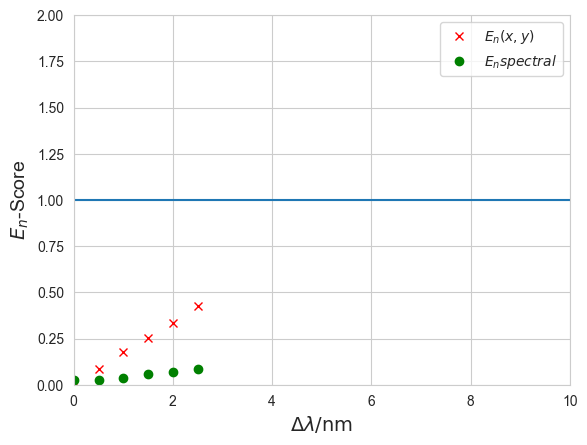

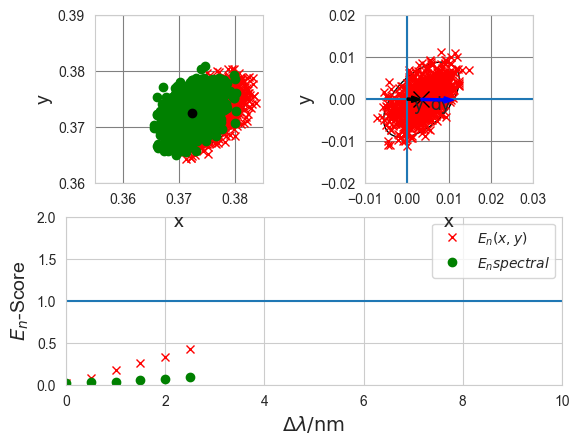

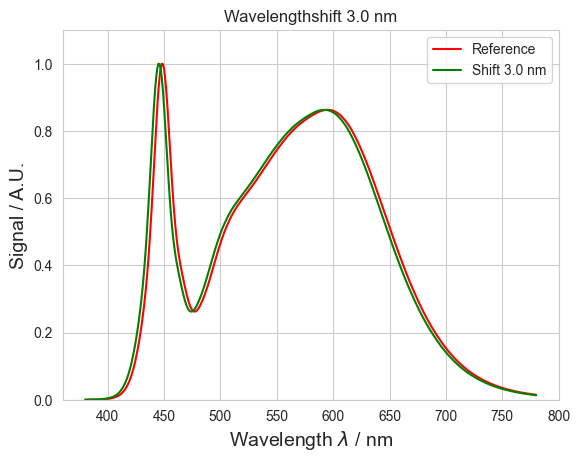

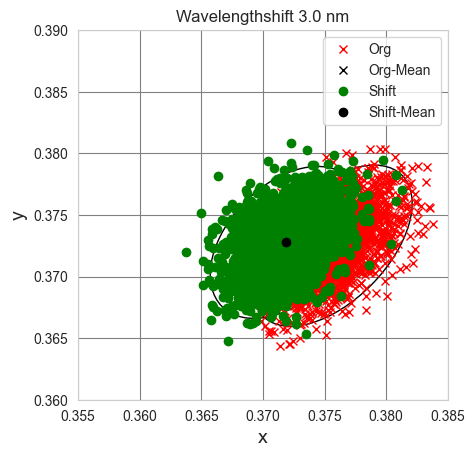

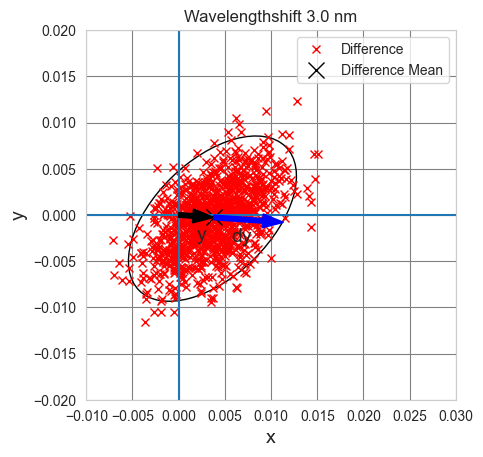

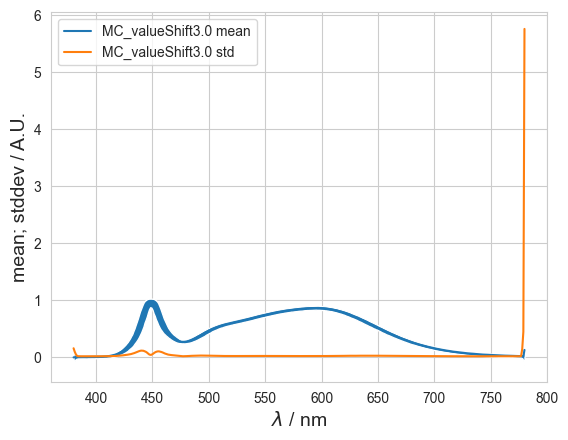

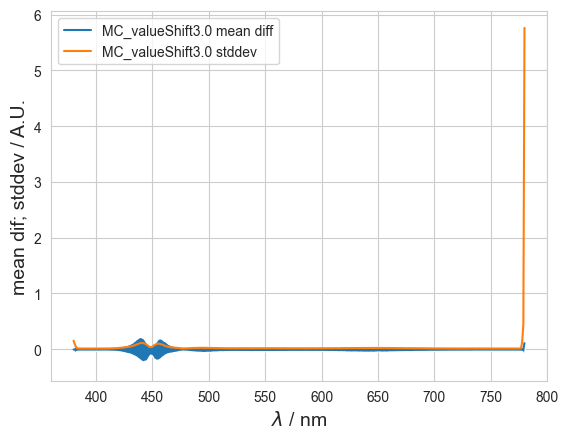

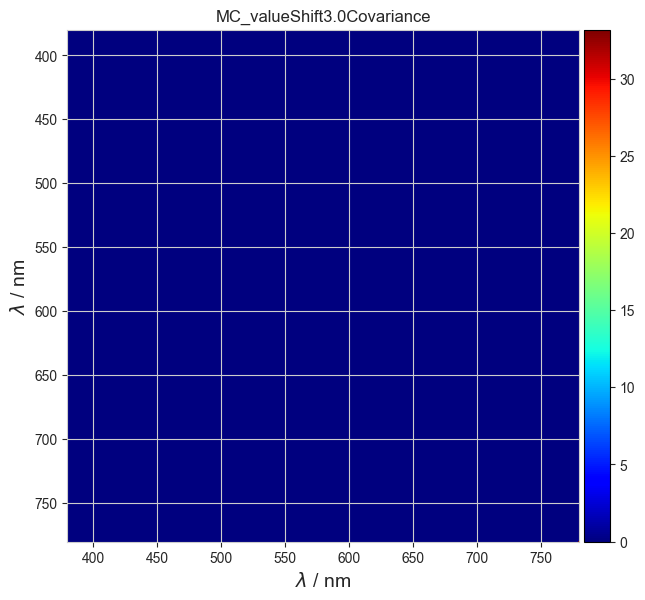

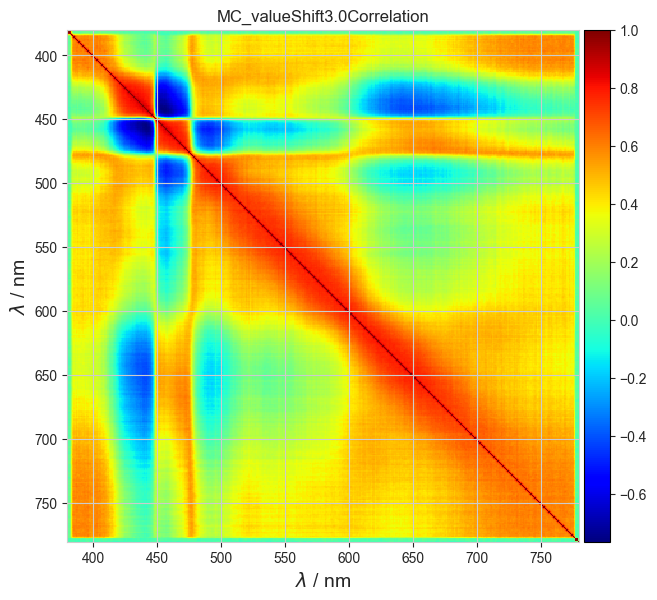

chisquare: 448.690621241841
Difference Vecotr: [4.5801e-03 1.2542e-03 -1.1389e-03 -1.8387e-03 -1.7376e-04 -7.3625e-07
 -3.3536e-04 -3.1979e-04 -1.8771e-04 -5.1406e-04 -3.5318e-04 -7.6019e-04
 -2.6840e-04 -2.4341e-04 -7.3004e-04 -7.5974e-04 -1.0516e-03 -8.0166e-04
 -6.8027e-04 -1.2390e-03 -1.8951e-03 -1.8799e-03 -2.6700e-03 -3.1781e-03
 -3.4825e-03 -3.8682e-03 -4.8882e-03 -5.4331e-03 -5.7692e-03 -6.6023e-03
 -8.4887e-03 -1.0387e-02 -1.1877e-02 -1.3456e-02 -1.5922e-02 -1.7491e-02
 -2.0027e-02 -2.2926e-02 -2.6284e-02 -2.8613e-02 -3.2604e-02 -3.6276e-02
 -4.0267e-02 -4.4306e-02 -4.8652e-02 -5.3137e-02 -5.8551e-02 -6.3872e-02
 -7.0426e-02 -7.7234e-02 -8.4894e-02 -9.3948e-02 -1.0461e-01 -1.1433e-01
 -1.2508e-01 -1.3844e-01 -1.4953e-01 -1.6104e-01 -1.6847e-01 -1.7075e-01
 -1.6887e-01 -1.6102e-01 -1.4776e-01 -1.2720e-01 -1.0186e-01 -6.8504e-02
 -3.2630e-02 3.5281e-03 3.9047e-02 7.1483e-02 1.0068e-01 1.2406e-01
 1.3948e-01 1.4912e-01 1.5296e-01 1.4745e-01 1.3922e-01 1.2788e-01
 1.1536e-01 1.020

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [4.3819e-03 -3.8158e-04] 0.004398434799871064
Resulting Covariance Matrix: [[1.3114e-05 6.1590e-06]
 [6.1590e-06 1.3438e-05]]
dy: 0.007559433056283814
DoE: 0.5818471791631047
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

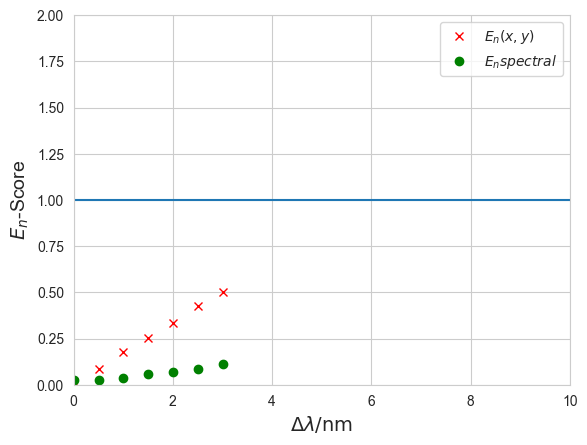

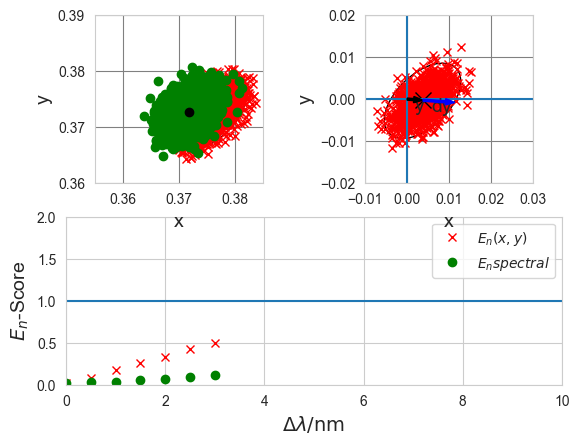

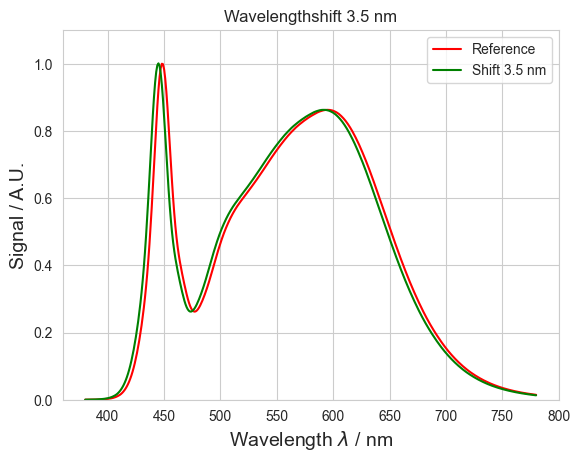

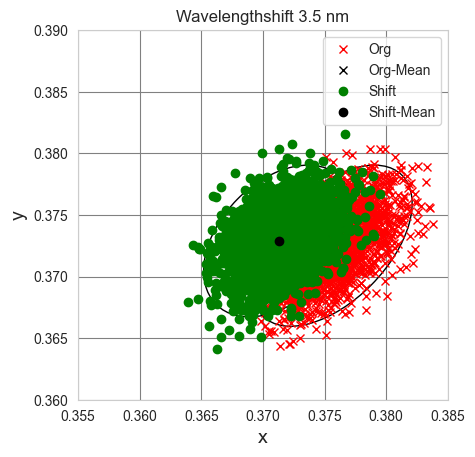

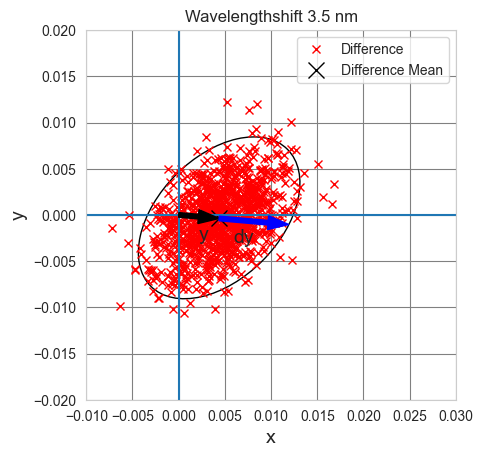

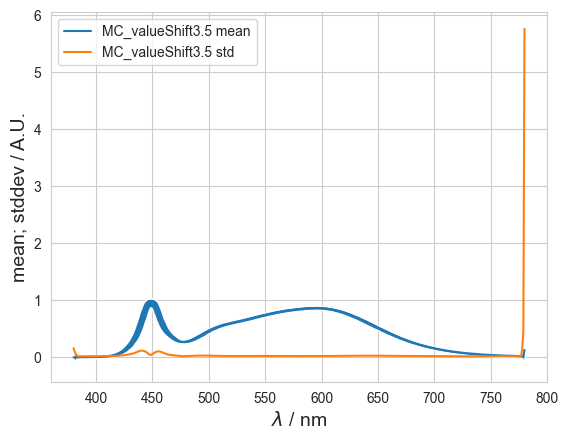

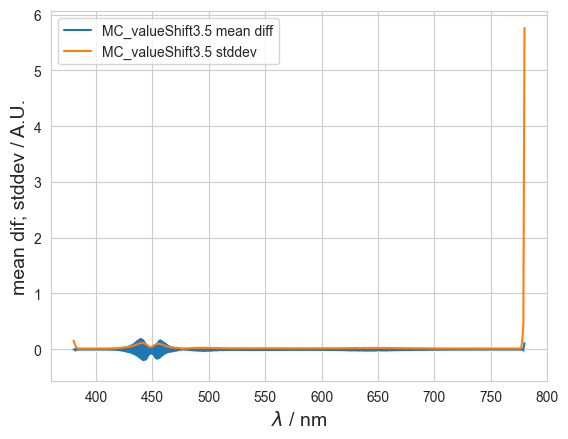

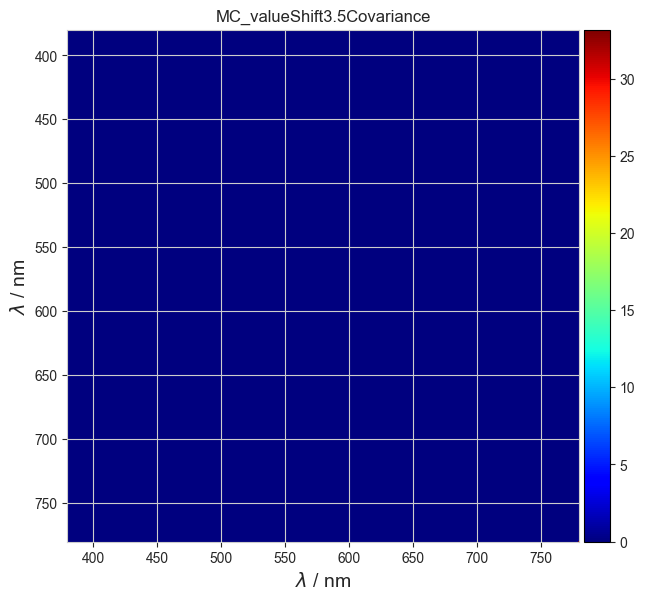

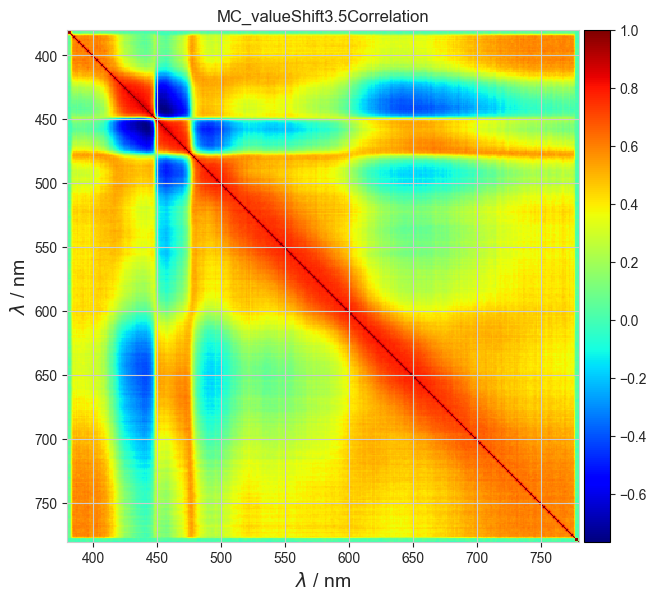

chisquare: 448.690621241841
Difference Vecotr: [2.7076e-03 1.8068e-03 -7.0319e-04 -9.4341e-04 -3.6551e-04 3.4175e-04
 1.7690e-04 5.1914e-04 6.7690e-04 3.2785e-04 1.9721e-04 -3.9802e-04
 -1.8741e-04 -1.5080e-04 -4.4748e-04 -7.2654e-04 -7.2276e-04 -8.1019e-04
 -1.0286e-03 -1.1342e-03 -1.7971e-03 -2.4545e-03 -2.8327e-03 -3.4915e-03
 -3.7069e-03 -4.1010e-03 -5.2499e-03 -6.0832e-03 -7.3051e-03 -8.0891e-03
 -9.6349e-03 -1.1623e-02 -1.3835e-02 -1.5416e-02 -1.8278e-02 -2.0994e-02
 -2.3595e-02 -2.7341e-02 -3.1673e-02 -3.5340e-02 -3.9360e-02 -4.4158e-02
 -4.8737e-02 -5.3353e-02 -5.8278e-02 -6.3987e-02 -6.8947e-02 -7.5669e-02
 -8.3288e-02 -9.0838e-02 -1.0004e-01 -1.1206e-01 -1.2430e-01 -1.3745e-01
 -1.4956e-01 -1.6493e-01 -1.7893e-01 -1.9069e-01 -1.9760e-01 -1.9817e-01
 -1.9504e-01 -1.8438e-01 -1.6426e-01 -1.3905e-01 -1.0811e-01 -6.8365e-02
 -2.5583e-02 1.6796e-02 5.5963e-02 9.2263e-02 1.2455e-01 1.5035e-01
 1.6411e-01 1.7465e-01 1.7663e-01 1.7094e-01 1.6121e-01 1.4595e-01
 1.3040e-01 1.1507e-01 

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [4.9988e-03 -4.1429e-04] 0.005015973271017133
Resulting Covariance Matrix: [[1.2885e-05 5.9581e-06]
 [5.9581e-06 1.3289e-05]]
dy: 0.007549945488124026
DoE: 0.6643721175082918
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

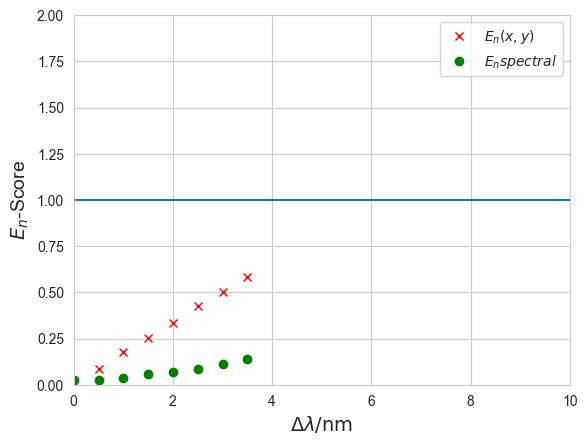

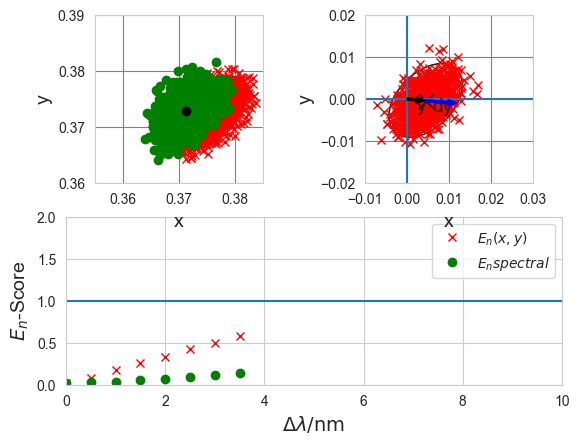

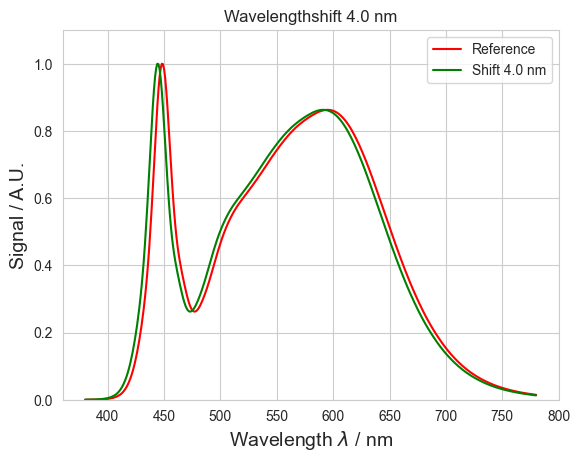

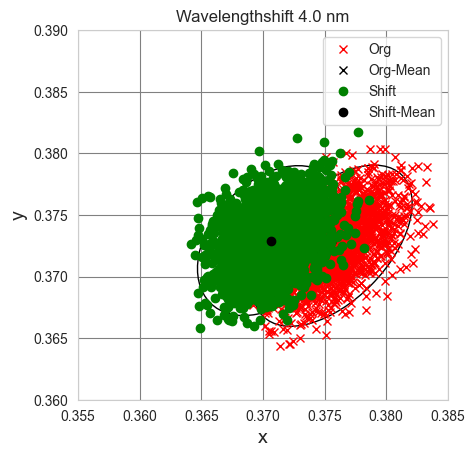

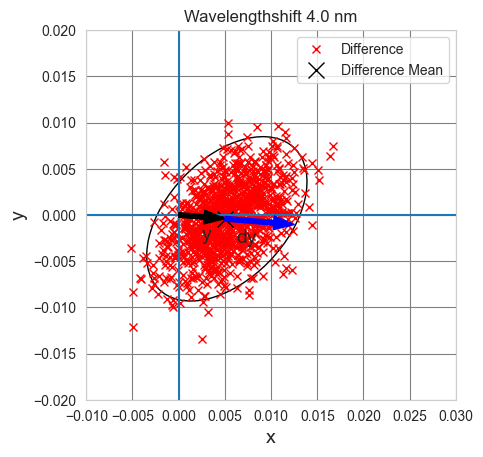

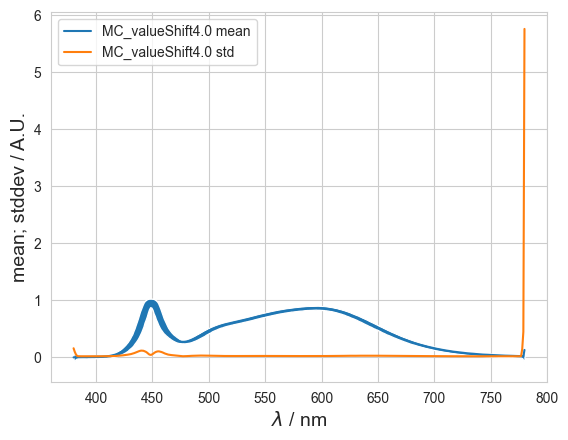

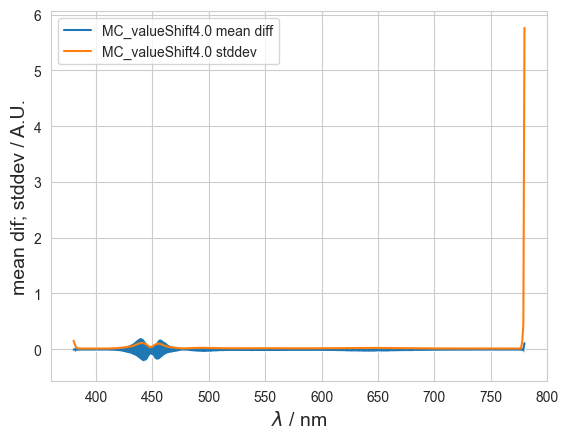

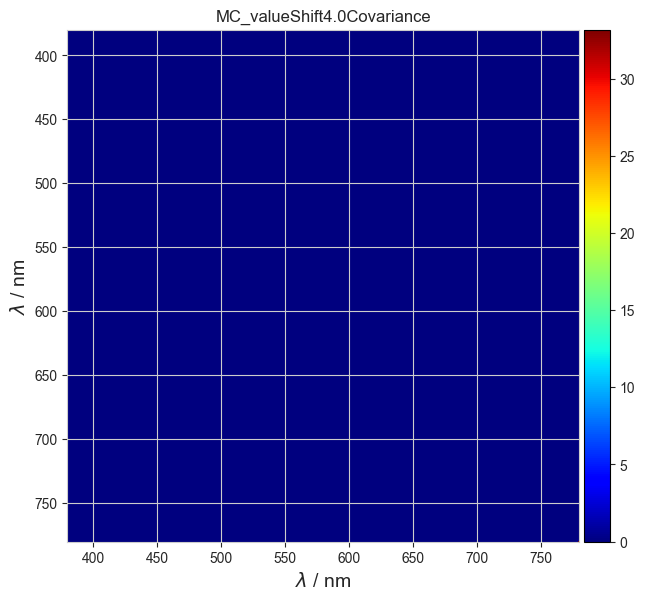

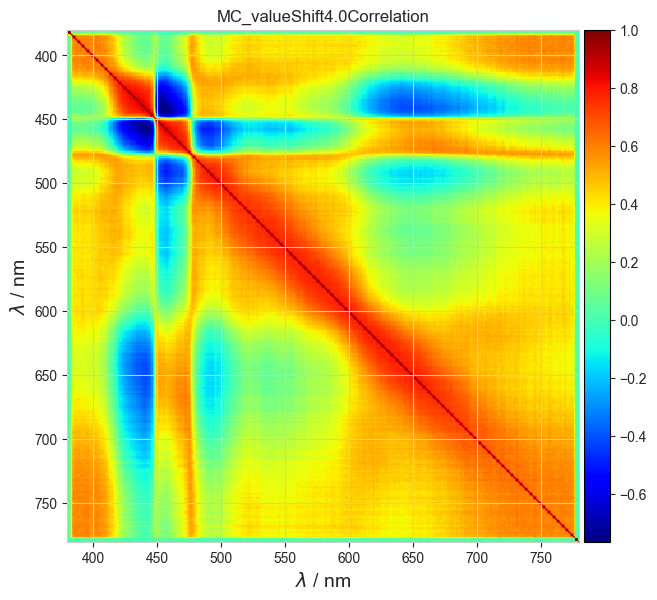

chisquare: 448.690621241841
Difference Vecotr: [-2.4015e-02 -1.4764e-02 -7.2012e-03 -2.1463e-03 -5.9915e-05 8.3177e-05
 -4.1650e-04 1.1131e-04 -2.1043e-04 -4.1484e-04 -1.3139e-04 -6.5794e-04
 -9.0720e-04 -7.9203e-04 -1.0104e-03 -1.4722e-03 -1.3354e-03 -1.5643e-03
 -1.6026e-03 -1.9300e-03 -2.3683e-03 -3.3088e-03 -3.8677e-03 -4.6265e-03
 -5.0106e-03 -5.3072e-03 -6.4946e-03 -7.7490e-03 -8.8420e-03 -1.0466e-02
 -1.2265e-02 -1.4640e-02 -1.7449e-02 -1.9720e-02 -2.2206e-02 -2.5140e-02
 -2.8564e-02 -3.2781e-02 -3.7324e-02 -4.1282e-02 -4.6165e-02 -5.1687e-02
 -5.7254e-02 -6.3296e-02 -6.9542e-02 -7.5660e-02 -8.0886e-02 -8.9323e-02
 -9.7146e-02 -1.0677e-01 -1.1786e-01 -1.3217e-01 -1.4729e-01 -1.6065e-01
 -1.7474e-01 -1.9198e-01 -2.0996e-01 -2.2203e-01 -2.2912e-01 -2.2751e-01
 -2.2191e-01 -2.0617e-01 -1.8259e-01 -1.5077e-01 -1.1349e-01 -6.7937e-02
 -2.0060e-02 2.7783e-02 7.4955e-02 1.1420e-01 1.4956e-01 1.7481e-01
 1.9035e-01 1.9880e-01 1.9836e-01 1.9099e-01 1.7953e-01 1.6282e-01
 1.4497e-01 1.272

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [5.5483e-03 -5.8156e-04] 0.005578695590119373
Resulting Covariance Matrix: [[1.2994e-05 5.9162e-06]
 [5.9162e-06 1.3278e-05]]
dy: 0.007538120513385705
DoE: 0.7400645267229528
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

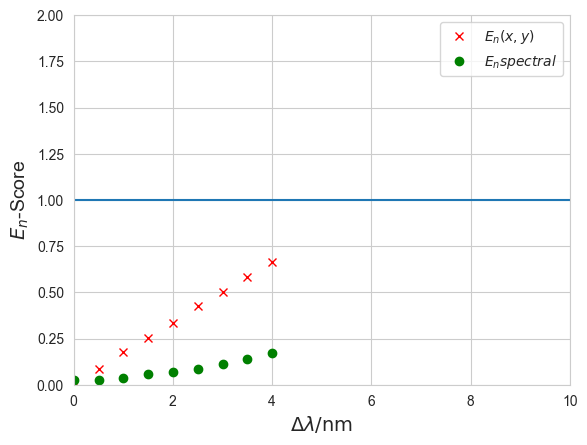

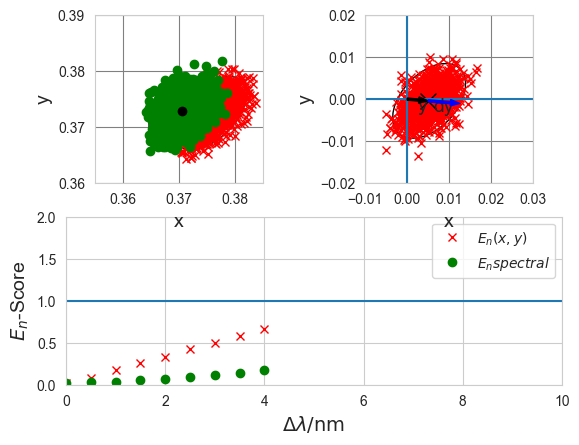

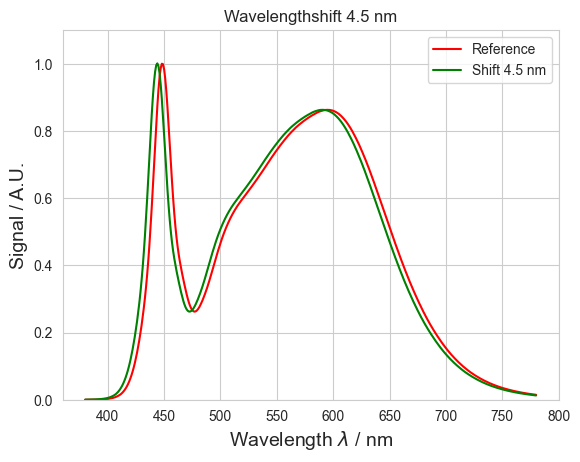

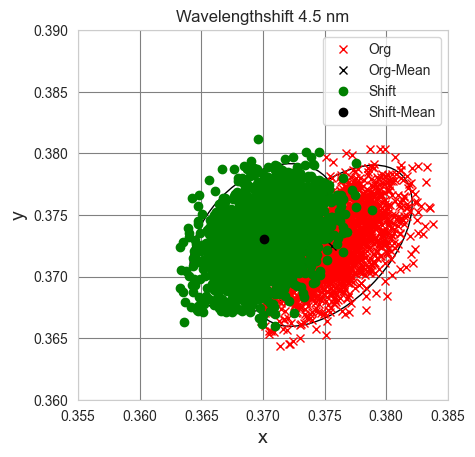

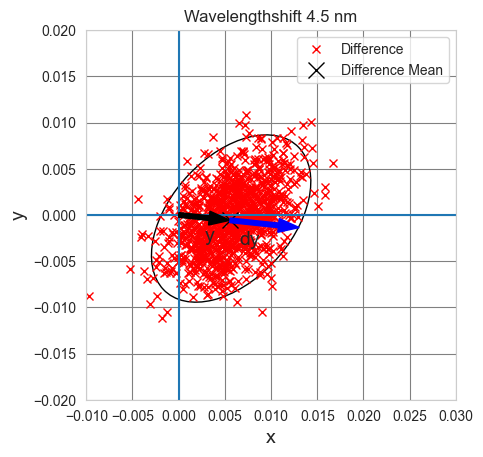

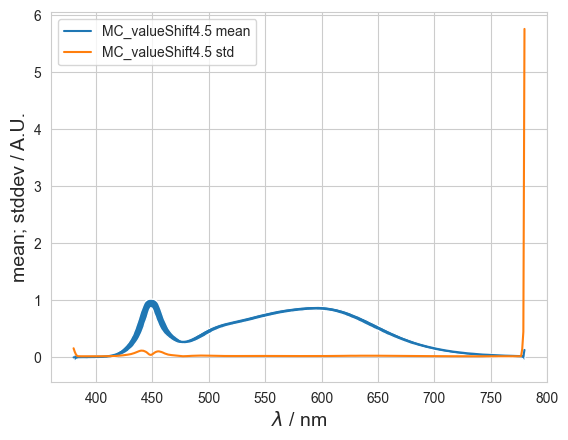

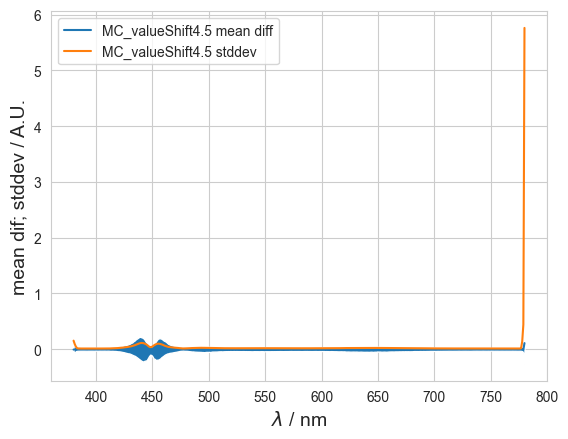

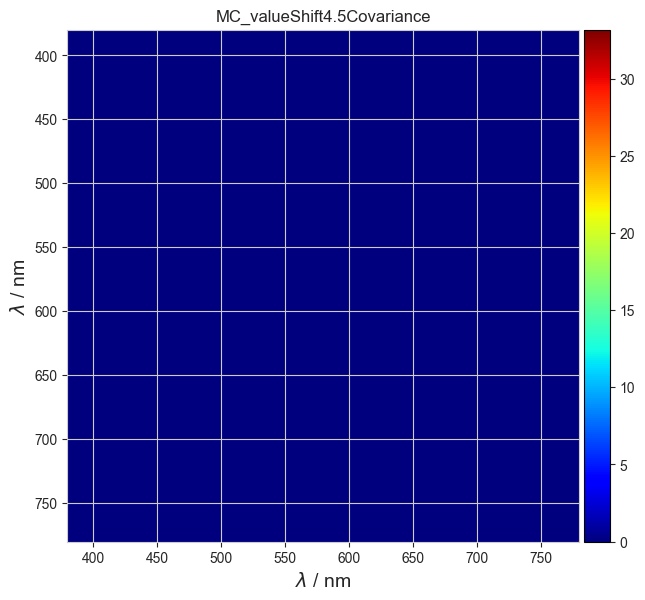

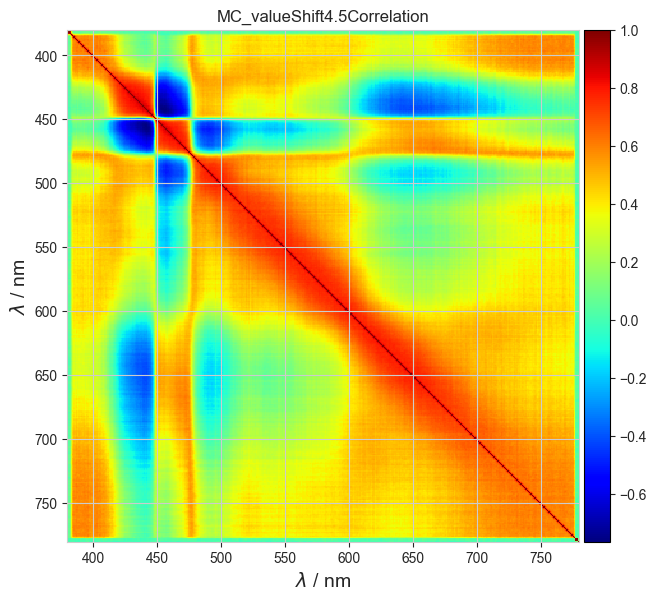

chisquare: 448.690621241841
Difference Vecotr: [6.8008e-04 -1.2561e-03 -1.6043e-03 -1.5993e-03 -6.0081e-04 -4.8955e-04
 -8.8230e-04 -5.7709e-04 -4.1125e-04 -8.8832e-04 -7.5752e-04 -8.9373e-04
 -9.7338e-04 -1.1583e-03 -1.4447e-03 -1.6482e-03 -1.5532e-03 -1.4820e-03
 -2.1852e-03 -2.4700e-03 -3.2666e-03 -3.7522e-03 -4.1841e-03 -5.2490e-03
 -5.7916e-03 -6.5456e-03 -7.8684e-03 -9.0262e-03 -1.0626e-02 -1.2435e-02
 -1.4684e-02 -1.7444e-02 -2.0277e-02 -2.2521e-02 -2.6285e-02 -2.9921e-02
 -3.3316e-02 -3.8027e-02 -4.3008e-02 -4.8009e-02 -5.3246e-02 -5.9607e-02
 -6.4892e-02 -7.1725e-02 -7.8585e-02 -8.5094e-02 -9.2848e-02 -1.0152e-01
 -1.1139e-01 -1.2223e-01 -1.3510e-01 -1.4990e-01 -1.6650e-01 -1.8262e-01
 -1.9724e-01 -2.1767e-01 -2.3479e-01 -2.4778e-01 -2.5302e-01 -2.5240e-01
 -2.4135e-01 -2.2226e-01 -1.9350e-01 -1.5788e-01 -1.1468e-01 -6.3745e-02
 -1.0387e-02 4.0404e-02 9.0290e-02 1.3437e-01 1.6999e-01 1.9659e-01
 2.1239e-01 2.2015e-01 2.1742e-01 2.0753e-01 1.9311e-01 1.7397e-01
 1.5526e-01 1.37

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [6.2756e-03 -8.2046e-04] 0.0063290297990757655
Resulting Covariance Matrix: [[1.2702e-05 5.6654e-06]
 [5.6654e-06 1.3311e-05]]
dy: 0.007457349323426908
DoE: 0.8486969732252477
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

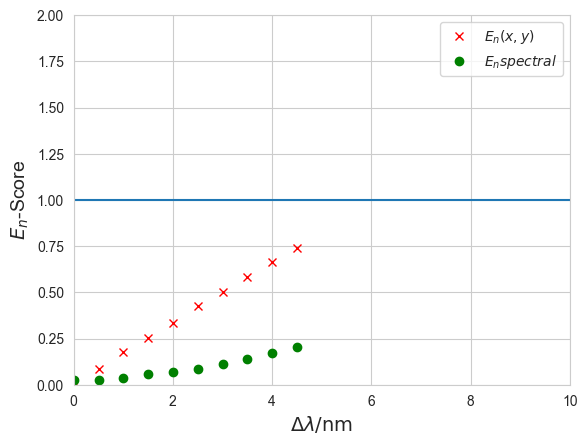

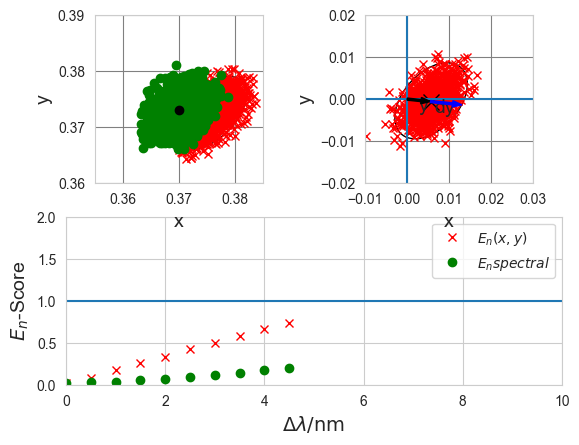

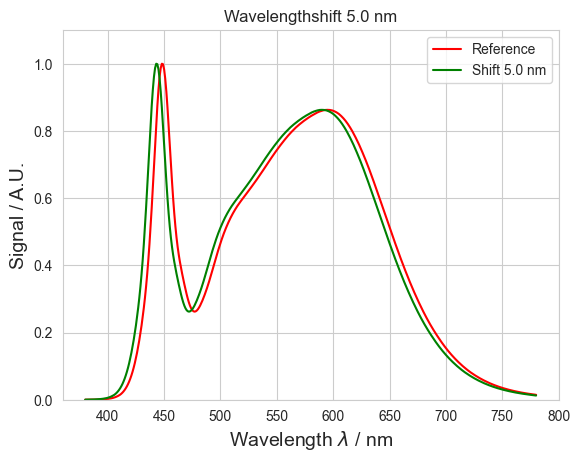

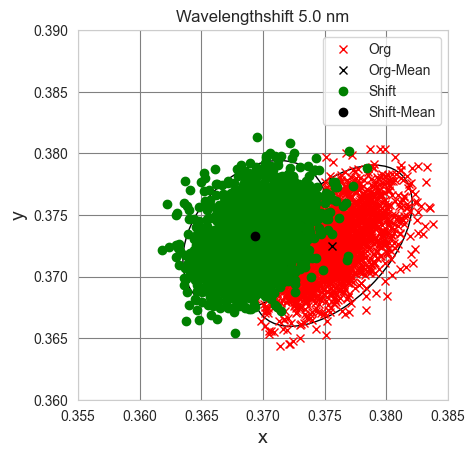

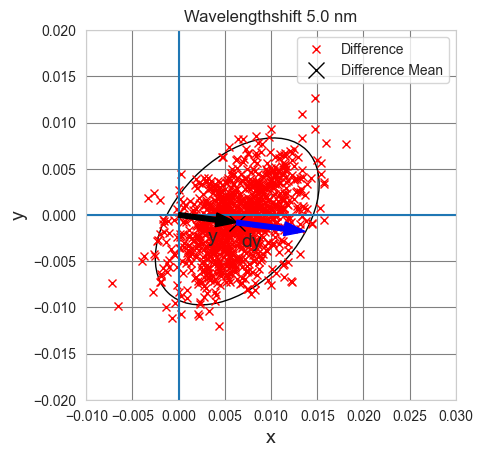

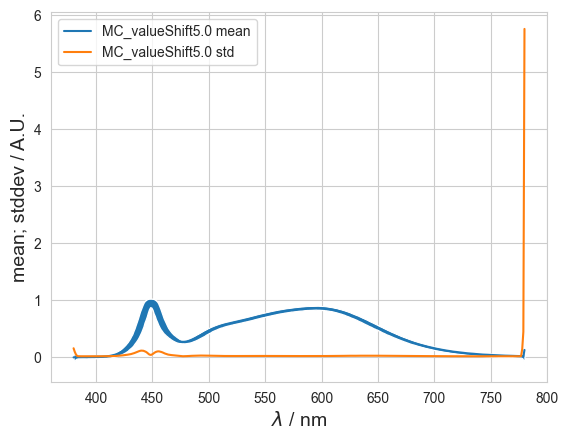

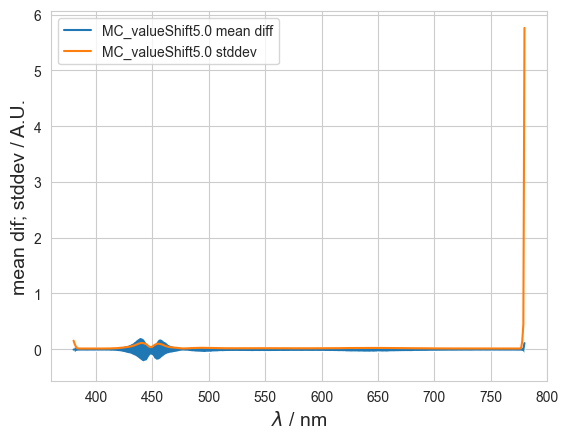

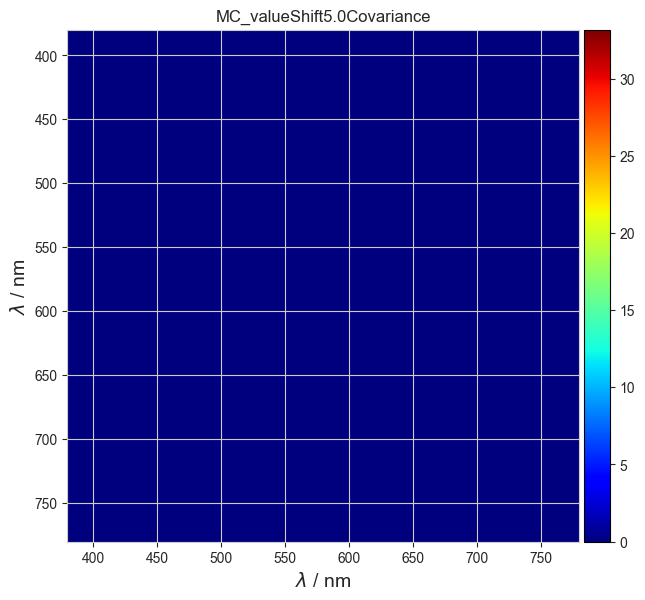

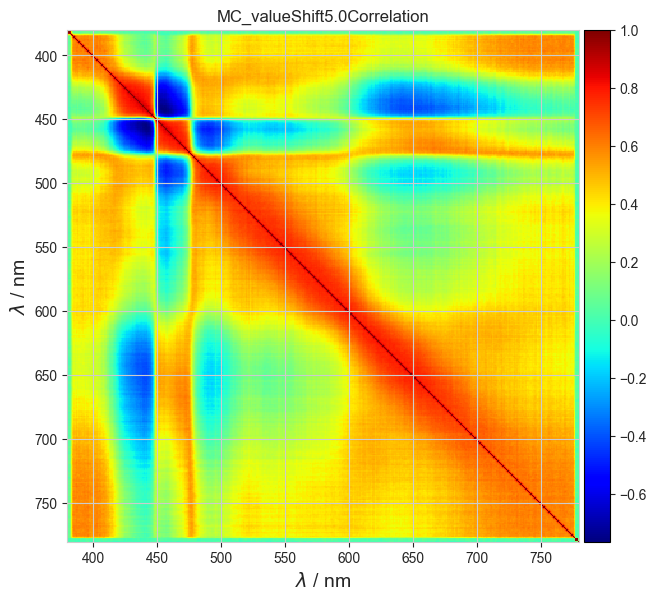

chisquare: 448.690621241841
Difference Vecotr: [-5.6495e-03 -2.1595e-03 7.1623e-05 3.5412e-04 -6.8004e-04 -1.6578e-04
 -6.6378e-04 -3.5434e-04 -5.4870e-04 -9.2044e-04 -6.0208e-04 -9.0400e-04
 -8.1787e-04 -1.0336e-03 -1.2408e-03 -1.7225e-03 -1.5001e-03 -1.9550e-03
 -2.6823e-03 -3.4139e-03 -3.7907e-03 -4.1583e-03 -5.2196e-03 -5.9380e-03
 -6.3755e-03 -7.6740e-03 -9.2670e-03 -1.0571e-02 -1.2324e-02 -1.4390e-02
 -1.6918e-02 -2.0034e-02 -2.3464e-02 -2.6385e-02 -2.9943e-02 -3.4183e-02
 -3.8652e-02 -4.3827e-02 -5.0008e-02 -5.5272e-02 -6.1331e-02 -6.8238e-02
 -7.5815e-02 -8.2310e-02 -9.0586e-02 -9.8404e-02 -1.0769e-01 -1.1840e-01
 -1.2850e-01 -1.4141e-01 -1.5660e-01 -1.7519e-01 -1.9245e-01 -2.1199e-01
 -2.3089e-01 -2.4888e-01 -2.6600e-01 -2.7958e-01 -2.8177e-01 -2.7812e-01
 -2.6549e-01 -2.3921e-01 -2.0515e-01 -1.6333e-01 -1.1298e-01 -5.3852e-02
 5.7929e-03 6.3697e-02 1.1606e-01 1.6297e-01 1.9956e-01 2.2672e-01
 2.3978e-01 2.4636e-01 2.4115e-01 2.2798e-01 2.1277e-01 1.9057e-01
 1.6966e-01 1.4983

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [6.8334e-03 -9.3765e-04] 0.006897463977992917
Resulting Covariance Matrix: [[1.2663e-05 5.5297e-06]
 [5.5297e-06 1.3345e-05]]
dy: 0.007480108139411954
DoE: 0.9221075216347284
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

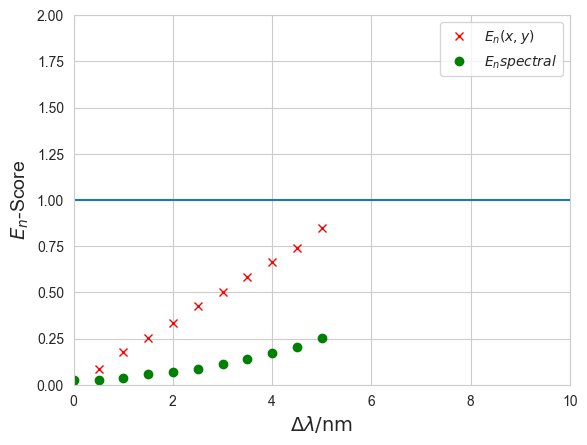

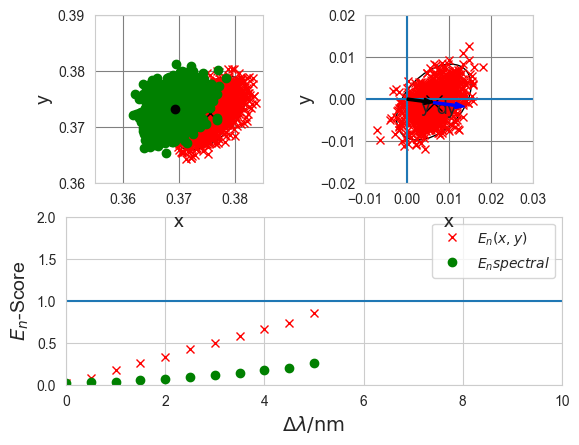

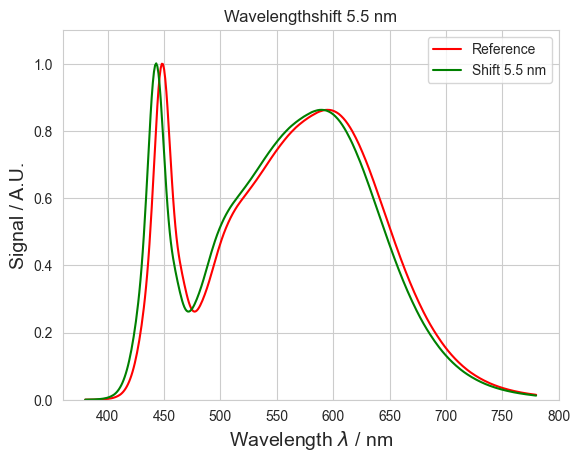

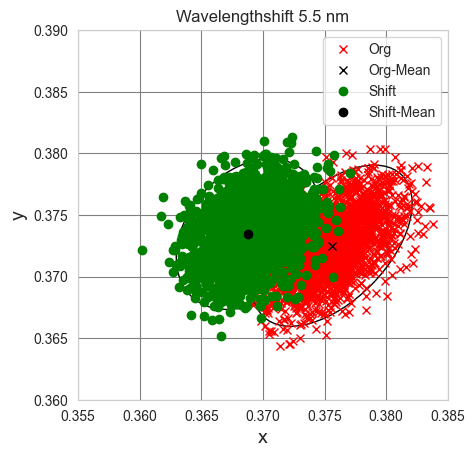

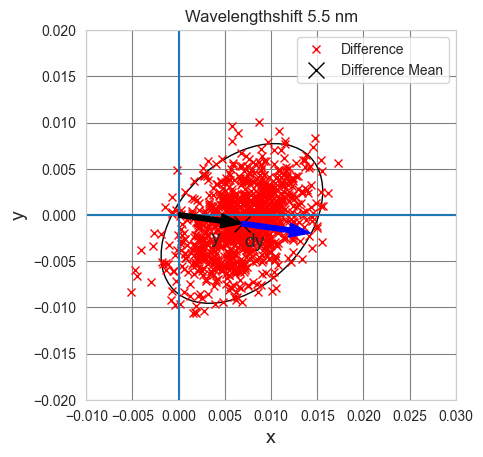

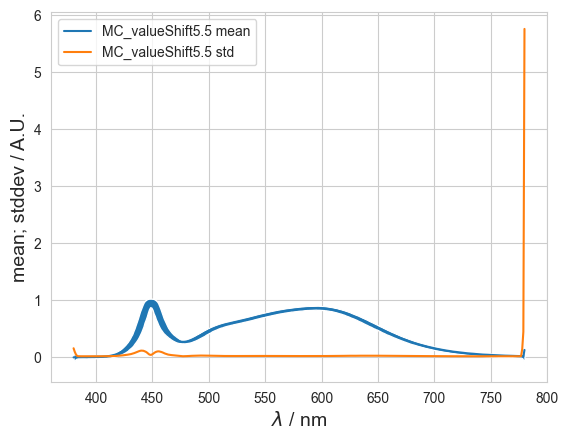

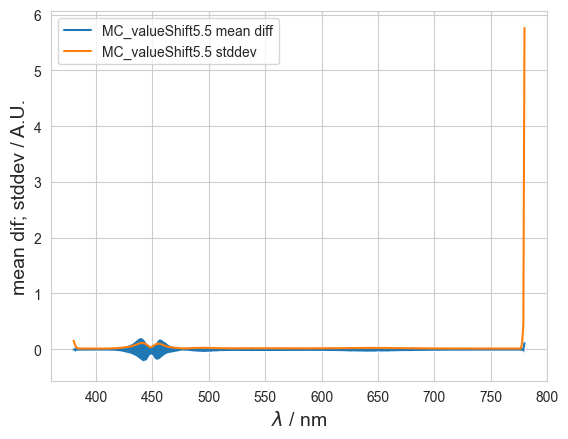

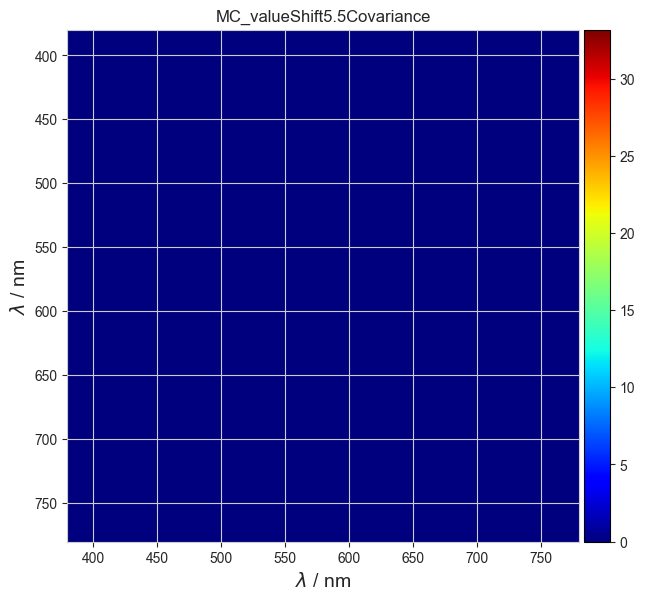

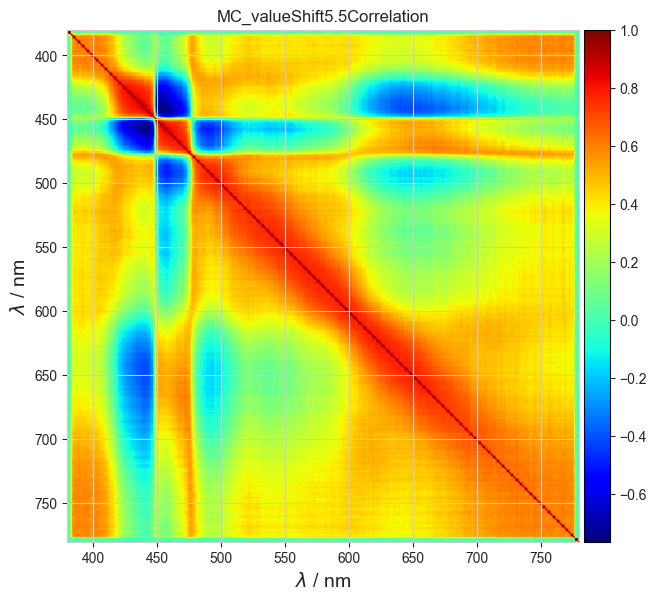

chisquare: 448.690621241841
Difference Vecotr: [-7.6398e-02 -4.3950e-02 -1.3543e-02 -7.0811e-04 -3.6558e-04 -6.0168e-04
 -4.9413e-04 -4.0043e-04 -3.9317e-04 -9.6808e-04 -9.0860e-04 -1.7279e-03
 -1.5386e-03 -1.2446e-03 -1.7187e-03 -2.1545e-03 -2.4225e-03 -2.5140e-03
 -3.1627e-03 -3.5106e-03 -4.5364e-03 -5.0841e-03 -6.1629e-03 -7.0588e-03
 -7.5819e-03 -8.6517e-03 -1.0262e-02 -1.2035e-02 -1.4025e-02 -1.6042e-02
 -1.8967e-02 -2.2904e-02 -2.6327e-02 -2.9663e-02 -3.4041e-02 -3.8608e-02
 -4.3374e-02 -4.9938e-02 -5.6503e-02 -6.2291e-02 -6.8967e-02 -7.7333e-02
 -8.4655e-02 -9.2574e-02 -1.0092e-01 -1.0968e-01 -1.2035e-01 -1.3215e-01
 -1.4489e-01 -1.6047e-01 -1.7713e-01 -1.9663e-01 -2.1810e-01 -2.3612e-01
 -2.5805e-01 -2.7864e-01 -2.9430e-01 -3.0616e-01 -3.0918e-01 -2.9919e-01
 -2.8157e-01 -2.5265e-01 -2.1328e-01 -1.6306e-01 -1.0831e-01 -4.4430e-02
 1.9625e-02 8.1080e-02 1.3556e-01 1.8414e-01 2.2231e-01 2.4844e-01
 2.6349e-01 2.6707e-01 2.5958e-01 2.4568e-01 2.2614e-01 2.0307e-01
 1.8035e-01 1.58

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [7.4015e-03 -1.2398e-03] 0.007504630431250485
Resulting Covariance Matrix: [[1.2485e-05 5.3161e-06]
 [5.3161e-06 1.3221e-05]]
dy: 0.007408498089538634
DoE: 1.0129759555243185
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

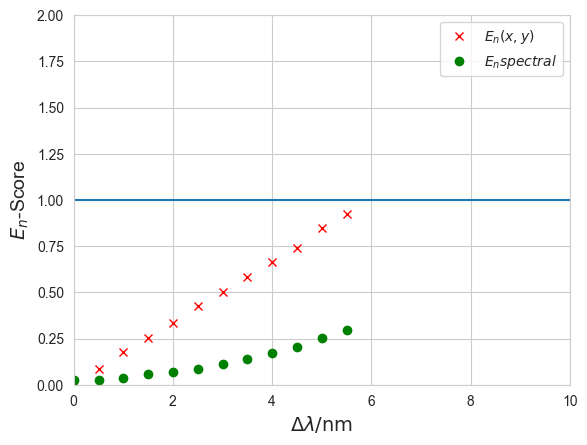

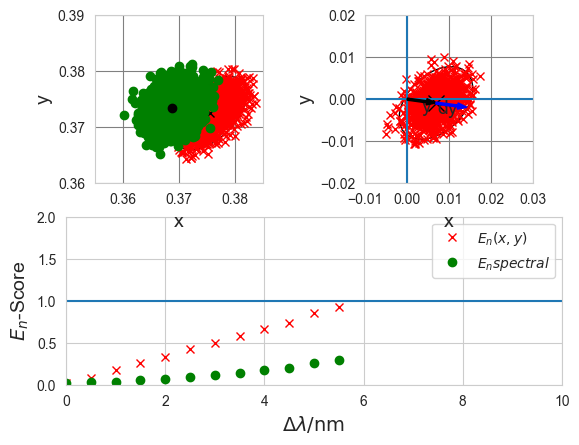

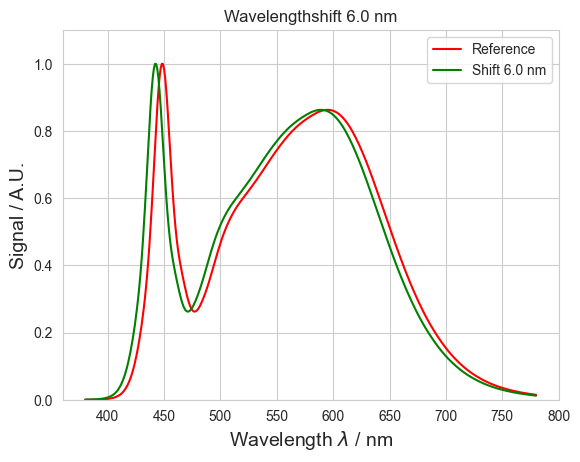

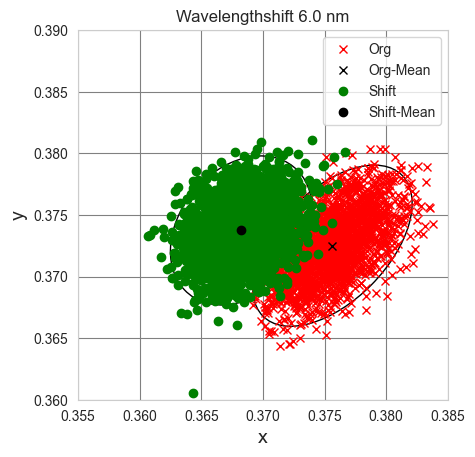

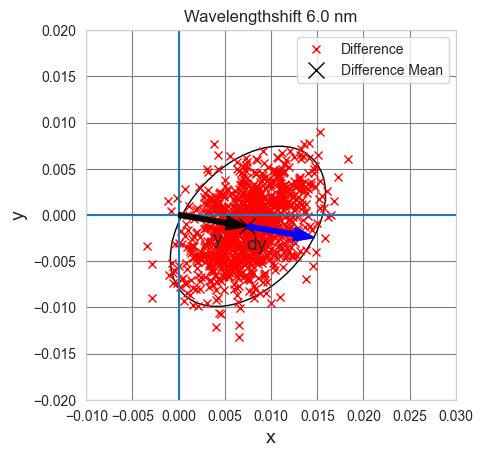

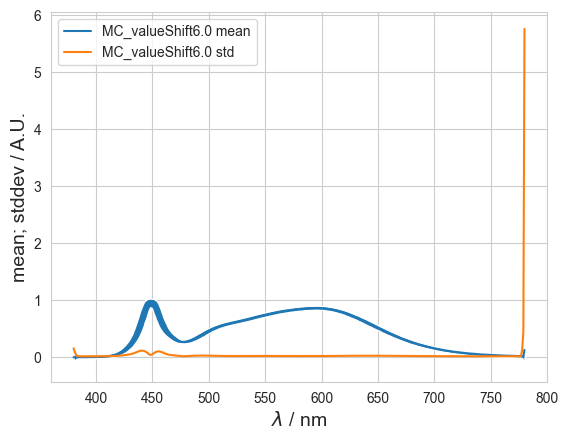

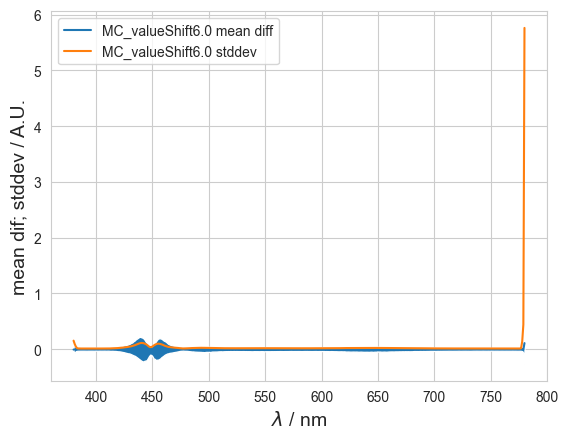

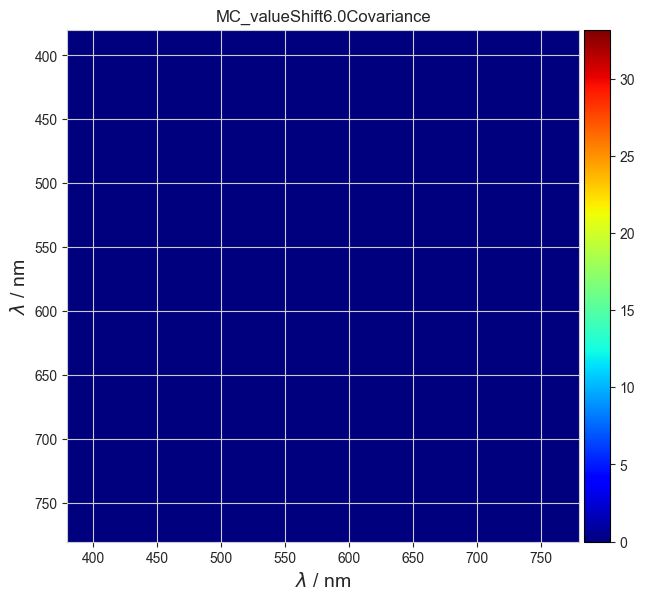

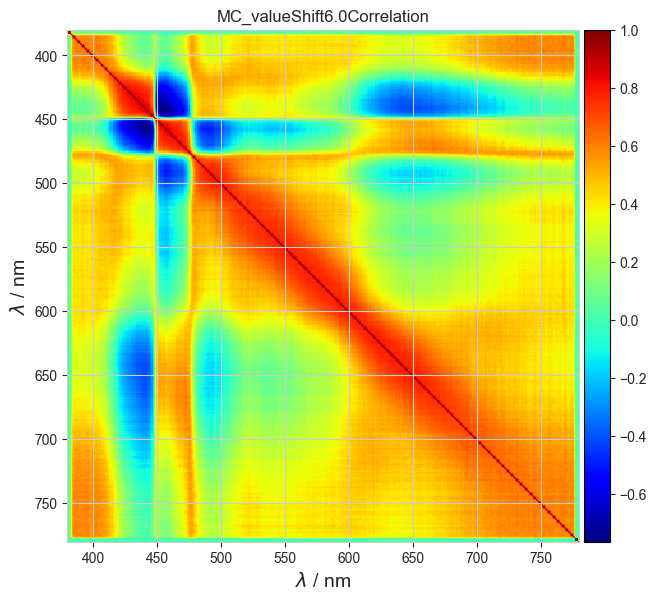

chisquare: 448.690621241841
Difference Vecotr: [-1.3724e-01 -1.0272e-01 -6.9684e-02 -3.8380e-02 -8.4194e-03 1.1416e-04
 -1.7846e-04 -1.4410e-04 -2.9288e-04 -3.5280e-04 -4.1254e-04 -9.2956e-04
 -9.4144e-04 -9.8445e-04 -1.4155e-03 -1.8116e-03 -2.2129e-03 -2.4088e-03
 -2.9965e-03 -3.9373e-03 -4.5540e-03 -5.2794e-03 -6.4149e-03 -7.2697e-03
 -8.3310e-03 -9.4799e-03 -1.1307e-02 -1.3556e-02 -1.5942e-02 -1.8483e-02
 -2.1291e-02 -2.5286e-02 -2.9977e-02 -3.3397e-02 -3.7948e-02 -4.3179e-02
 -4.9196e-02 -5.5709e-02 -6.2478e-02 -6.9100e-02 -7.7023e-02 -8.5567e-02
 -9.4111e-02 -1.0320e-01 -1.1187e-01 -1.2234e-01 -1.3382e-01 -1.4731e-01
 -1.6276e-01 -1.7887e-01 -1.9586e-01 -2.1812e-01 -2.4220e-01 -2.6561e-01
 -2.8602e-01 -3.0637e-01 -3.2209e-01 -3.3338e-01 -3.3298e-01 -3.1971e-01
 -2.9902e-01 -2.6400e-01 -2.1758e-01 -1.6202e-01 -1.0078e-01 -3.0957e-02
 3.7885e-02 1.0393e-01 1.6159e-01 2.1101e-01 2.5062e-01 2.7491e-01
 2.8731e-01 2.8835e-01 2.8126e-01 2.6337e-01 2.4146e-01 2.1663e-01
 1.9188e-01 1.695

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [8.0596e-03 -1.3232e-03] 0.008167490856569863
Resulting Covariance Matrix: [[1.2514e-05 5.4043e-06]
 [5.4043e-06 1.3255e-05]]
dy: 0.007397515682586429
DoE: 1.104085642670003
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e

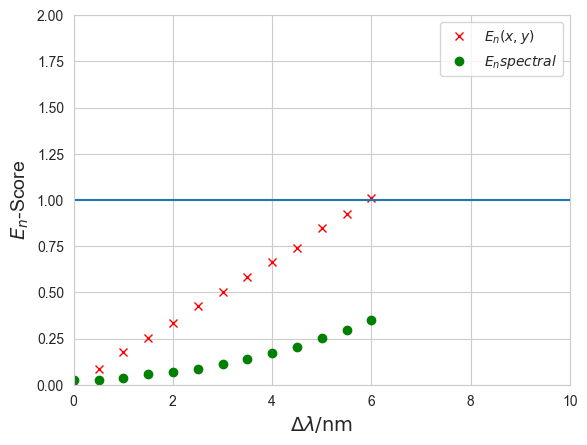

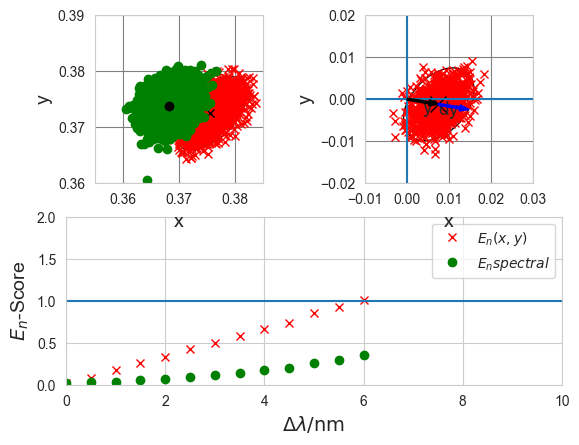

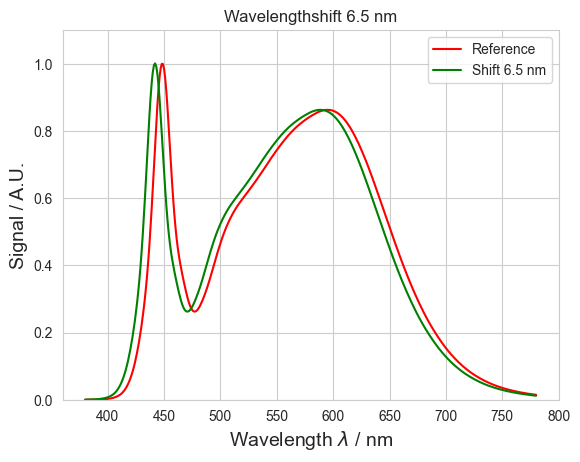

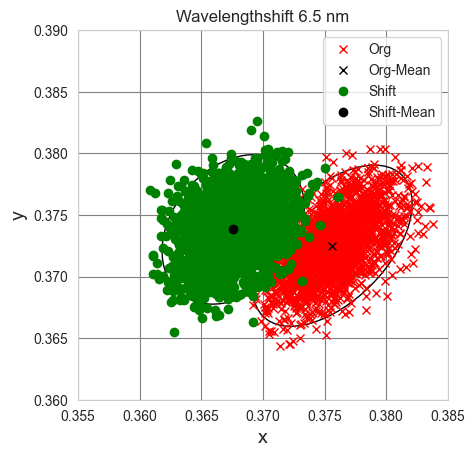

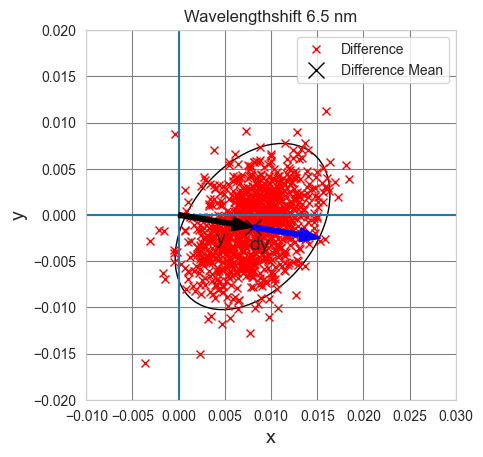

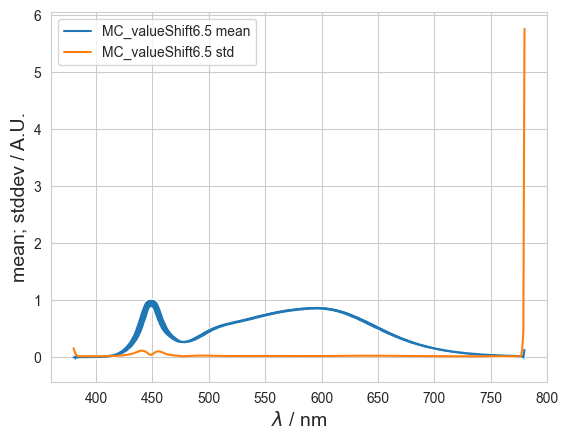

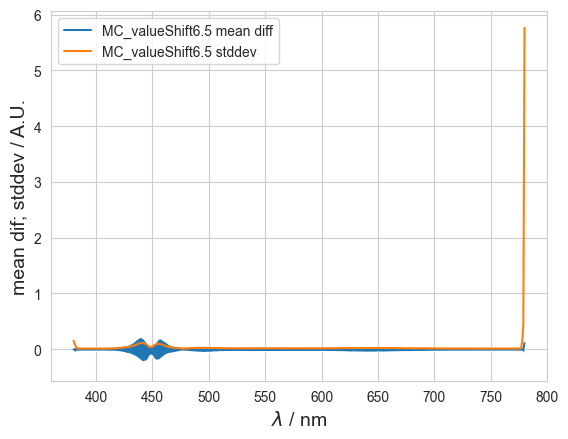

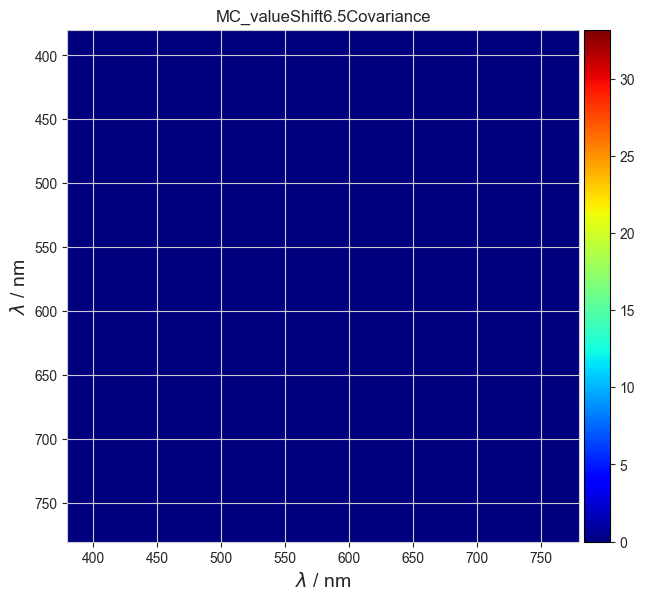

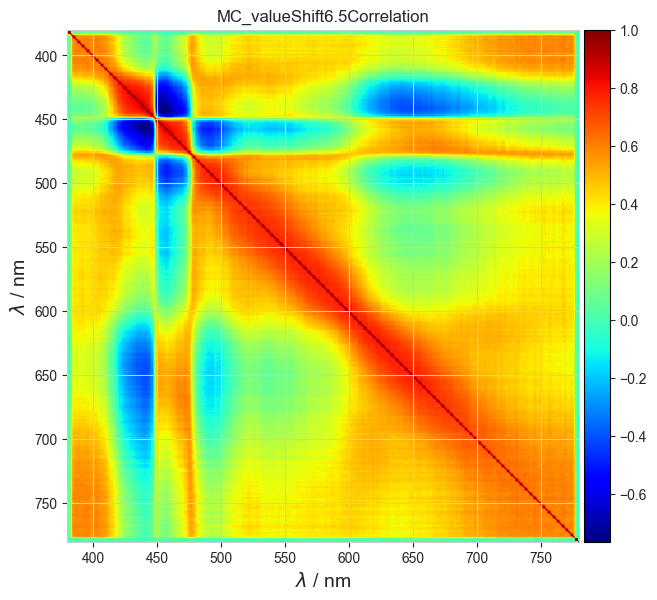

chisquare: 448.690621241841
Difference Vecotr: [-1.1641e-02 -7.6333e-03 -2.4093e-03 -6.3218e-04 1.7696e-04 -1.3589e-05
 -6.9585e-04 -3.7722e-04 -2.6424e-04 -8.9004e-04 -7.6831e-04 -1.3444e-03
 -1.2813e-03 -1.2698e-03 -1.6260e-03 -2.0476e-03 -2.1416e-03 -2.4709e-03
 -2.9232e-03 -3.9987e-03 -5.4704e-03 -6.0526e-03 -6.9646e-03 -8.2331e-03
 -9.7140e-03 -1.0707e-02 -1.3321e-02 -1.5635e-02 -1.8671e-02 -2.1604e-02
 -2.4746e-02 -2.9443e-02 -3.3952e-02 -3.8163e-02 -4.3879e-02 -5.0317e-02
 -5.6085e-02 -6.3253e-02 -7.1408e-02 -7.9123e-02 -8.7303e-02 -9.7254e-02
 -1.0654e-01 -1.1732e-01 -1.2781e-01 -1.3876e-01 -1.5182e-01 -1.6679e-01
 -1.8526e-01 -2.0319e-01 -2.2649e-01 -2.4877e-01 -2.7512e-01 -2.9826e-01
 -3.2050e-01 -3.4136e-01 -3.5403e-01 -3.6259e-01 -3.5905e-01 -3.4244e-01
 -3.1361e-01 -2.7112e-01 -2.1834e-01 -1.5526e-01 -8.7470e-02 -1.3447e-02
 6.1191e-02 1.3050e-01 1.8817e-01 2.3898e-01 2.7834e-01 3.0335e-01
 3.1267e-01 3.1228e-01 3.0013e-01 2.8006e-01 2.5580e-01 2.2918e-01
 2.0392e-01 1.801

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [8.5199e-03 -1.6071e-03] 0.008670106889800907
Resulting Covariance Matrix: [[1.2211e-05 5.1675e-06]
 [5.1675e-06 1.3384e-05]]
dy: 0.0073351326806689356
DoE: 1.1819972817465418
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

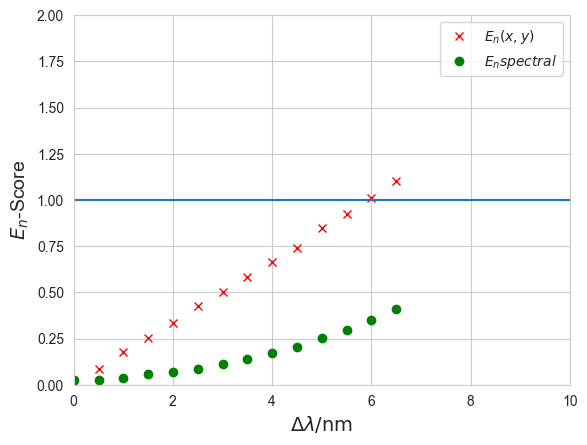

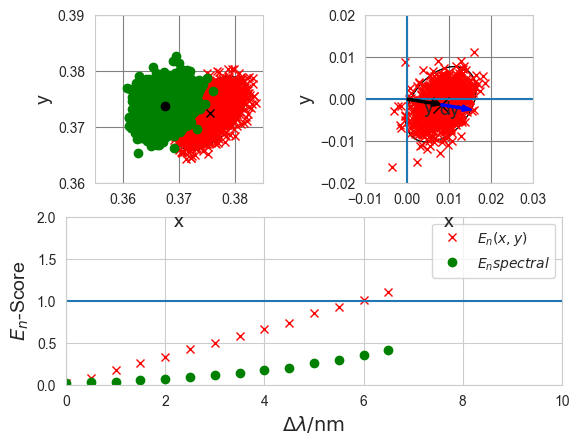

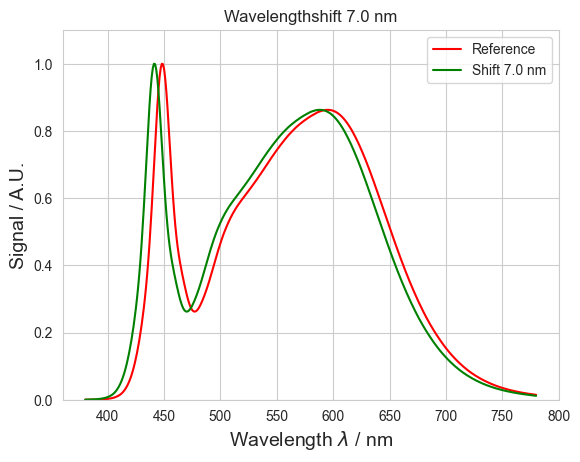

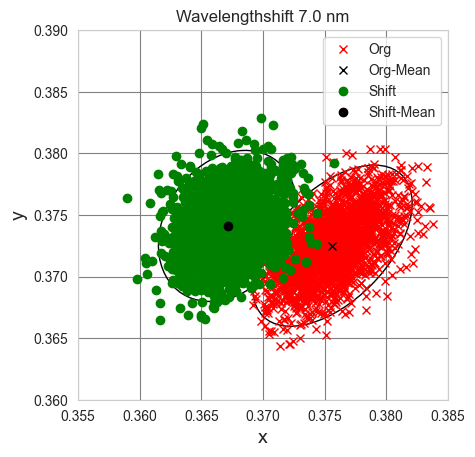

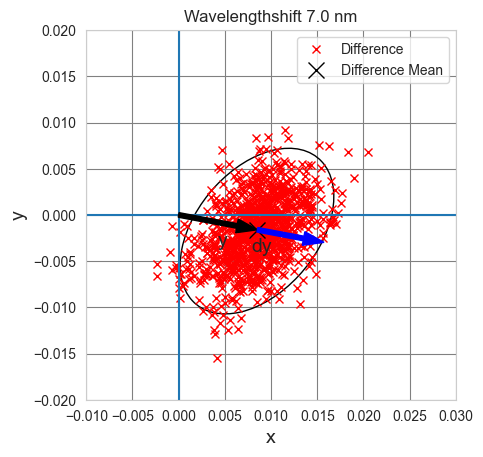

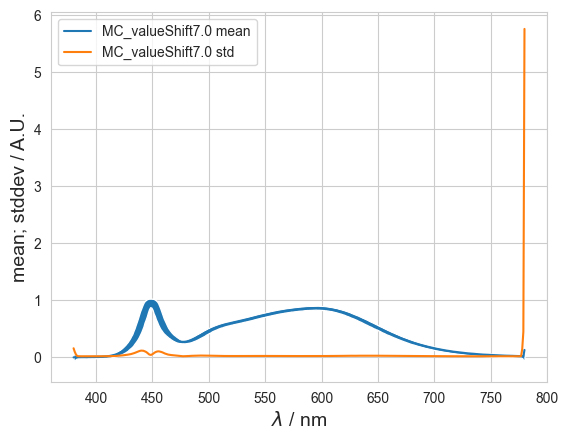

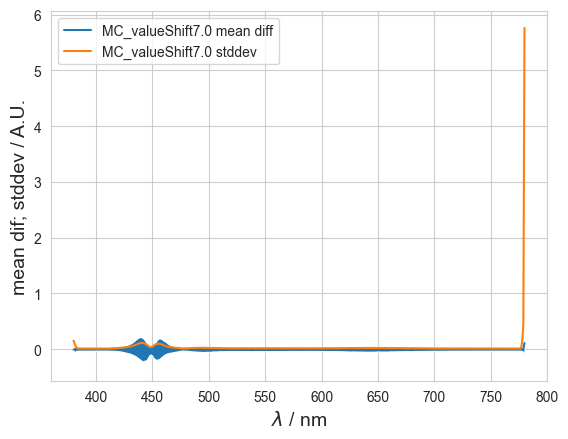

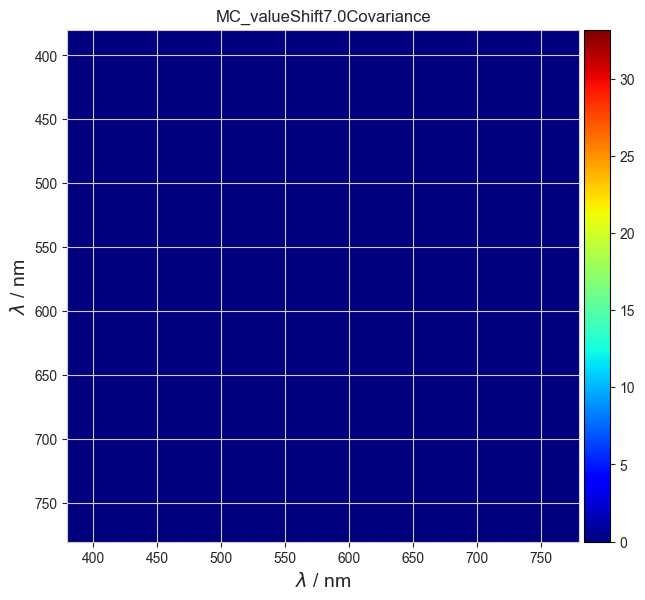

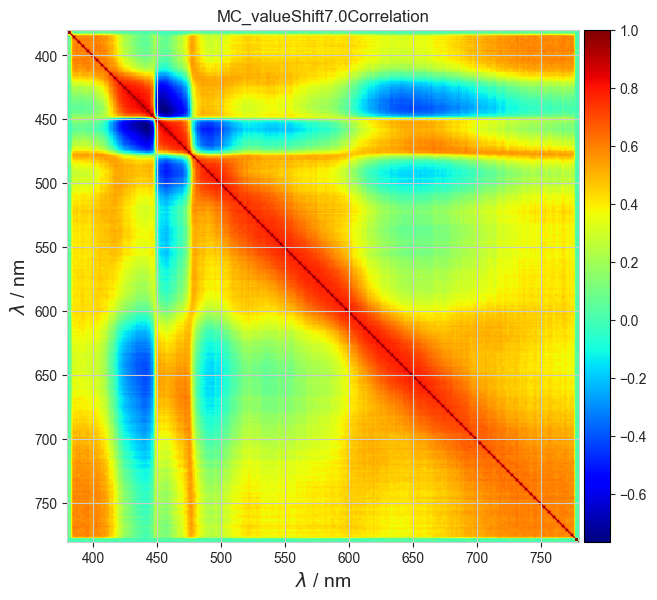

chisquare: 448.690621241841
Difference Vecotr: [4.7065e-03 2.3941e-03 -1.9721e-03 -1.3619e-03 -5.5797e-04 -6.3335e-04
 -1.0114e-03 -6.3504e-04 -6.5620e-04 -1.0141e-03 -1.3299e-03 -1.5750e-03
 -1.6651e-03 -1.9635e-03 -2.1762e-03 -2.6619e-03 -3.0125e-03 -3.4751e-03
 -4.0329e-03 -4.8529e-03 -6.1654e-03 -6.9908e-03 -8.5127e-03 -9.7524e-03
 -1.0988e-02 -1.2479e-02 -1.5055e-02 -1.7541e-02 -2.0821e-02 -2.4267e-02
 -2.7871e-02 -3.2801e-02 -3.8038e-02 -4.2453e-02 -4.8722e-02 -5.4575e-02
 -6.1527e-02 -6.9444e-02 -7.8051e-02 -8.5574e-02 -9.5087e-02 -1.0461e-01
 -1.1481e-01 -1.2556e-01 -1.3850e-01 -1.5067e-01 -1.6473e-01 -1.8025e-01
 -1.9964e-01 -2.2074e-01 -2.4309e-01 -2.7119e-01 -2.9698e-01 -3.2108e-01
 -3.4351e-01 -3.6522e-01 -3.7715e-01 -3.8353e-01 -3.7738e-01 -3.5591e-01
 -3.2361e-01 -2.7529e-01 -2.1784e-01 -1.5211e-01 -7.8272e-02 5.7466e-05
 7.6332e-02 1.4818e-01 2.0794e-01 2.5835e-01 2.9774e-01 3.2043e-01
 3.2754e-01 3.2552e-01 3.1145e-01 2.8979e-01 2.6579e-01 2.3725e-01
 2.1082e-01 1.8588e

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [9.1336e-03 -1.9825e-03] 0.009346300667828605
Resulting Covariance Matrix: [[1.2354e-05 5.0814e-06]
 [5.0814e-06 1.3205e-05]]
dy: 0.0073393113583404244
DoE: 1.2734574419175484
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

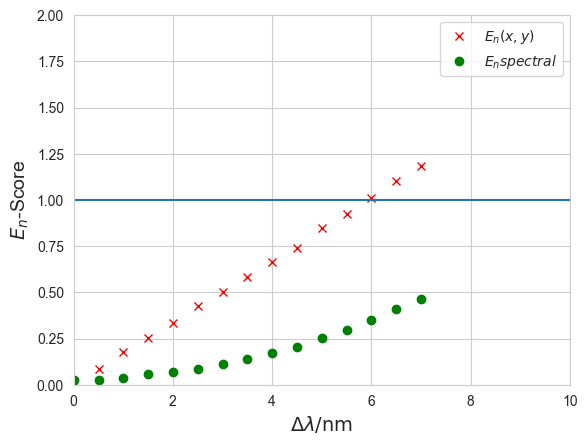

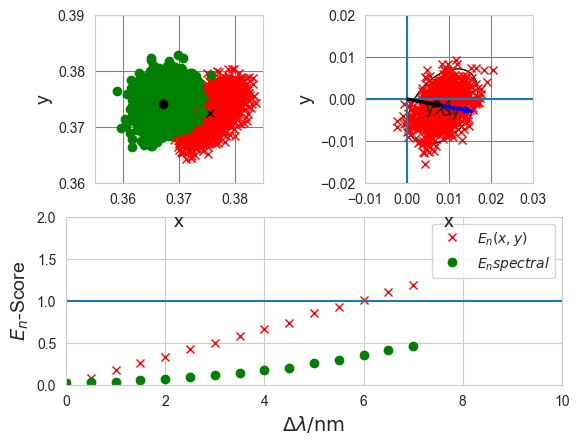

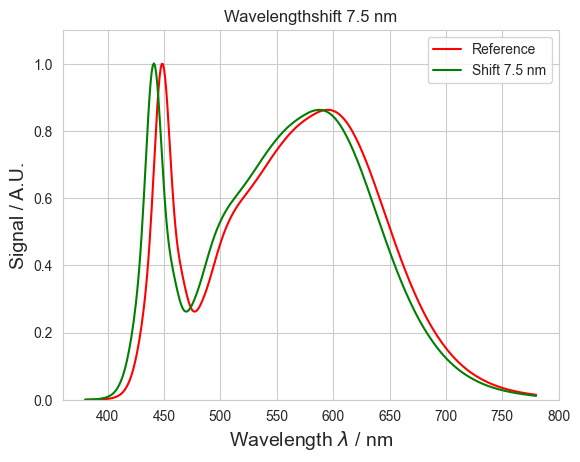

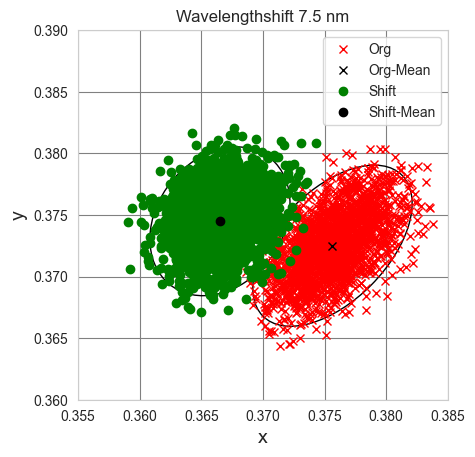

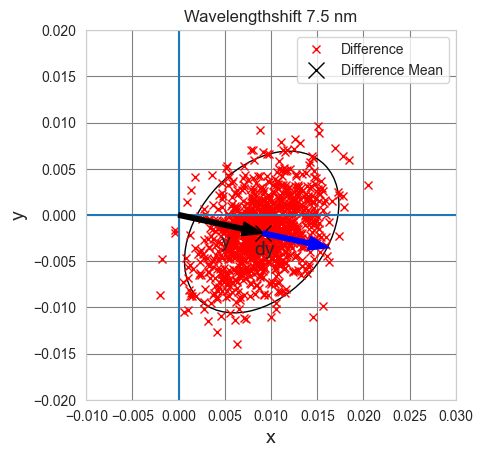

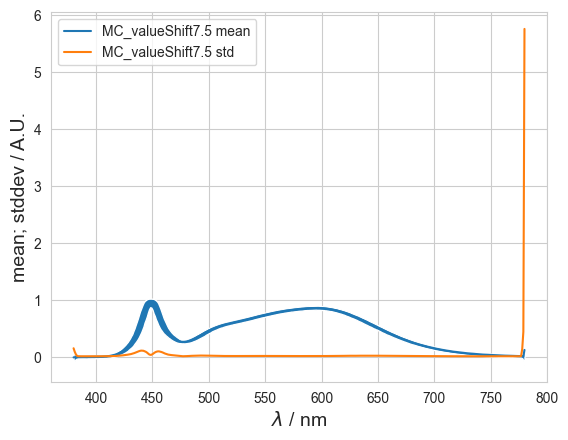

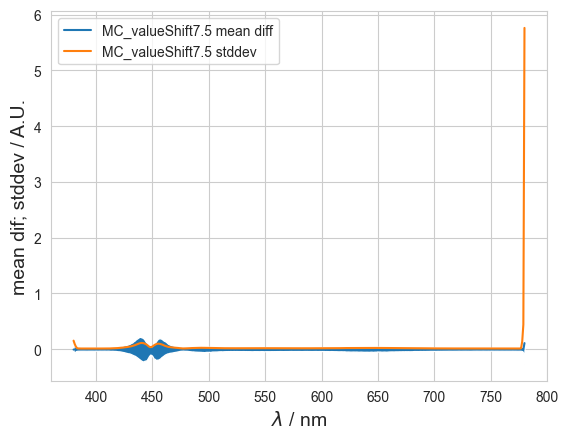

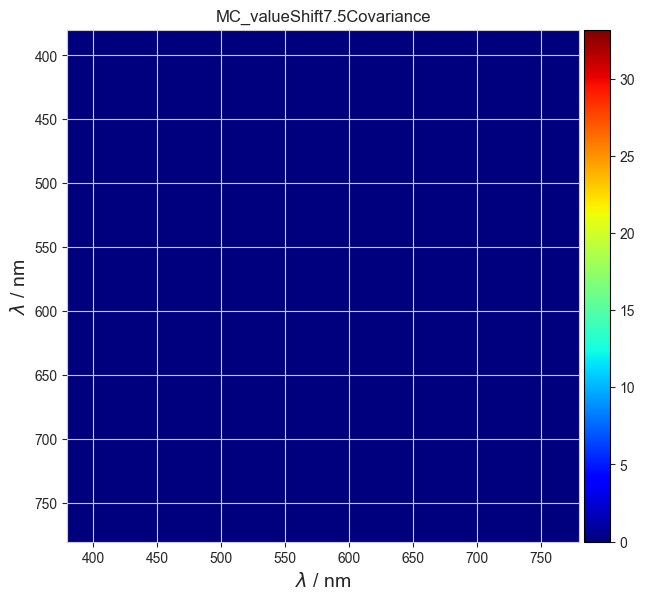

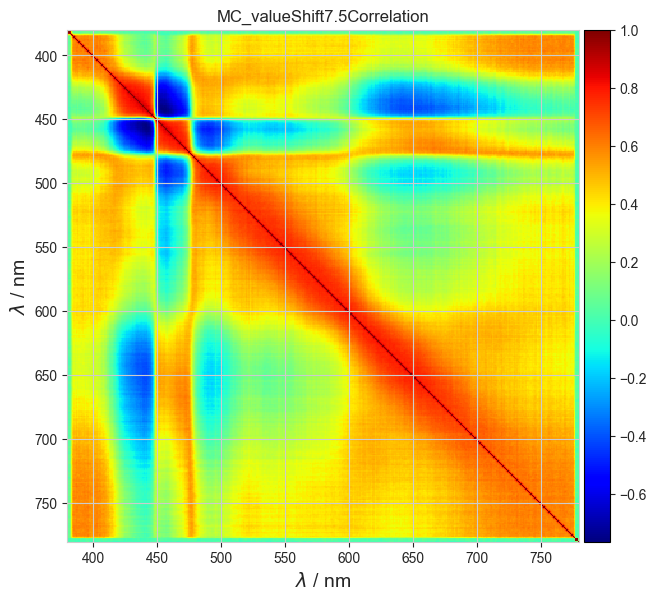

chisquare: 448.690621241841
Difference Vecotr: [-2.2145e-02 -1.4572e-02 -6.6533e-03 -8.5002e-04 3.1602e-03 2.0488e-03
 3.0507e-04 -1.9289e-04 -4.2892e-04 -8.5151e-04 -6.1896e-04 -1.2548e-03
 -1.4312e-03 -1.7543e-03 -2.1743e-03 -2.8822e-03 -3.0659e-03 -3.7138e-03
 -4.0639e-03 -5.1134e-03 -6.1440e-03 -7.5662e-03 -8.9954e-03 -1.0271e-02
 -1.1898e-02 -1.3897e-02 -1.6704e-02 -1.9455e-02 -2.2916e-02 -2.6711e-02
 -3.1034e-02 -3.5837e-02 -4.1839e-02 -4.7539e-02 -5.4245e-02 -6.0861e-02
 -6.8138e-02 -7.6665e-02 -8.6430e-02 -9.5127e-02 -1.0519e-01 -1.1643e-01
 -1.2730e-01 -1.4008e-01 -1.5168e-01 -1.6656e-01 -1.8217e-01 -2.0175e-01
 -2.2248e-01 -2.4570e-01 -2.7015e-01 -2.9763e-01 -3.2763e-01 -3.5201e-01
 -3.7528e-01 -3.9600e-01 -4.0563e-01 -4.0885e-01 -3.9681e-01 -3.6910e-01
 -3.3076e-01 -2.7580e-01 -2.1163e-01 -1.3894e-01 -5.9965e-02 2.4355e-02
 1.0570e-01 1.7910e-01 2.3812e-01 2.8868e-01 3.2489e-01 3.4644e-01
 3.5239e-01 3.4753e-01 3.3014e-01 3.0690e-01 2.8045e-01 2.5042e-01
 2.2185e-01 1.9674e-

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [9.6871e-03 -2.1466e-03] 0.00992207648528322
Resulting Covariance Matrix: [[1.2046e-05 4.9446e-06]
 [4.9446e-06 1.3250e-05]]
dy: 0.007279319466188154
DoE: 1.3630500119373048
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e

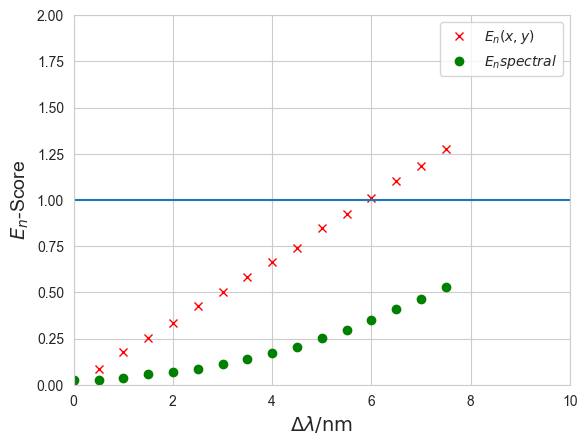

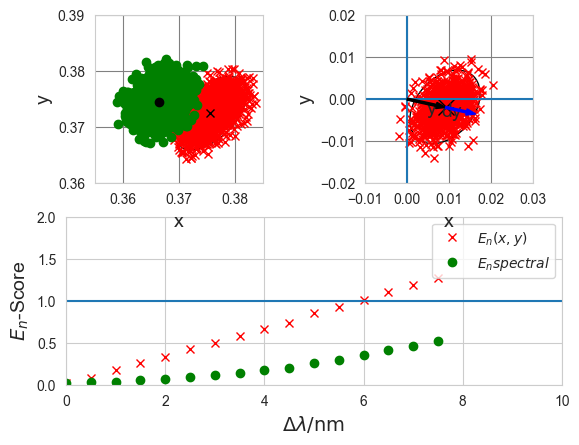

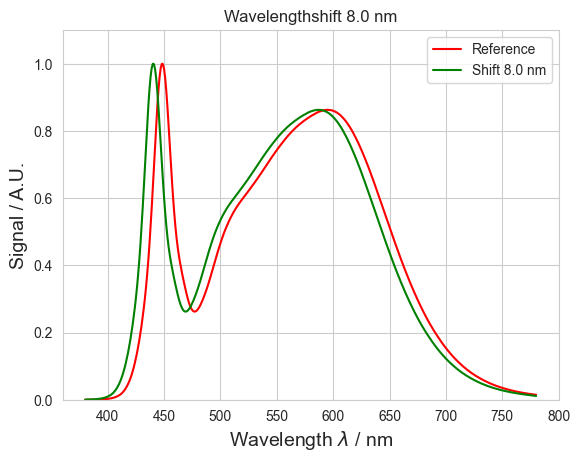

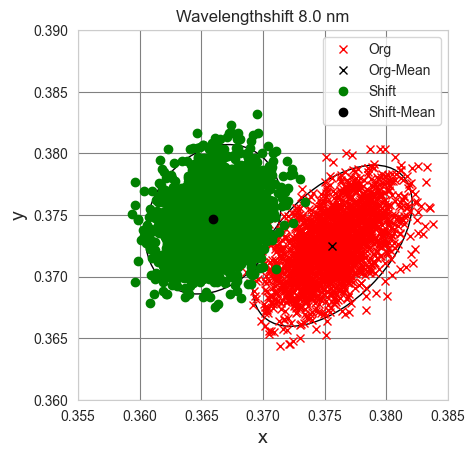

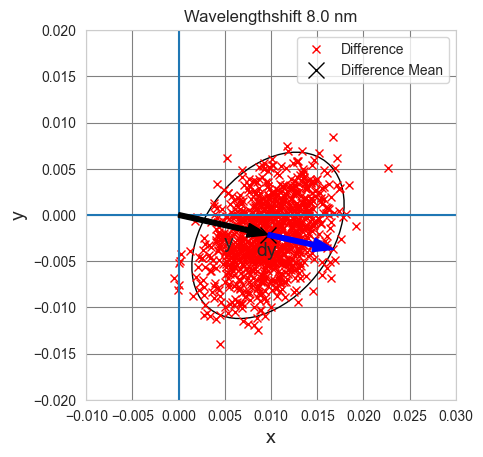

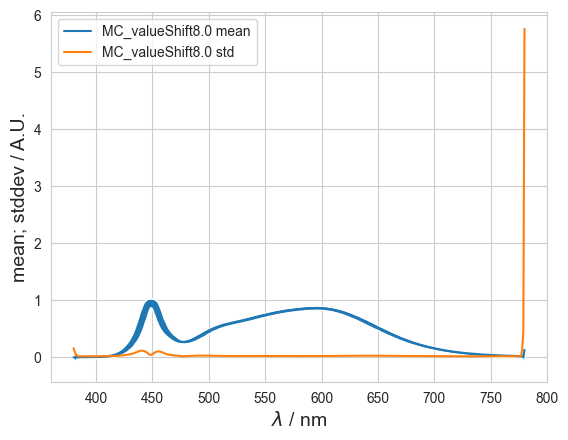

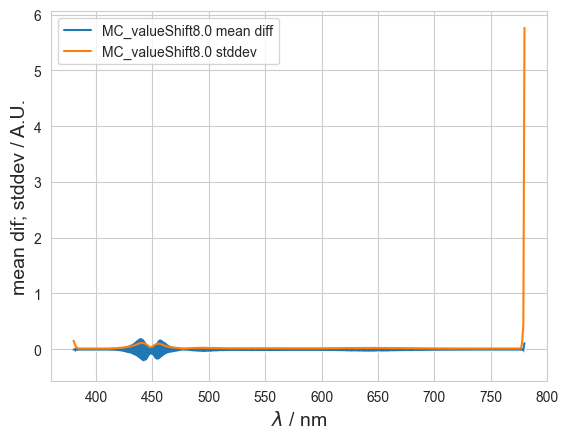

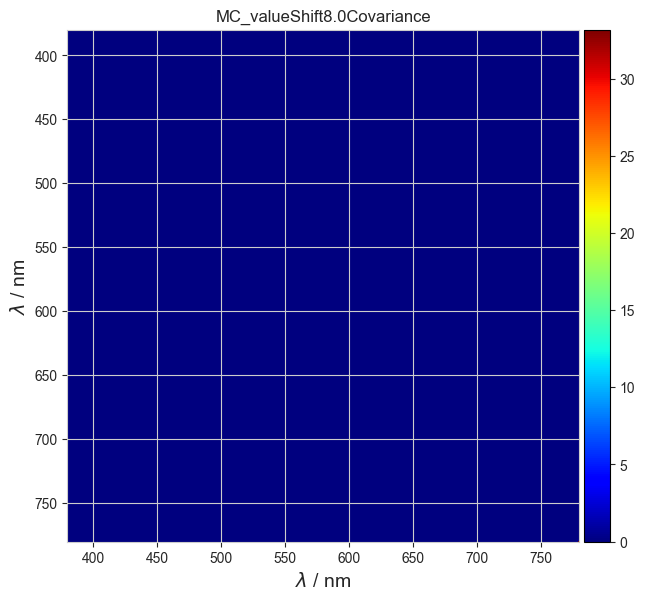

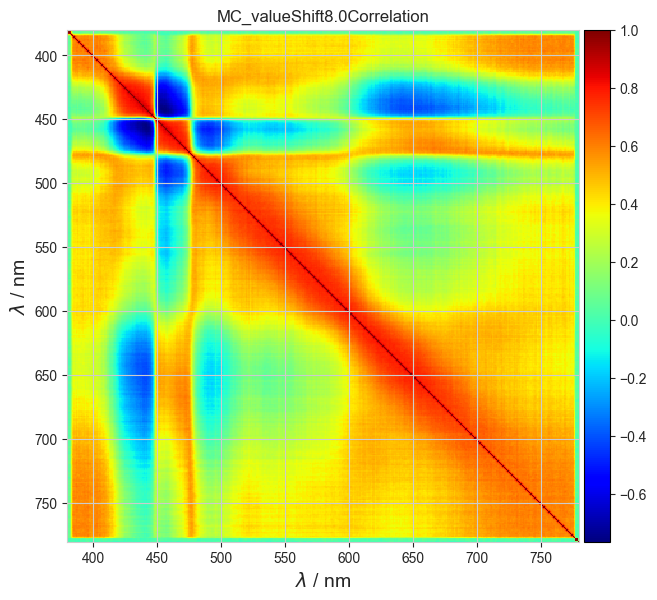

chisquare: 448.690621241841
Difference Vecotr: [-6.2567e-03 -3.7396e-03 -2.1269e-03 -1.1030e-03 -3.1612e-04 -5.1897e-04
 -9.2679e-04 -6.3181e-04 -7.6280e-04 -1.5013e-03 -1.2203e-03 -1.7831e-03
 -1.9062e-03 -2.3827e-03 -3.0234e-03 -3.3743e-03 -3.4639e-03 -4.2259e-03
 -4.9718e-03 -5.9781e-03 -7.3620e-03 -8.6999e-03 -1.0327e-02 -1.1993e-02
 -1.3839e-02 -1.5906e-02 -1.8893e-02 -2.1804e-02 -2.5747e-02 -3.0259e-02
 -3.4828e-02 -4.0537e-02 -4.6426e-02 -5.2422e-02 -6.0048e-02 -6.7353e-02
 -7.5471e-02 -8.5015e-02 -9.5082e-02 -1.0546e-01 -1.1591e-01 -1.2754e-01
 -1.3929e-01 -1.5265e-01 -1.6779e-01 -1.8355e-01 -1.9999e-01 -2.2060e-01
 -2.4494e-01 -2.7026e-01 -2.9735e-01 -3.2769e-01 -3.5955e-01 -3.8358e-01
 -4.0545e-01 -4.2486e-01 -4.3251e-01 -4.2994e-01 -4.1304e-01 -3.7929e-01
 -3.3548e-01 -2.7525e-01 -2.0449e-01 -1.2550e-01 -4.1642e-02 4.5822e-02
 1.2611e-01 2.0178e-01 2.6397e-01 3.1185e-01 3.4729e-01 3.6673e-01
 3.6915e-01 3.6120e-01 3.4360e-01 3.1791e-01 2.9032e-01 2.5862e-01
 2.3003e-01 2.042

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.0258e-02 -2.5206e-03] 0.010563006512092733
Resulting Covariance Matrix: [[1.1937e-05 4.6158e-06]
 [4.6158e-06 1.3158e-05]]
dy: 0.00730860190279816
DoE: 1.4452841531905845
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e

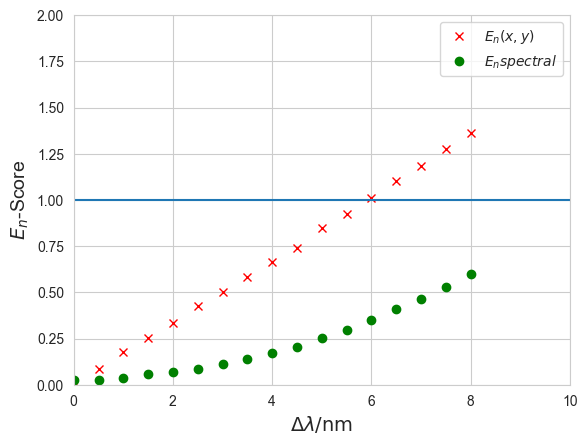

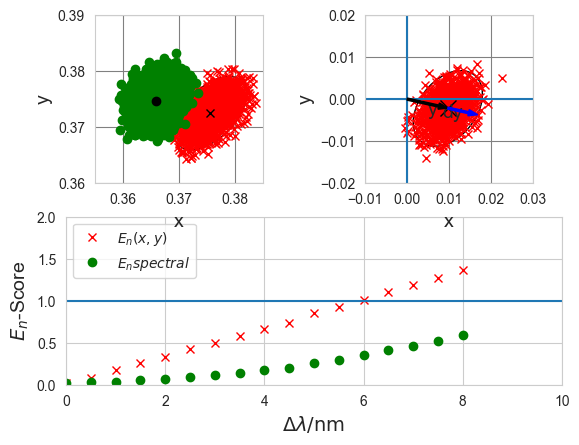

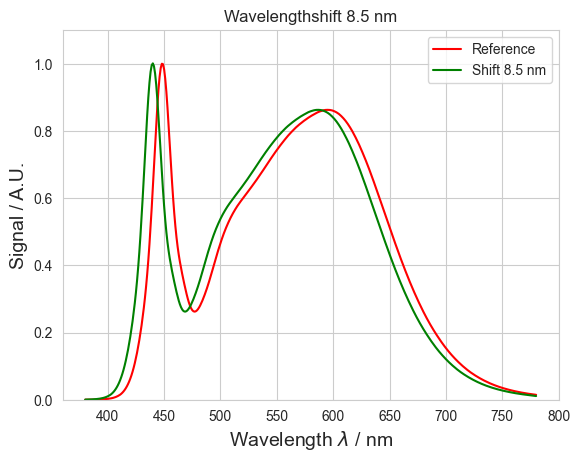

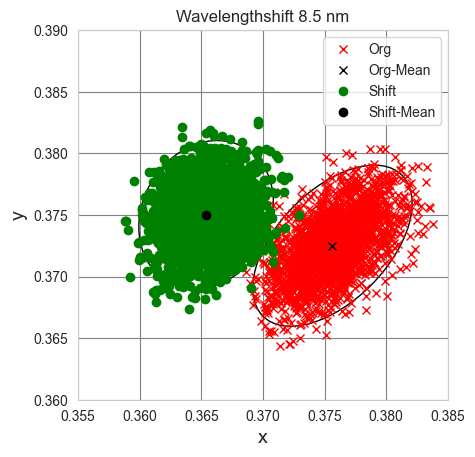

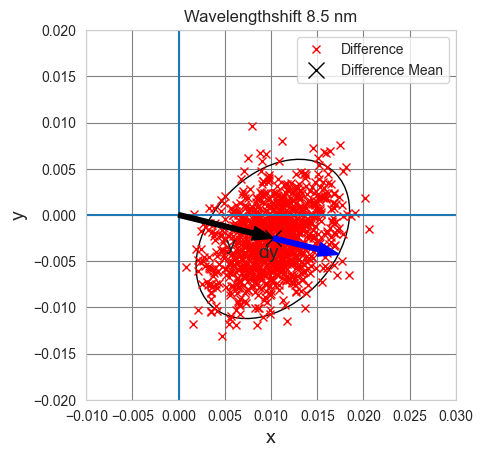

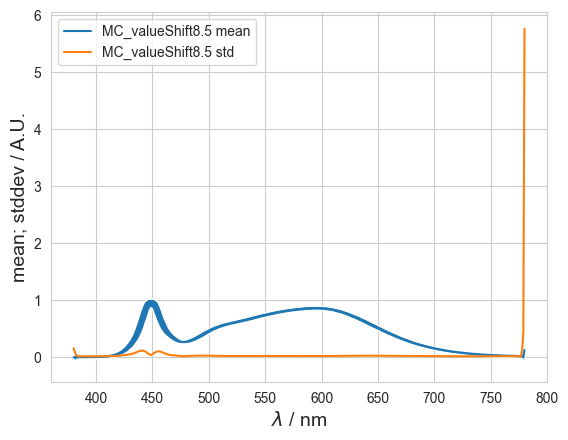

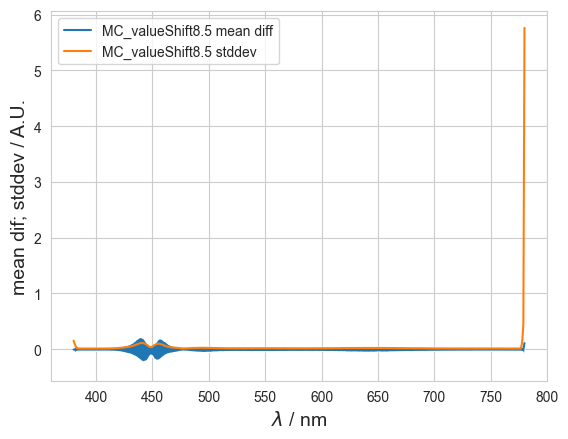

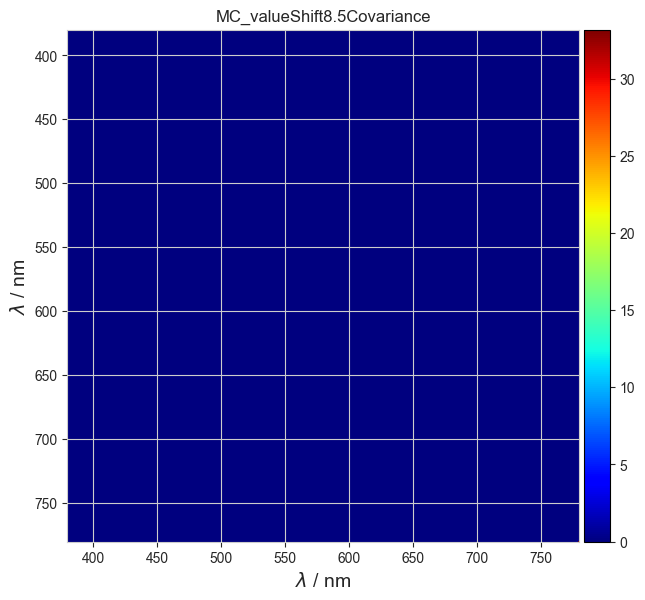

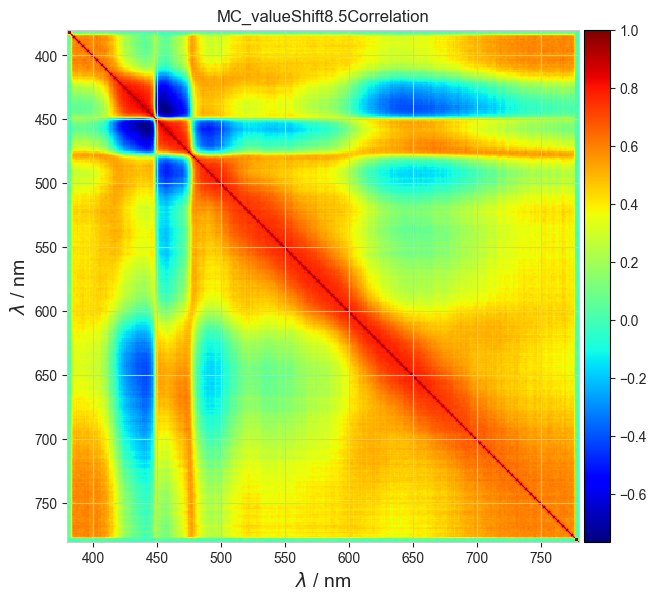

chisquare: 448.690621241841
Difference Vecotr: [-2.5701e-03 -2.1826e-03 -1.8978e-03 -1.5053e-03 -7.8911e-04 -6.3554e-04
 -1.1911e-03 -1.0795e-03 -1.3133e-03 -1.6937e-03 -1.9479e-03 -2.5253e-03
 -2.6542e-03 -2.8009e-03 -3.4317e-03 -3.9233e-03 -4.7234e-03 -5.3515e-03
 -5.7100e-03 -6.7371e-03 -8.4090e-03 -9.8968e-03 -1.1817e-02 -1.3710e-02
 -1.5596e-02 -1.8237e-02 -2.1076e-02 -2.4602e-02 -2.8460e-02 -3.3288e-02
 -3.8755e-02 -4.5408e-02 -5.1646e-02 -5.7758e-02 -6.5686e-02 -7.3886e-02
 -8.2872e-02 -9.3420e-02 -1.0392e-01 -1.1437e-01 -1.2693e-01 -1.3899e-01
 -1.5213e-01 -1.6567e-01 -1.8177e-01 -1.9977e-01 -2.1901e-01 -2.4205e-01
 -2.6678e-01 -2.9596e-01 -3.2496e-01 -3.5528e-01 -3.8702e-01 -4.1239e-01
 -4.3252e-01 -4.4954e-01 -4.5537e-01 -4.4829e-01 -4.2577e-01 -3.8767e-01
 -3.3622e-01 -2.6976e-01 -1.9470e-01 -1.0939e-01 -2.0322e-02 6.8256e-02
 1.5228e-01 2.2734e-01 2.8795e-01 3.3628e-01 3.6920e-01 3.8454e-01
 3.8551e-01 3.7616e-01 3.5679e-01 3.2941e-01 2.9954e-01 2.6784e-01
 2.3864e-01 2.120

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.0731e-02 -3.0393e-03] 0.011152863665076654
Resulting Covariance Matrix: [[1.2020e-05 4.5536e-06]
 [4.5536e-06 1.3417e-05]]
dy: 0.007323246264202265
DoE: 1.522939863376499
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051e

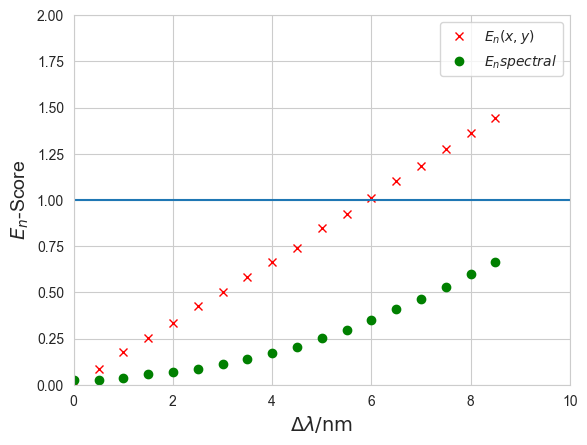

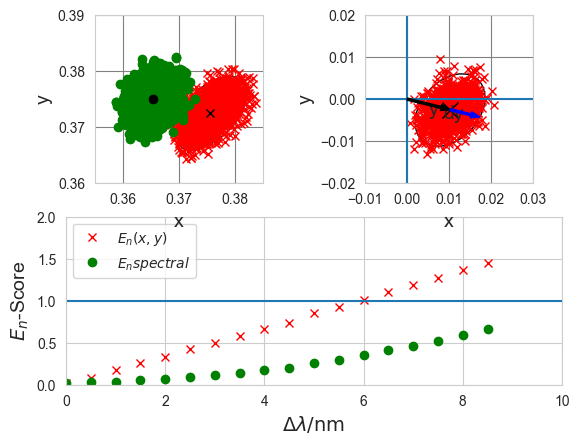

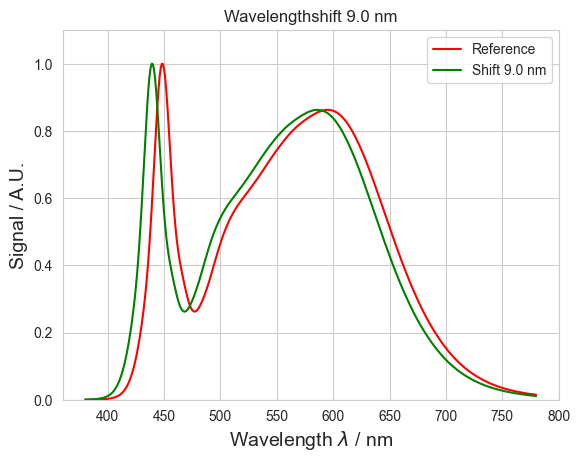

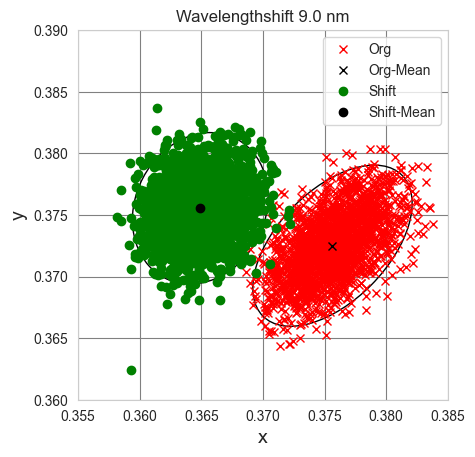

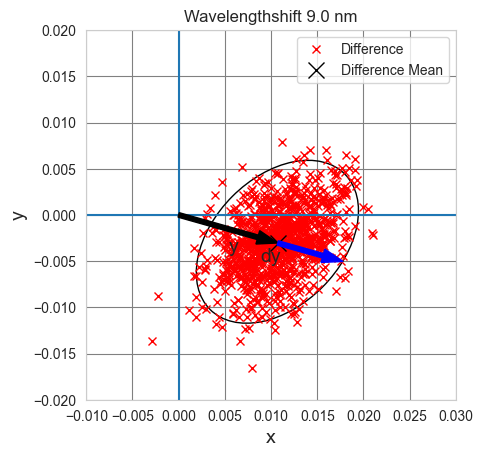

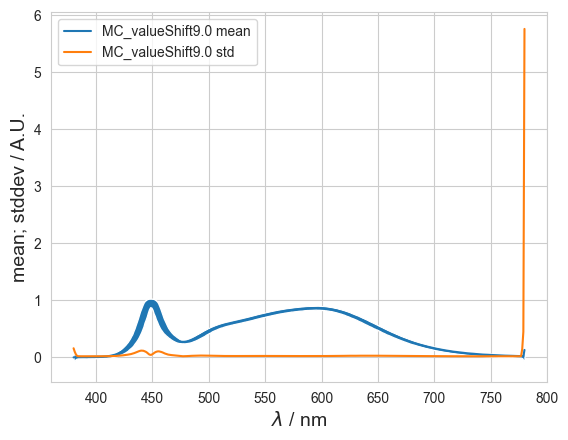

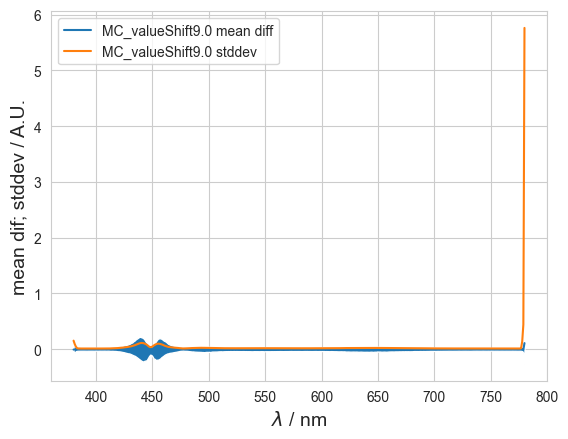

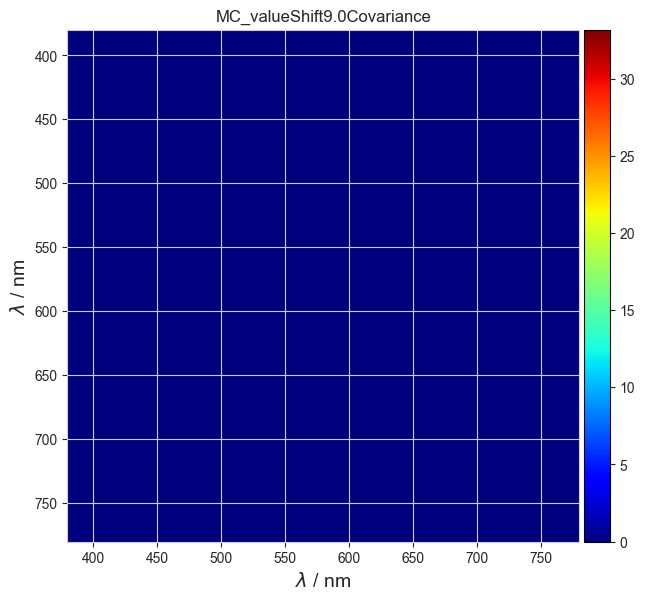

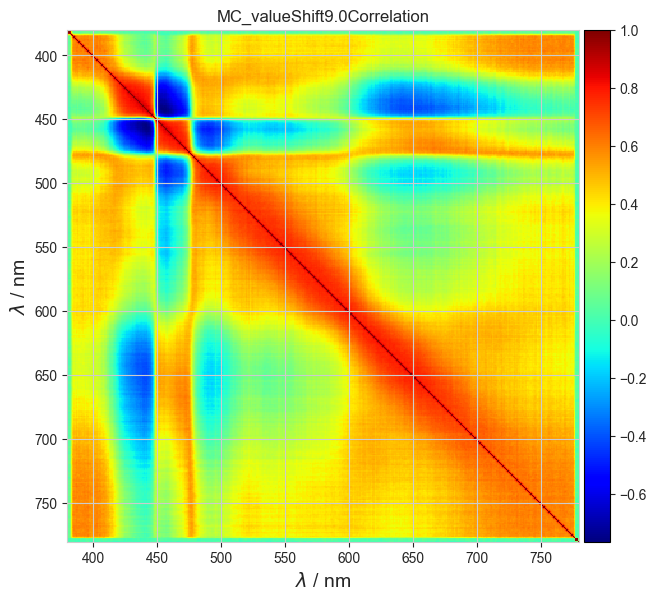

chisquare: 448.690621241841
Difference Vecotr: [-2.5194e-01 -1.5673e-01 -5.9459e-02 -3.1995e-04 -9.1921e-04 -8.1801e-04
 -1.4572e-03 -1.3176e-03 -1.4685e-03 -2.2143e-03 -2.1005e-03 -2.6823e-03
 -2.6009e-03 -2.7969e-03 -3.4583e-03 -4.6700e-03 -5.1662e-03 -5.7288e-03
 -6.5540e-03 -7.6559e-03 -9.4743e-03 -1.0903e-02 -1.3284e-02 -1.5454e-02
 -1.7471e-02 -1.9930e-02 -2.3613e-02 -2.7460e-02 -3.1717e-02 -3.6573e-02
 -4.2610e-02 -4.9312e-02 -5.6540e-02 -6.3858e-02 -7.2747e-02 -8.1193e-02
 -9.0433e-02 -1.0087e-01 -1.1249e-01 -1.2434e-01 -1.3737e-01 -1.5100e-01
 -1.6506e-01 -1.8106e-01 -1.9919e-01 -2.1774e-01 -2.3914e-01 -2.6491e-01
 -2.9135e-01 -3.1912e-01 -3.5214e-01 -3.8613e-01 -4.1814e-01 -4.4260e-01
 -4.6065e-01 -4.7466e-01 -4.7500e-01 -4.6579e-01 -4.3791e-01 -3.9186e-01
 -3.3349e-01 -2.6180e-01 -1.7834e-01 -8.8006e-02 3.3871e-03 9.5762e-02
 1.8168e-01 2.5645e-01 3.1506e-01 3.6300e-01 3.9273e-01 4.0683e-01
 4.0613e-01 3.9353e-01 3.7130e-01 3.4158e-01 3.1089e-01 2.7819e-01
 2.4784e-01 2.2127

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.1345e-02 -3.2270e-03] 0.011794846920240909
Resulting Covariance Matrix: [[1.2143e-05 4.5037e-06]
 [4.5037e-06 1.3567e-05]]
dy: 0.0073942395985032525
DoE: 1.5951399414523206
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.22005

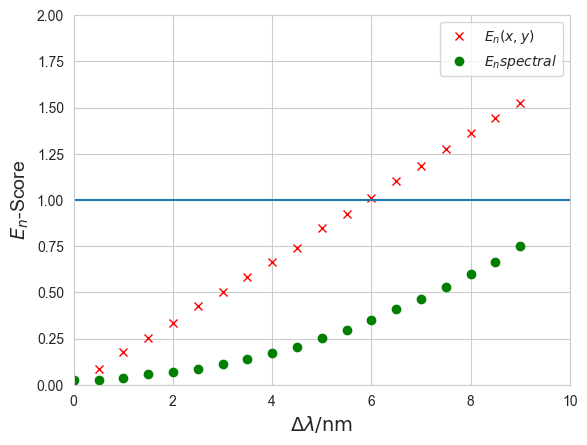

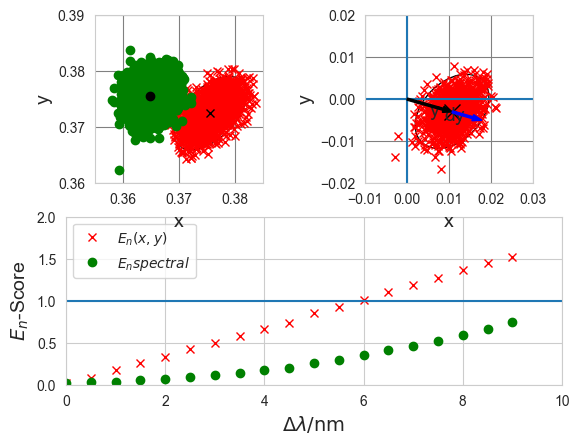

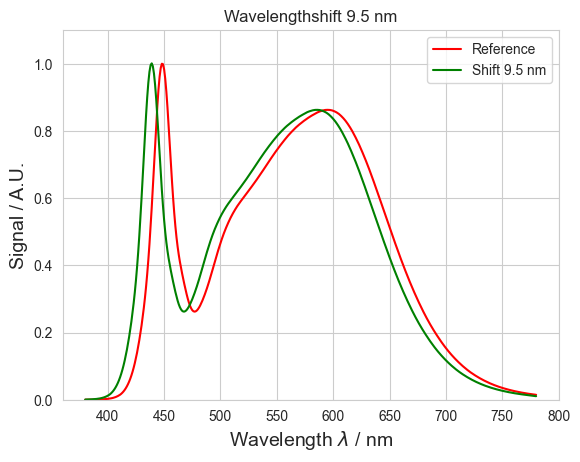

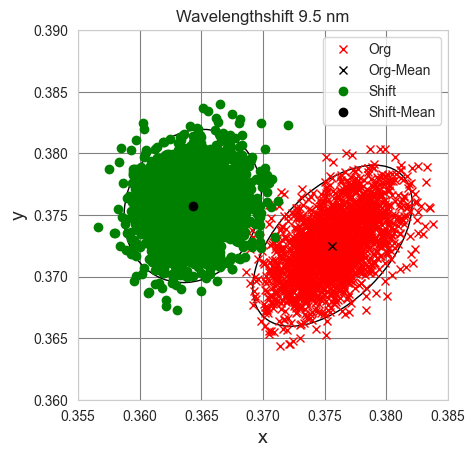

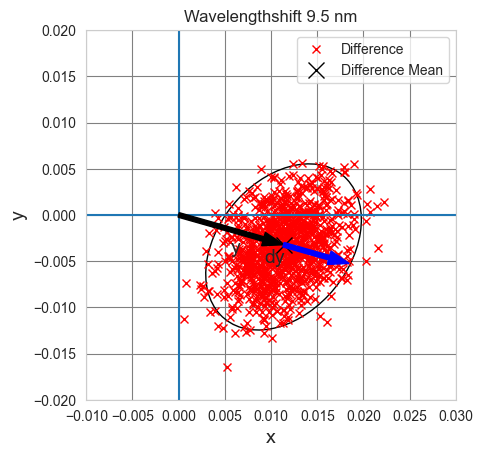

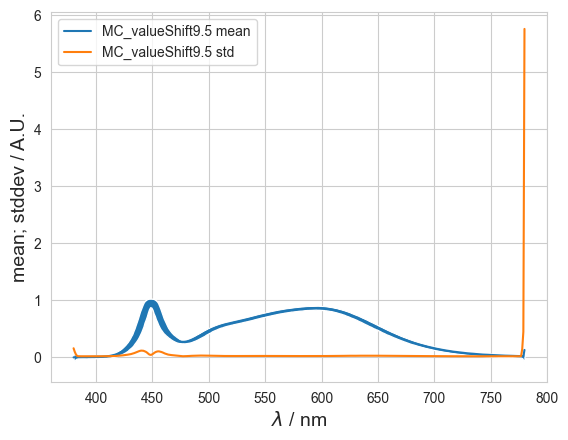

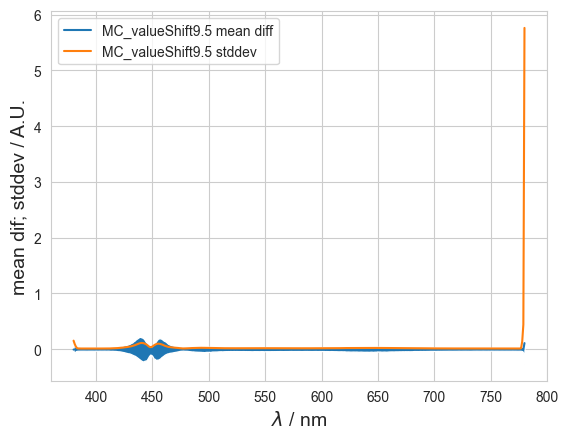

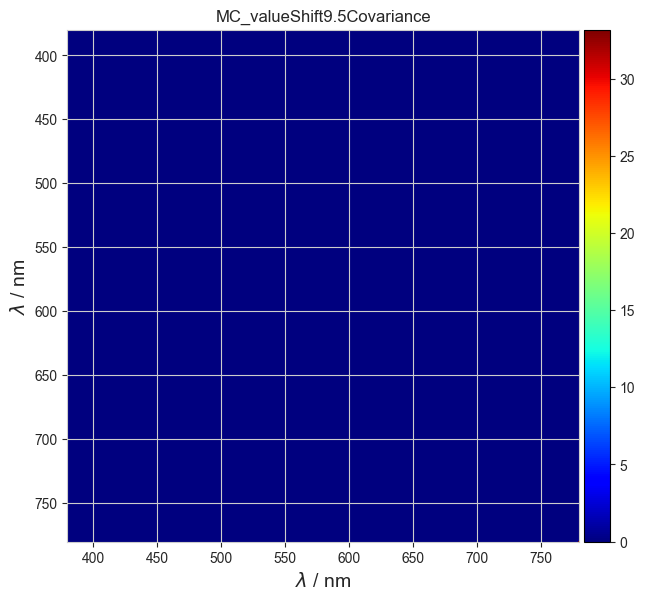

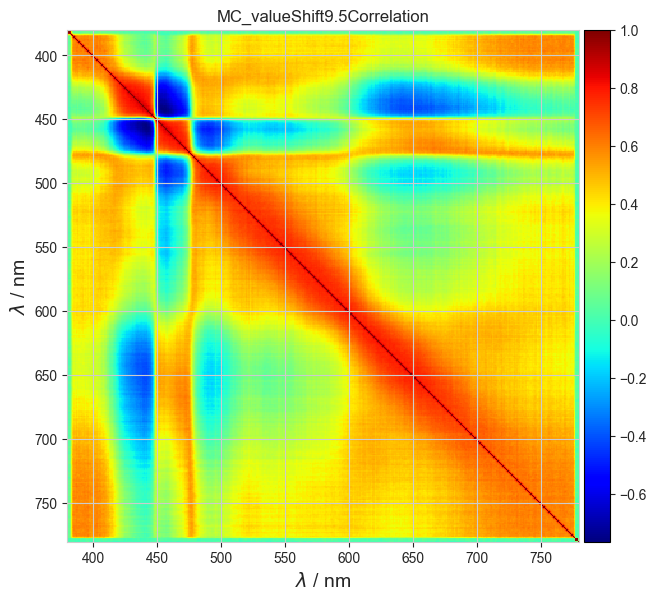

chisquare: 448.690621241841
Difference Vecotr: [-3.6182e-03 -1.4694e-03 -4.2215e-04 -6.2127e-04 -2.7313e-04 -6.9012e-04
 -9.9366e-04 -1.0022e-03 -1.1178e-03 -1.8434e-03 -1.8424e-03 -2.4552e-03
 -2.6190e-03 -3.0656e-03 -3.5258e-03 -4.5472e-03 -5.1527e-03 -5.9428e-03
 -6.7946e-03 -8.2705e-03 -1.0085e-02 -1.1393e-02 -1.3607e-02 -1.6296e-02
 -1.8624e-02 -2.1479e-02 -2.5677e-02 -3.0205e-02 -3.5280e-02 -4.0200e-02
 -4.7043e-02 -5.4111e-02 -6.1658e-02 -6.9464e-02 -7.8727e-02 -8.7946e-02
 -9.7926e-02 -1.0979e-01 -1.2216e-01 -1.3491e-01 -1.4803e-01 -1.6322e-01
 -1.7930e-01 -1.9538e-01 -2.1438e-01 -2.3551e-01 -2.5798e-01 -2.8645e-01
 -3.1528e-01 -3.4666e-01 -3.7926e-01 -4.1192e-01 -4.4274e-01 -4.6943e-01
 -4.8543e-01 -4.9506e-01 -4.9315e-01 -4.7750e-01 -4.4383e-01 -3.9233e-01
 -3.2911e-01 -2.5186e-01 -1.6418e-01 -7.2334e-02 2.2557e-02 1.1693e-01
 2.0363e-01 2.7796e-01 3.3687e-01 3.8237e-01 4.0933e-01 4.2184e-01
 4.1814e-01 4.0441e-01 3.8017e-01 3.5023e-01 3.1885e-01 2.8530e-01
 2.5470e-01 2.2705

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.1863e-02 -3.7266e-03] 0.012434461558954741
Resulting Covariance Matrix: [[1.1729e-05 4.5372e-06]
 [4.5372e-06 1.3394e-05]]
dy: 0.007186069359140588
DoE: 1.7303564629721067
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375612  6.443609e-04   
0           wl_noise_c    0    1.0  0       normal  0.375644  1.321422e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375623  1.871504e-03   
0       value_noise_nc    0   0.01  0       normal  0.375609  2.220051

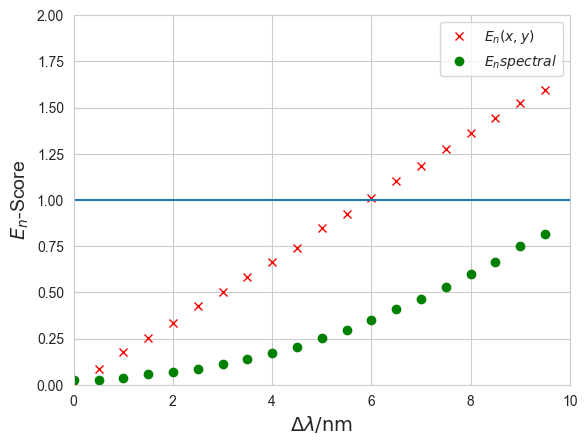

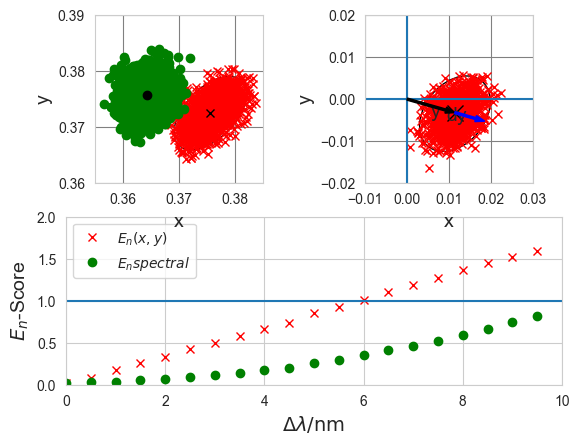

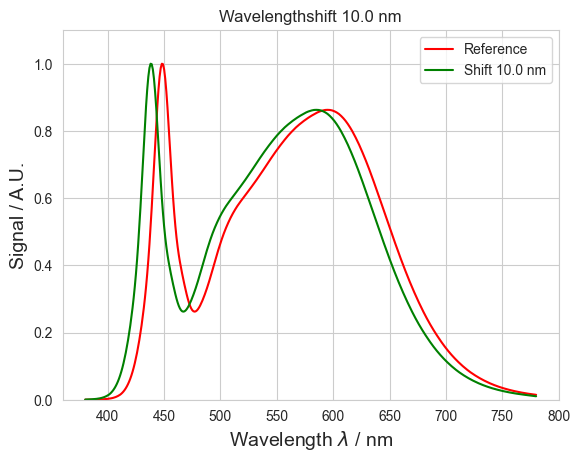

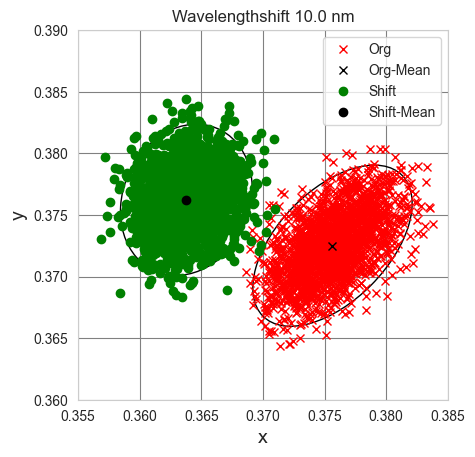

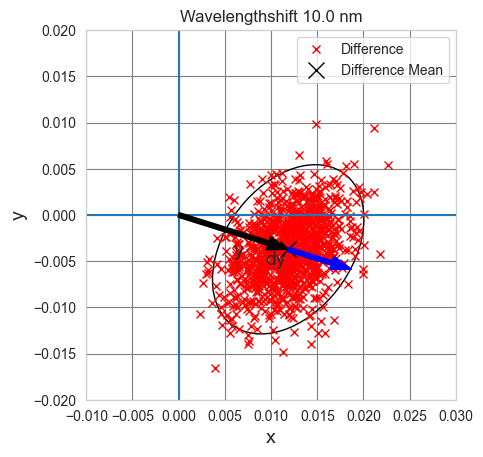

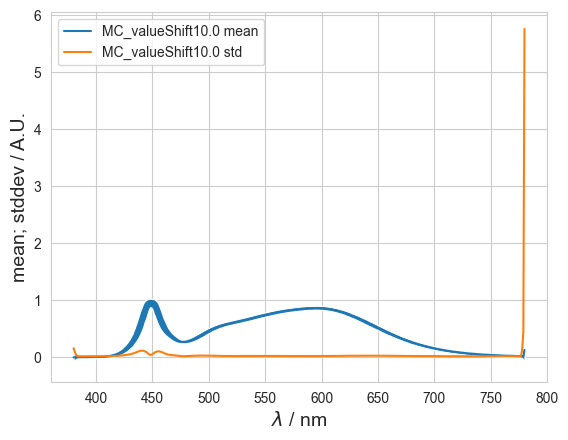

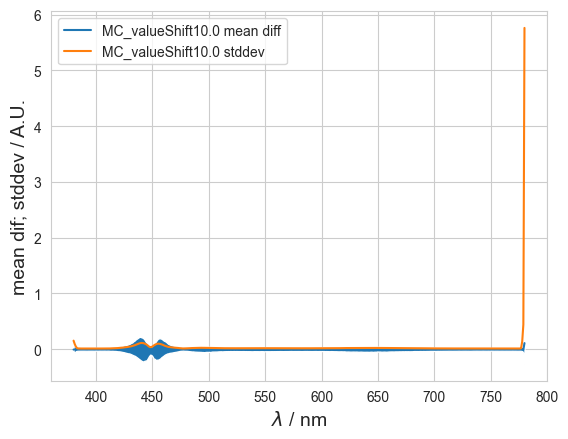

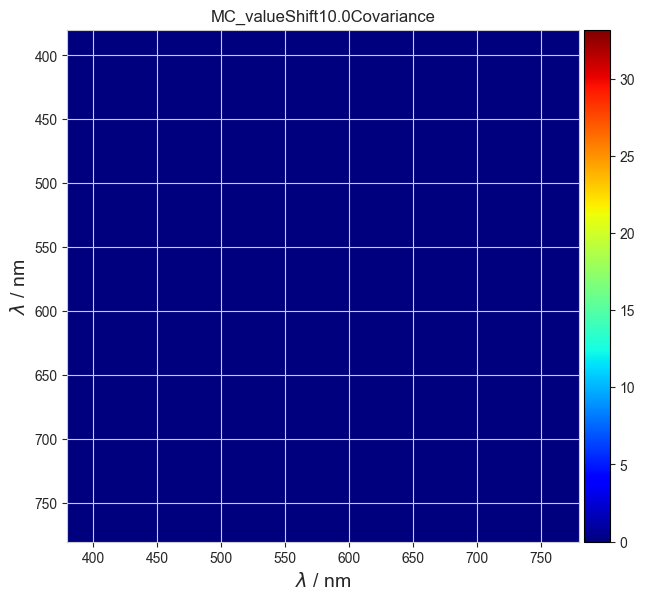

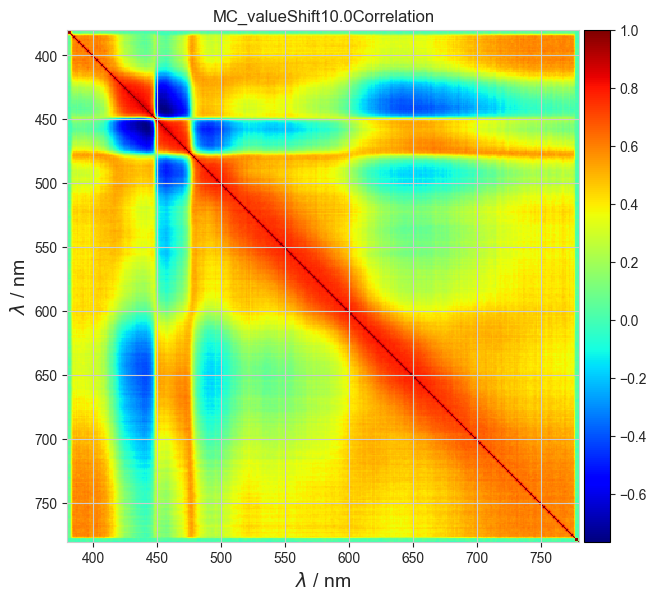

chisquare: 448.690621241841
Difference Vecotr: [-2.9361e-02 -1.1115e-02 -9.6751e-04 -1.9456e-03 -1.6226e-03 -1.1847e-03
 -1.2626e-03 -1.0086e-03 -1.2902e-03 -1.8208e-03 -2.1256e-03 -2.8903e-03
 -2.9928e-03 -3.2895e-03 -4.1386e-03 -5.0252e-03 -5.5214e-03 -6.5581e-03
 -7.7491e-03 -9.0634e-03 -1.1215e-02 -1.3289e-02 -1.5704e-02 -1.7943e-02
 -2.0985e-02 -2.4591e-02 -2.8800e-02 -3.3127e-02 -3.8804e-02 -4.4638e-02
 -5.1515e-02 -5.9661e-02 -6.7847e-02 -7.6469e-02 -8.6137e-02 -9.6738e-02
 -1.0819e-01 -1.1996e-01 -1.3309e-01 -1.4605e-01 -1.6164e-01 -1.7688e-01
 -1.9340e-01 -2.1317e-01 -2.3313e-01 -2.5690e-01 -2.8181e-01 -3.1327e-01
 -3.4400e-01 -3.7706e-01 -4.1240e-01 -4.4632e-01 -4.7595e-01 -4.9879e-01
 -5.1555e-01 -5.1957e-01 -5.1109e-01 -4.8950e-01 -4.4915e-01 -3.9206e-01
 -3.2169e-01 -2.3758e-01 -1.4393e-01 -4.7105e-02 5.0364e-02 1.4582e-01
 2.3310e-01 3.0591e-01 3.6283e-01 4.0637e-01 4.3110e-01 4.4063e-01
 4.3392e-01 4.1798e-01 3.9236e-01 3.6169e-01 3.2882e-01 2.9504e-01
 2.6381e-01 2.3564

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_14028\4229732314.py:50: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


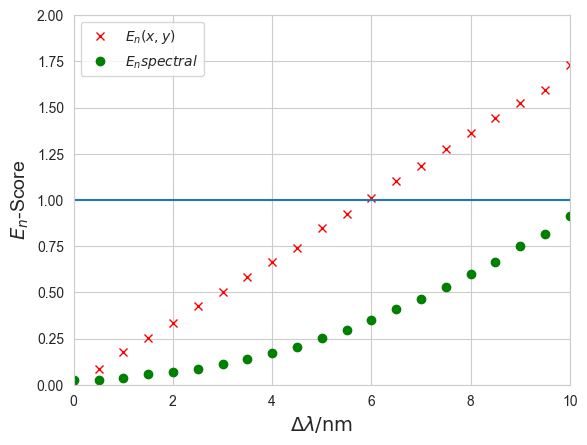

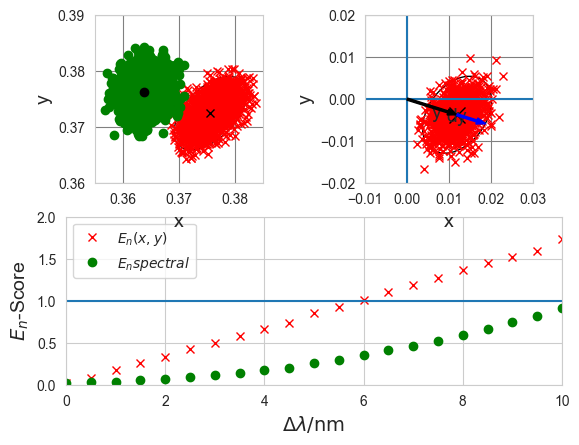

In [20]:
sample_number = 21
shift_range = 10
shift_field = np.zeros((sample_number))
DoE_xy = np.zeros((sample_number))
DoE_md = np.zeros((sample_number))
for i, shift in zip(range( sample_number), np.linspace(0, shift_range, sample_number)):
    shift_field[i]=shift
    spd_wlshift = lx.cie_interp(spd_init, \
            wl_new = shift + np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
    spd_wlshift[0] = spd_init[0]
    fig, ax = pyplot.subplots()
    plot_SD( fig, ax, spd_init, spd_wlshift, shift)
    add_frame( video_writer_L41, frame_size_v)

    mcSpectrumSamples2 = make2ndMC(shift, spd_wlshift)
    fig1, ax1 = pyplot.subplots()
    plotxySingle(fig, ax1, shift, mcSpectrumSamples2)
    add_frame( video_writer_single, frame_size_1)

    x1, cov1 = calcMeanCov(mcSpectrumSamples)
    x2, cov2 = calcMeanCov(mcSpectrumSamples2)
    d, dy, V, data = calc_multiDim_DoE(x1, cov1, x2, cov2)
    fig2, ax2 = pyplot.subplots()
    plot_multi_DoE(fig2, ax2, shift, d, dy, V, data)
    add_frame( video_writer_diff, frame_size_1)

    cov_image2 = showResults(mcSpectrumSamples, 'MC_valueShift'+str(shift))
    sd1 = mcSpectrumSamples.v_mean
    sd2 = mcSpectrumSamples2.v_mean
    d1, dy1, V1, data1 = calc_multiDim_DoE(sd1, cov_image, sd2, cov_image2)
    DoE_xy[i] = 1/dy
    DoE_md[i] = 1/dy1
    fig3, ax3 = pyplot.subplots()
    plot_DoE( fig3, ax3, shift_field[:i+1], DoE_xy[:i+1], DoE_md[:i+1])
    add_frame( video_writer_DoE, frame_size_v)


    fig4, ax4 = pyplot.subplots()
    ax1 = pyplot.subplot(212)
    plot_DoE( fig, ax1, shift_field[:i+1], DoE_xy[:i+1], DoE_md[:i+1])
    ax2 = pyplot.subplot(221)
    plotxySingle(fig, ax2, shift, mcSpectrumSamples2, legend=False)
    ax3 = pyplot.subplot(222)
    plot_multi_DoE(fig, ax3, shift, d, dy, V, data, legend=False)
    add_frame( video_writer_ges, frame_size_v)
    add_frame( video_writer_ges, frame_size_v)

    fig4, ax4 = pyplot.subplots()
    ax2 = pyplot.subplot(121)
    plotxySingle(fig, ax2, shift, mcSpectrumSamples2, legend=True)
    ax3 = pyplot.subplot(122)
    plot_multi_DoE(fig, ax3, shift, d, dy, V, data, legend=True)
    add_frame( video_writer_xy, frame_size_v)

    #break

    # delete temp files
    pyplot.clf()
    pyplot.cla()
    pyplot.close()

# close videowirter
video_writer_L41.release()
video_writer_single.release()
video_writer_diff.release()
video_writer_DoE.release()
video_writer_ges.release()
video_writer_xy.release()
cv2.destroyAllWindows()

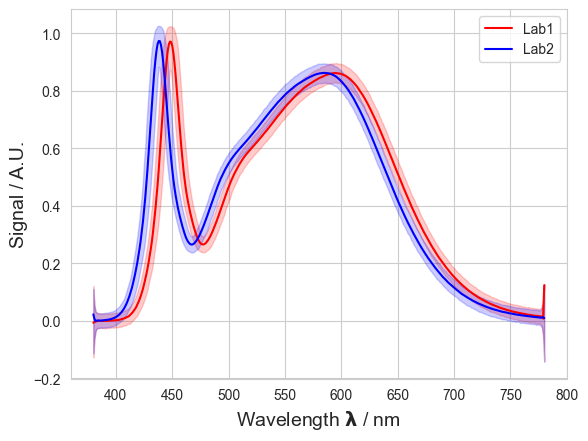

In [21]:
def plot_MU(ax1, samples, name, color):
    v_wl_ref, v_wl, v_wl_diff, v_mean, v_mean_diff, v_std, q_min, q_max, cov_image, corr_image, counts = samples.get_result()

    ax1.plot( v_wl_ref, v_mean, label=name, color=color)
    ax1.fill_between( v_wl_ref, q_min, q_max, alpha = 0.2, color=color)
    ax1.set_xlabel('Wavelength $\mathbf{\lambda}$ / nm', fontsize=label_font_size)
    ax1.set_ylabel( 'Signal / A.U.', fontsize=label_font_size)
    ax1.legend()

fig, ax1 = pyplot.subplots()
plot_MU( ax1, mcSpectrumSamples, 'Lab1', 'r')
plot_MU( ax1, mcSpectrumSamples2, 'Lab2', 'b')
save_fig( dir=out_dir, filename='CompareSD')
